### Imports


In [168]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

comp='shannon'
import sys  # update paths
sys.path.append('../../')

import os 
import numpy as np 
import matplotlib.pyplot as plt
import copy
import meas_analysis.handy as hy
import scresonators.fit_resonator.ana_resonator_vic as ana_res
import scresonators.fit_resonator.ana_resonator as ana_res_shannon
import scresonators.fit_resonator.ana_tls_vic as ana_tls
import seaborn as sns
import scipy.constants as cs
from scipy.optimize import curve_fit

colors = ['#4053d3', '#b51d14', '#ddb310','#658b38','#7e1e9c', '#75bbfd', '#cacaca']
sns.set_palette(colors)

if comp=='shannon':
    pth_base ='/Users/sph/Library/CloudStorage/GoogleDrive-circuitqed@gmail.com/'
elif comp=='bf1':
    pth_base='G:/'

folder = 'My Drive/Projects/Materials/'
pth = pth_base+folder
img_pth = pth+'Outputs/Resonators/'

#sample_dict = {'no hf':['240725'], 'hf':['240719', '240729', '240729-2', '240729-3', '240729-6'], 'hf-soc0':['240729-5','240729-6'], 'hf-soc0':[], 'scalinq':['240814-2'], 'silicon-scalinq':['silicon-scalinq-1']}

sample_dict = {'no hf':{'meas':['240725']}, 'hf':['240719', '240729', '240729-2', '240729-3', '240729-6'], 'hf-soc0':['240729-5','240729-6'], 'hf-soc0':[], 'scalinq':['240814-2'], 'silicon-scalinq':['silicon-scalinq-1'], '241028':['241028']}


# samples: no hf, hf, scalinq (0729-2 is hf3)
# meas: 240725, 240719, 240729, 240729-2, 240814-2

#meas = 'silicon-scalinq-1'
meas = '241028'

matching_keys = [key for key, items in sample_dict.items() for item in items if item == meas]
sample = matching_keys[0] if matching_keys else None

#sample = 

#sample ='silicon-scalinq'
#meas = sample + '-1'



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [169]:

if sample=='no hf':
    flip = False
    pth = '240725/'
    params = {'atten': -40, 'min_power': -100, 'max_power': -15}
elif sample=='hf':
    flip = True
    pth = '240729/'
    params = {'atten':-50, 'min_power': -100, 'max_power': -25}
elif sample=='hf-soc':
    flip=True
    pth = '240818-Resonator/'
    params = {'atten':-50, 'min_power': -100, 'max_power': 25}
elif sample=='hf-soc0':
    flip=True
    pth = '240816-Resonator/'
    params = {'atten':-50, 'min_power': -100, 'max_power': 25}
elif sample=='scalinq':
    flip = False
    pth = '240814-Resonator/'
    params = {'atten':-65, 'min_power': -100, 'max_power': -15}    
elif sample=='silicon-scalinq':
    flip = True
    pth = '240908-Resonator/'
    params = {'atten':-65, 'min_power': -100, 'max_power': -15}
elif sample=='241028':
    flip = True
    pth = '241028-Resonator/'
    params = {'atten':-65, 'min_power': -55, 'max_power': 50}
else:
    print('Sample not found')

data_pth = pth_base+folder+'Data/'+pth
params['temp'] = 0.04
params['res_name']=meas
params['sample']=sample
if flip: 
    params['pitch'] = [10, 12, 14, 2, 16, 4, 6, 8]
    params['target_freq'] =[5.9, 6.2, 6.5, 7, 6.7, 7.2, 7.5, 7.9]
else: 
    params['pitch'] = [10, 12, 14, 16, 2, 4, 6, 8]
    params['target_freq'] =[5.9, 6.2, 6.5, 6.7, 7, 7.2, 7.5, 7.9]

## Sweep power/temp, plot results

### Run sweep 

In [170]:
import time
def analyze_sweep_mux(directories, pth_base, img_pth, name='res', plot=None, min_power=-100, slope=0):
    pattern0 = r'res_(\d+)'

    # Initialize dict by getting list of resonators, creating dict with len = n resonators
    resonators, file_list = ana_res.get_resonators(directories[0],pth_base, pattern0)
    res_params = [None] * len(resonators)
    for i in range(len(resonators)):
        res_params[i] = {'freqs':[], 'phs':[], 'q':[], 'qi':[], 'qc':[], 'qi_phi':[], 'pow':[], 'qi_err':[], 'q_err':[], 'phs_err':[], 'qc_err':[], 'qc_real_err':[], 'f_err':[]}
    
    # Each directory is a temperature 
    for i in range(len(directories)): 
        start = time.time()
        print(i)
        output_path = img_pth+'/Images/'+name+'_' + directories[i] + '/'
        resonators, file_list0 = ana_res.get_resonators(directories[i], pth_base, pattern0)
        pth = pth_base + directories[i]
        for j in range(len(resonators)): 
            # Grab all the files for a given resonator, then sort by power. 
            pattern = 'res_{:d}_'.format(resonators[j]) + '(\d+)'
            file_list = ana_res.get_resonator_power_list(pattern, file_list0)
            
            params, err, power = [], [], []
            for k in range(len(file_list)):
                data, attrs = ana_res.grab_data(pth, file_list[k],  meas_type='soc', slope=slope)
                power.append(-float(file_list[k][9:])-20)
                
                try:                                            
                    output = ana_res.fit_resonator(data, file_list[k], output_path, plot=plot)
                    params.append(output[0])
                    err.append(output[1])
                except Exception as error:
                    print("An exception occurred:", error) 
                    params.append(np.nan*np.ones(4))
                    err.append(np.nan*np.ones(6))
            res_params = ana_res.stow_data(params, res_params, j, power, err)
            
            print('Time elapsed: ', time.time()-start)            

    for i in range(len(resonators)):
        for key in res_params[i].keys():
            res_params[i][key] = np.array(res_params[i][key])

    return res_params

### Just images

Counter({7988: 5, 6992: 5, 6680: 5, 7067: 5, 5982: 5, 6321: 5, 6692: 5, 7475: 5})
0
Counter({7988: 5, 6992: 5, 6680: 5, 7067: 5, 5982: 5, 6321: 5, 6692: 5, 7475: 5})
['res_5982_24', 'res_5982_18', 'res_5982_12', 'res_5982_6', 'res_5982_0']
2.1263111872980383
3.8276730910624397
6.989531678952292
12.489132090832099
24.221295317316617
dict_keys(['amps', 'avgi', 'avgq', 'phases', 'xpts', 'lin', 'freqs'])
[-24.0, -18.0, -12.0, -6.0, -0.0]
['res_6321_24', 'res_6321_18', 'res_6321_12', 'res_6321_6', 'res_6321_0']
4.543752981165088
8.819286214357197
17.78475483568378
34.28357994027358
67.85008766887724
dict_keys(['amps', 'avgi', 'avgq', 'phases', 'xpts', 'lin', 'freqs'])
[-24.0, -18.0, -12.0, -6.0, -0.0]
['res_6680_24', 'res_6680_18', 'res_6680_12', 'res_6680_6', 'res_6680_0']
3.140148766504016
6.095807740603176
12.33005227521386
23.97346370290159
47.929706616646115
dict_keys(['amps', 'avgi', 'avgq', 'phases', 'xpts', 'lin', 'freqs'])
[-24.0, -18.0, -12.0, -6.0, -0.0]
['res_6692_24', 'res_6692

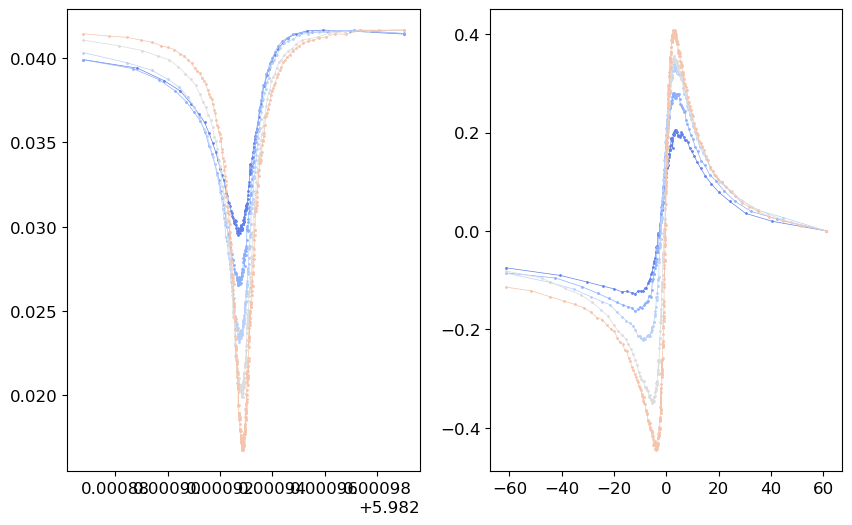

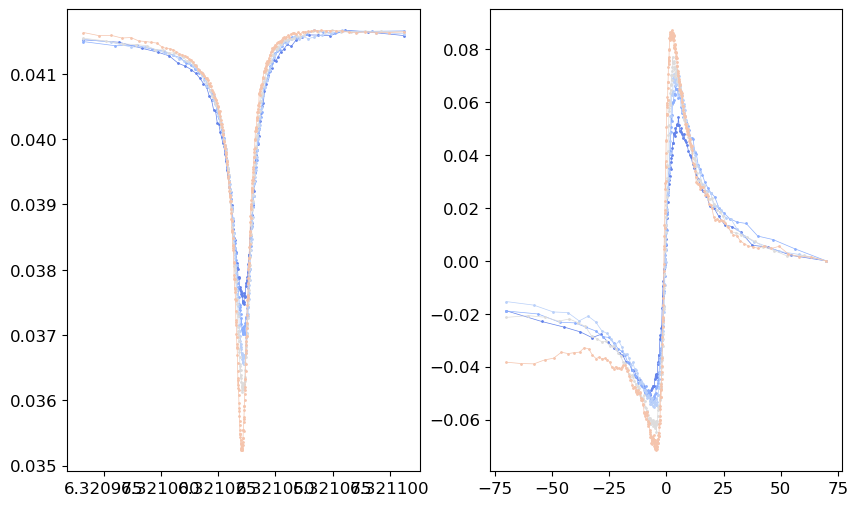

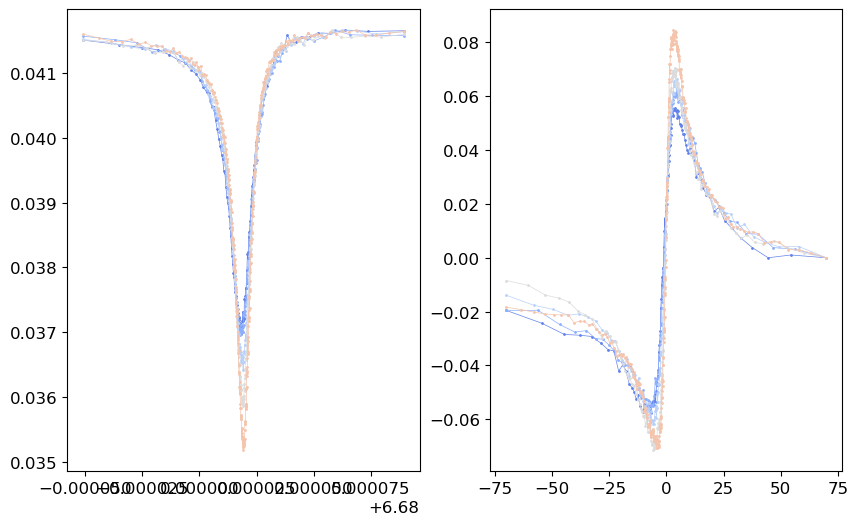

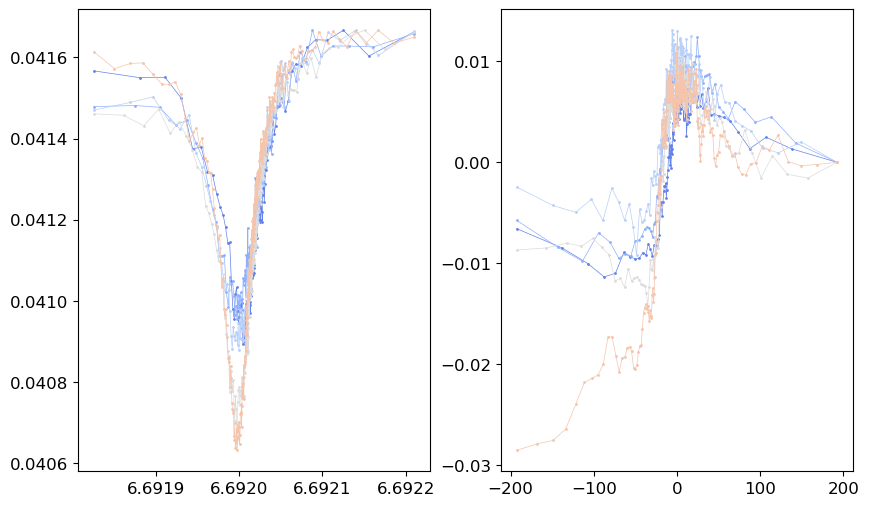

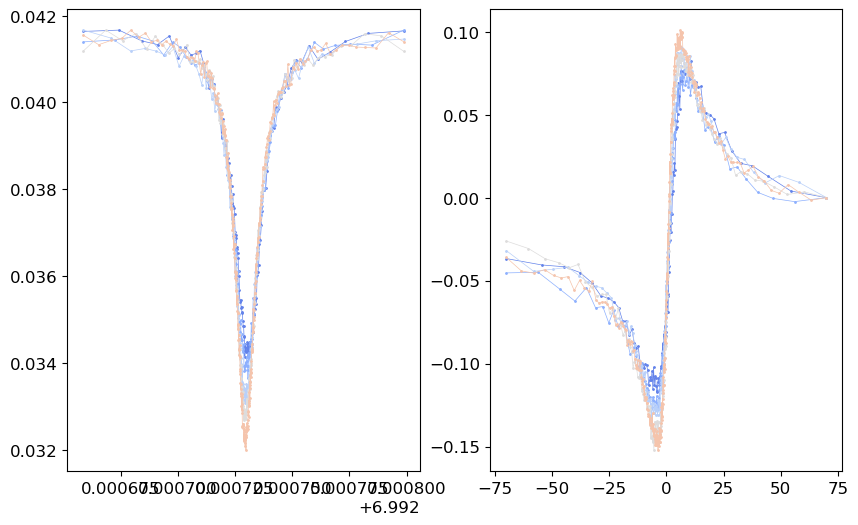

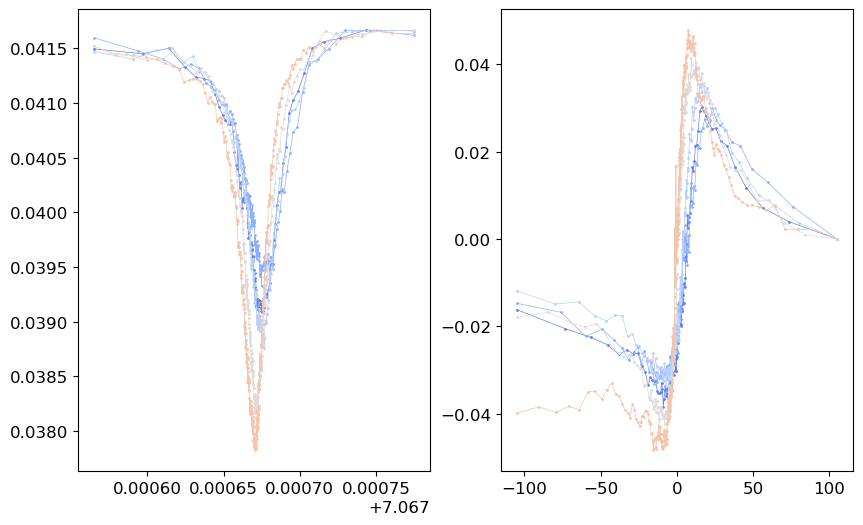

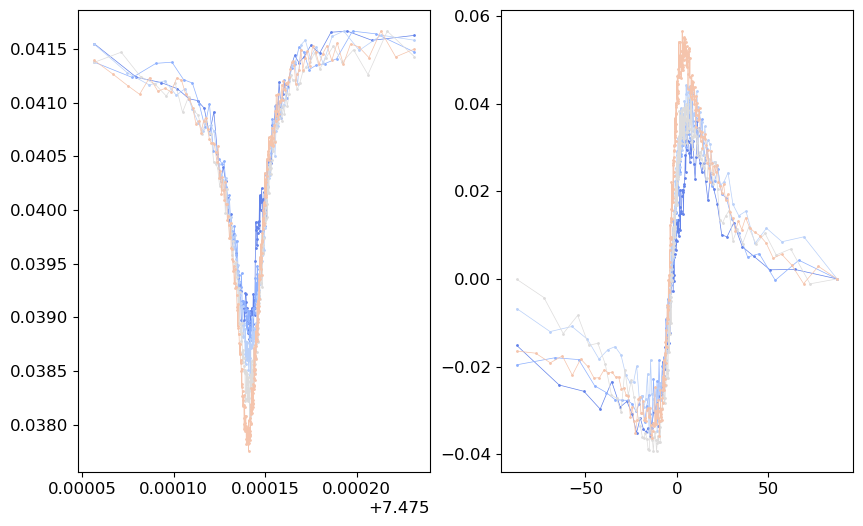

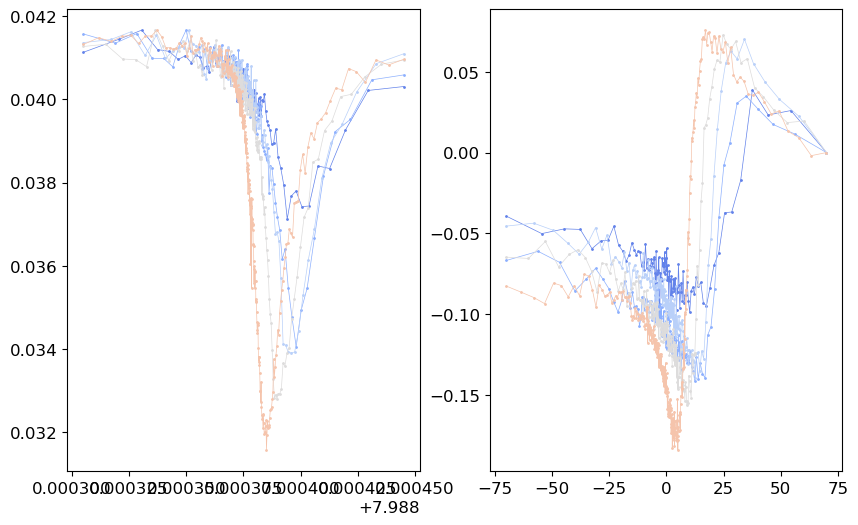

In [171]:
import time
import seaborn as sns 
xy=False
sns.set_palette('coolwarm',7)

def analyze_sweep_mux_plot(directories, pth_base, img_pth, name='res', plot=None, min_power=-100, slope=0):
    pattern0 = r'res_(\d+)'

    # Initialize dict by getting list of resonators, creating dict with len = n resonators
    resonators, file_list = ana_res.get_resonators(directories[0],pth_base, pattern0)
    res_params = [None] * len(resonators)
    for i in range(len(resonators)):
        res_params[i] = {'freqs':[], 'phs':[], 'q':[], 'qi':[], 'qc':[], 'qi_phi':[], 'pow':[], 'qi_err':[], 'q_err':[], 'phs_err':[], 'qc_err':[], 'qc_real_err':[], 'f_err':[]}
    
    # Each directory is a temperature 
    for i in range(len(directories)): 
        start = time.time()
        print(i)
        output_path = img_pth+'/Images/'+name+'_' + directories[i] + '/'
        resonators, file_list0 = ana_res.get_resonators(directories[i], pth_base, pattern0)
        pth = pth_base + directories[i]
        
        for j in range(0,8): 
            fig, ax = plt.subplots(1,2, figsize=(10,6))
            # Grab all the files for a given resonator, then sort by power. 
            pattern = 'res_{:d}_'.format(resonators[j]) + '(\d+)'
            file_list = ana_res.get_resonator_power_list(pattern, file_list0)
            
            params, err, power = [], [], []
            for k in range(len(file_list)):
                data, attrs = ana_res.grab_data(pth, file_list[k],  meas_type='soc', slope=slope)
                #data, attrs = ana_res.grab_data(pth, file_list[k],  meas_type='corr_offset', slope=slope)
                #print(data['phases'])
                #ana_res.plot_raw_data(data,xy=False, circ=False)
                power.append(-float(file_list[k][9:]))
                phs_off=0
                amp_off=0                
                phs = data["phases"] + phs_off
                amp = 10 ** ((data["amps"] - amp_off) / 20)
                max_amp = np.max(amp)
                #max_amp = 10**(power[-1]/20)
                if xy:                        
                    ax[0].plot(data["freqs"] / 1e9, data["avgi"][0]/max_amp, ".-", markersize=2, linewidth=0.5)
                    ax[1].plot(data["freqs"] / 1e9, data["avgq"][0]/max_amp, ".-", markersize=2, linewidth=0.5)
                else:
                    print(max_amp)
                    ax[0].plot(data["freqs"] / 1e9, amp/max_amp/24, ".-", markersize=2, linewidth=0.5)
                    ax[1].plot((data["freqs"]-np.mean(data["freqs"])) / 1e3, phs, ".-", markersize=2, linewidth=0.5)
            print(data.keys())

            print(power)


meas_type='soc'
directories=['powersweep15']
nfiles =1
res_params = analyze_sweep_mux_plot(directories, data_pth,img_pth, name=params['res_name'], plot=True, slope=28.4) # slope=28.45)




Counter({7988: 11, 7475: 11, 6992: 11, 6321: 11, 6680: 11, 5982: 11, 7067: 11, 6692: 11, 3000: 2})
0
Counter({7988: 11, 7475: 11, 6992: 11, 6321: 11, 6680: 11, 5982: 11, 7067: 11, 6692: 11, 3000: 2})
['res_3000_3', 'res_3000_0']


8.073365667616823
1.3581233782344373


/opt/anaconda3/lib/python3.11/site-packages/lmfit/confidence.py:317: UserWarning: Bound reached with prob(Qc=49.66080170113488) = 0.0 < max(sigmas)
  warn(errmsg)
/opt/anaconda3/lib/python3.11/site-packages/lmfit/confidence.py:330: UserWarning: rel_change=-1.0 < 1e-05 at iteration 2 and prob(Qc=69.52898079336475) = 0.0 < max(sigmas)
  warn(errmsg)
/opt/anaconda3/lib/python3.11/site-packages/lmfit/confidence.py:317: UserWarning: Bound reached with prob(phi=-3.141592653589793) = 0.0 < max(sigmas)
  warn(errmsg)


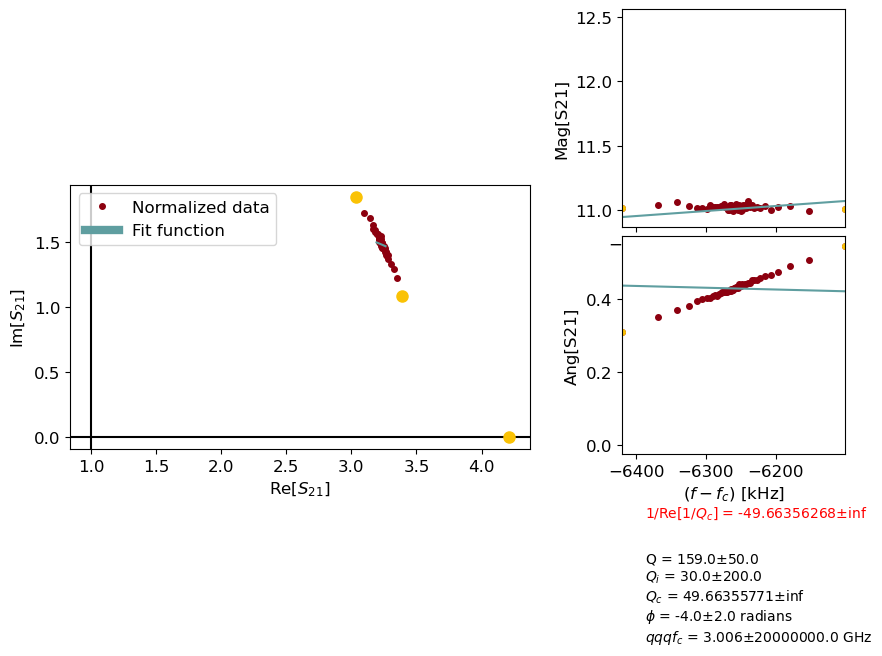

16.707633808147925
1.343808802072634
attempt to get argmin of an empty sequence
>Failed to find initial guess for method DCM.  Please manually initialize a guess
An exception occurred: name 'quit' is not defined
Time elapsed:  18.878092050552368
['res_5982_30', 'res_5982_27', 'res_5982_24', 'res_5982_21', 'res_5982_18', 'res_5982_15', 'res_5982_12', 'res_5982_9', 'res_5982_6', 'res_5982_3', 'res_5982_0']
15.945146066585108
0.5595095299810622
Qi is less than zero. Please make sure data is of correct format: decibals (log10*20 version), and radians. Otherwise, it is quite likely that the resonator being fit is not a Notch type resonator. Other types of resonators will not work with this code.


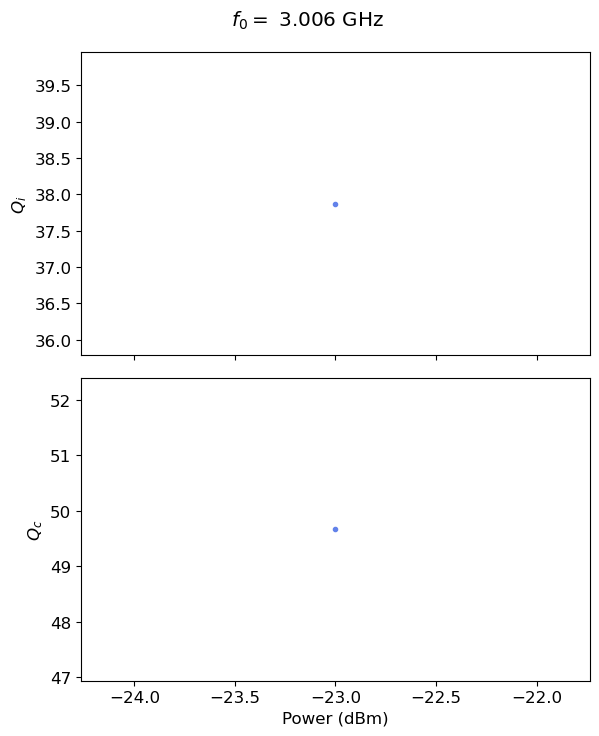

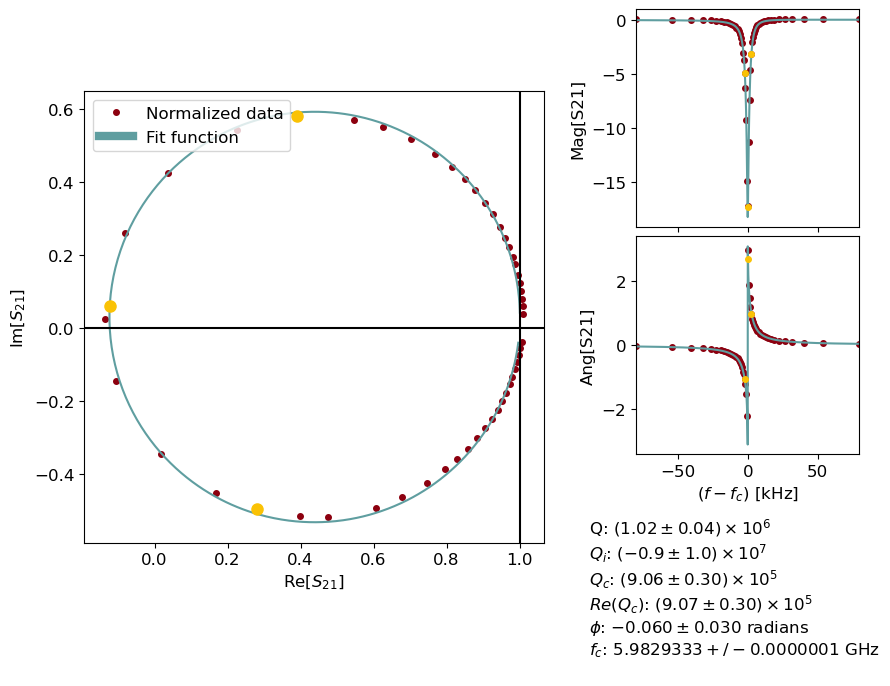

16.000332439557134
0.5606842776850358
Qi is less than zero. Please make sure data is of correct format: decibals (log10*20 version), and radians. Otherwise, it is quite likely that the resonator being fit is not a Notch type resonator. Other types of resonators will not work with this code.


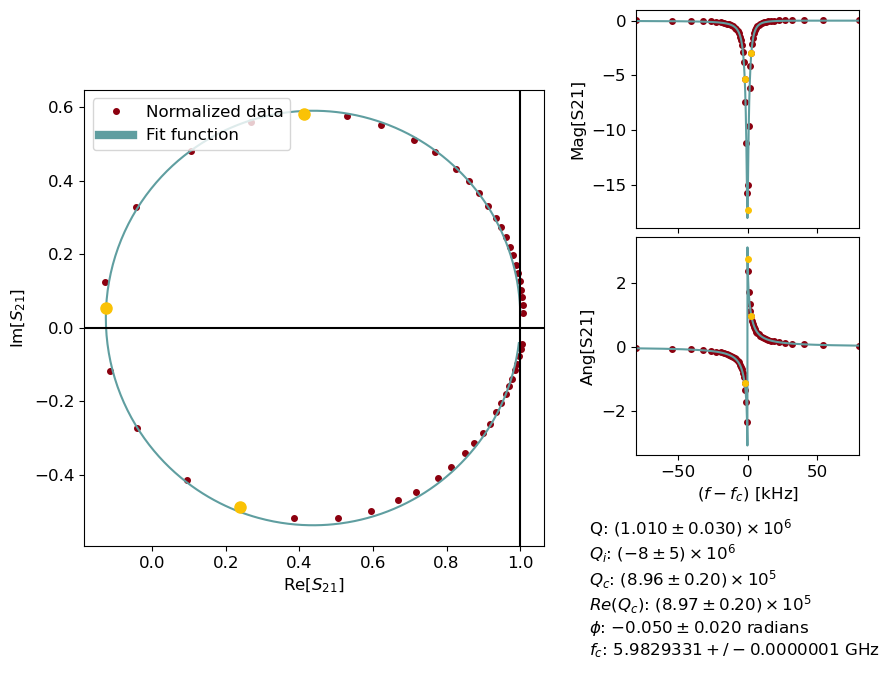

16.006331555187714
0.5602164997036314
Qi is less than zero. Please make sure data is of correct format: decibals (log10*20 version), and radians. Otherwise, it is quite likely that the resonator being fit is not a Notch type resonator. Other types of resonators will not work with this code.


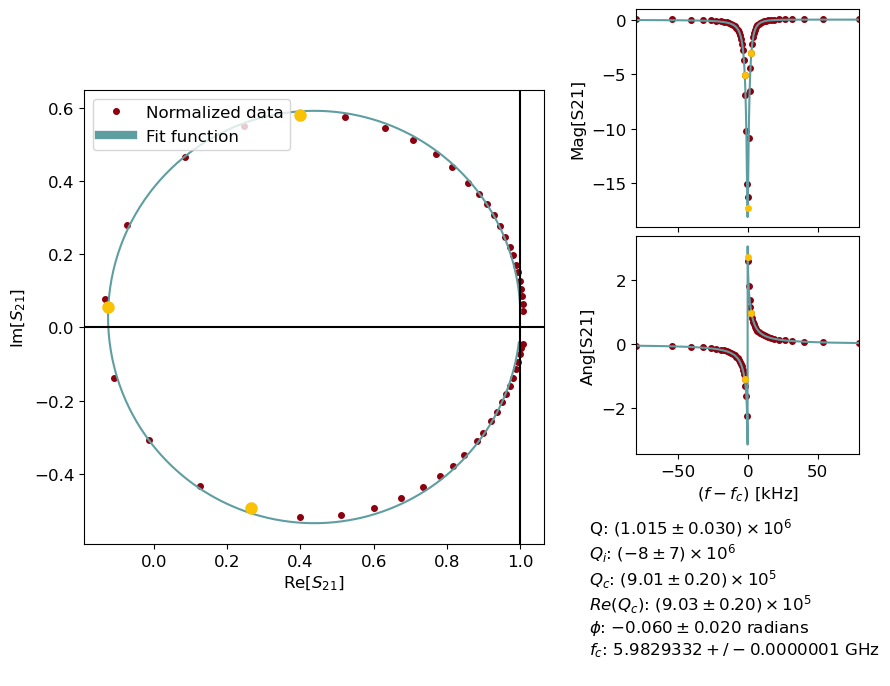

15.96989822783626
0.5593736966747174
Qi is less than zero. Please make sure data is of correct format: decibals (log10*20 version), and radians. Otherwise, it is quite likely that the resonator being fit is not a Notch type resonator. Other types of resonators will not work with this code.


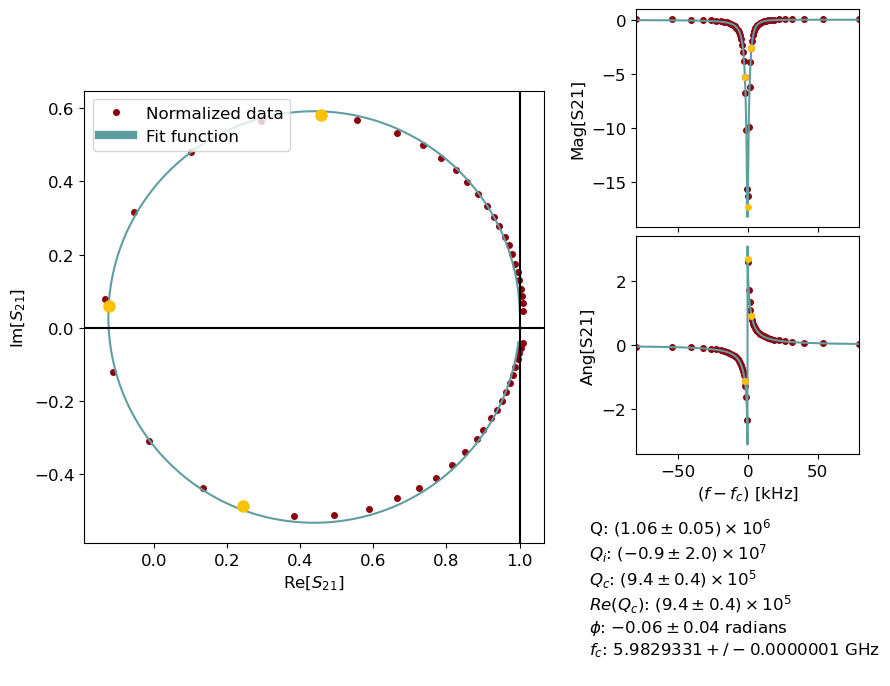

15.98208131908402
0.5605990313771375
Qi is less than zero. Please make sure data is of correct format: decibals (log10*20 version), and radians. Otherwise, it is quite likely that the resonator being fit is not a Notch type resonator. Other types of resonators will not work with this code.


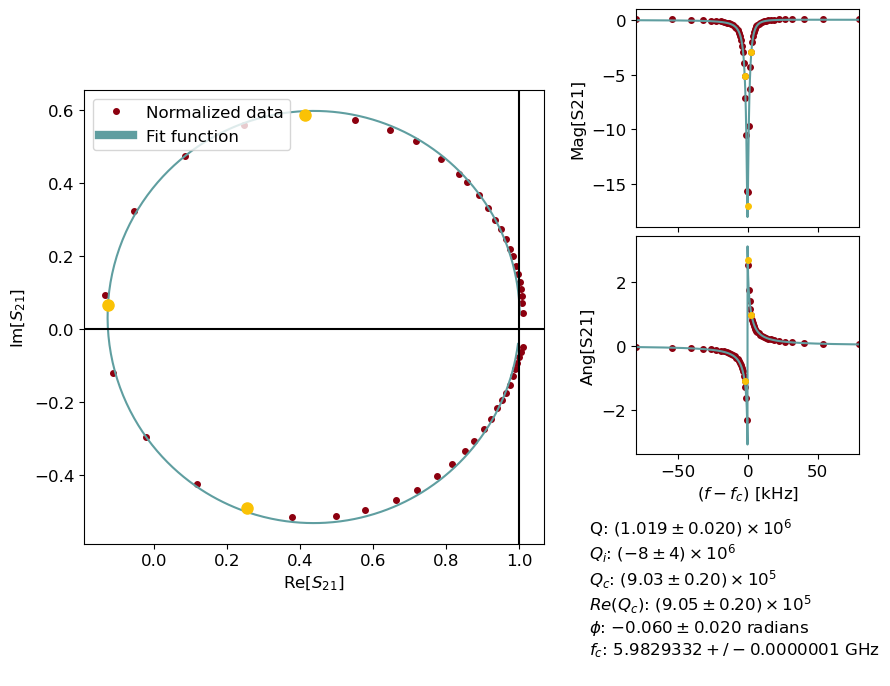

16.021617603208444
0.5617249387316852
Qi is less than zero. Please make sure data is of correct format: decibals (log10*20 version), and radians. Otherwise, it is quite likely that the resonator being fit is not a Notch type resonator. Other types of resonators will not work with this code.


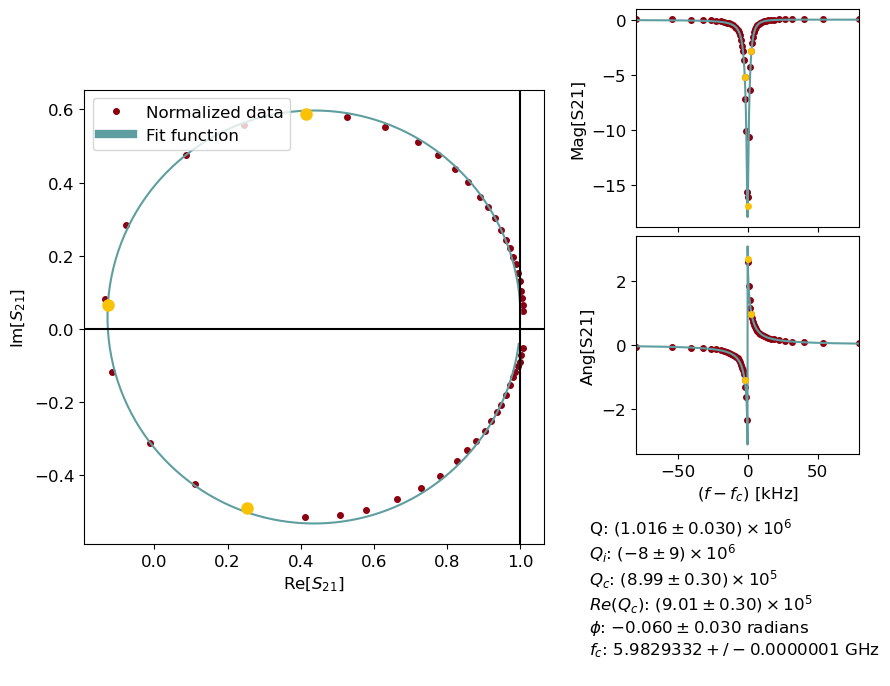

16.073590842953386
0.562878482601752
Qi is less than zero. Please make sure data is of correct format: decibals (log10*20 version), and radians. Otherwise, it is quite likely that the resonator being fit is not a Notch type resonator. Other types of resonators will not work with this code.


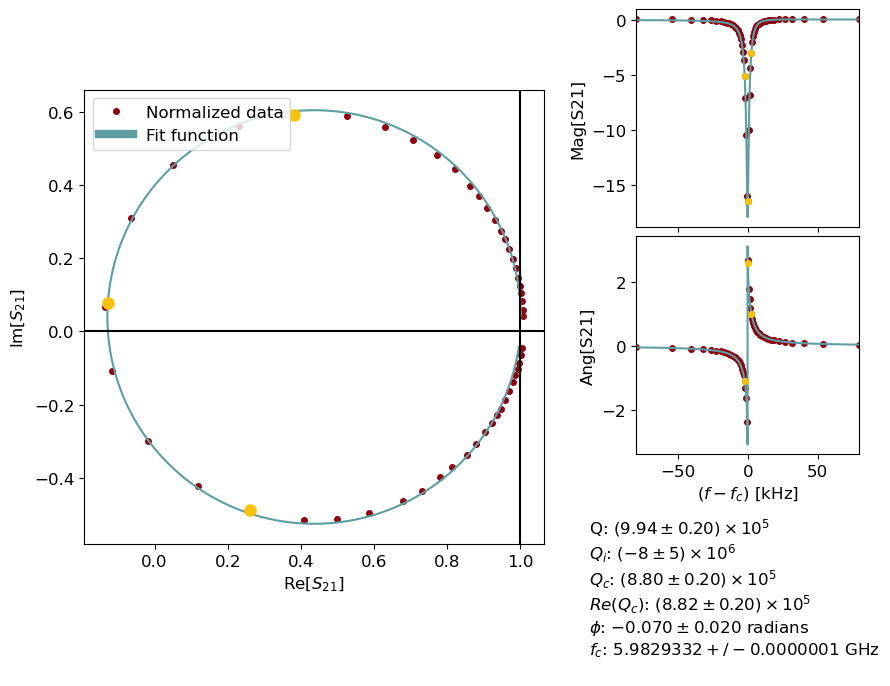

16.090588810795825
0.563125121280419
Qi is less than zero. Please make sure data is of correct format: decibals (log10*20 version), and radians. Otherwise, it is quite likely that the resonator being fit is not a Notch type resonator. Other types of resonators will not work with this code.


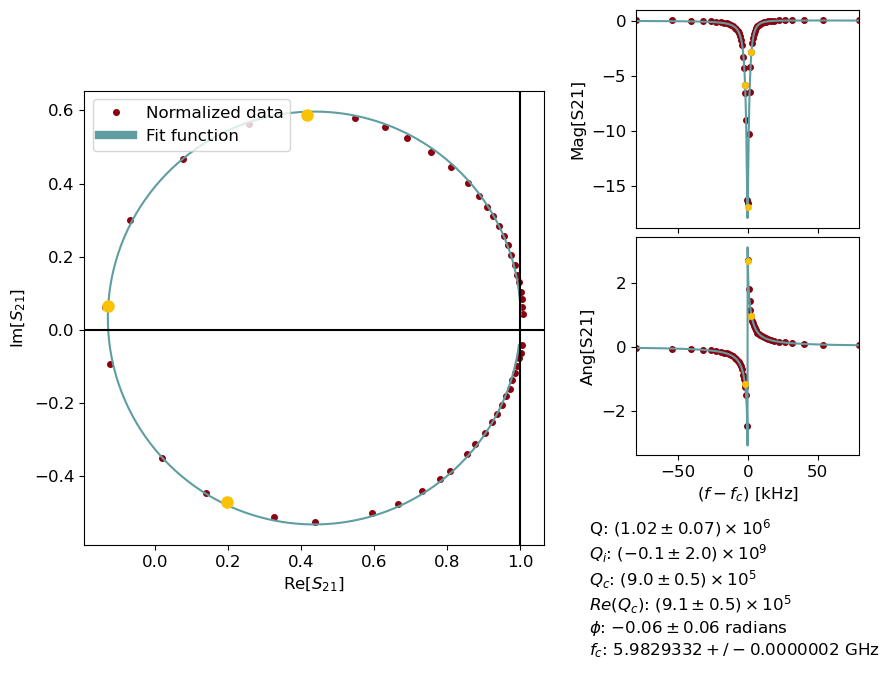

16.06317612454108
0.5625757660295251
Qi is less than zero. Please make sure data is of correct format: decibals (log10*20 version), and radians. Otherwise, it is quite likely that the resonator being fit is not a Notch type resonator. Other types of resonators will not work with this code.


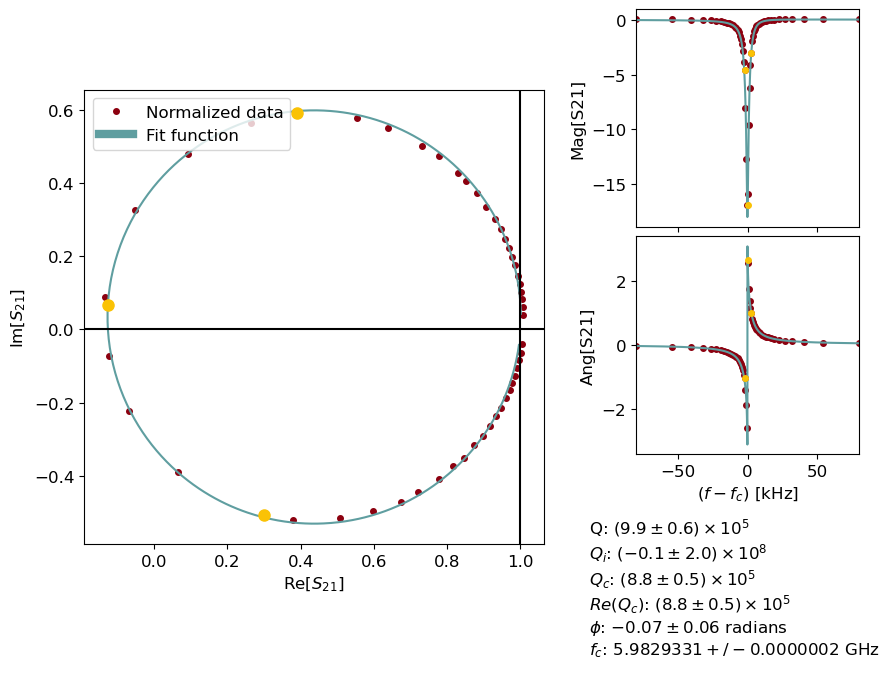

16.066369420401152
0.5622606751832885
Qi is less than zero. Please make sure data is of correct format: decibals (log10*20 version), and radians. Otherwise, it is quite likely that the resonator being fit is not a Notch type resonator. Other types of resonators will not work with this code.


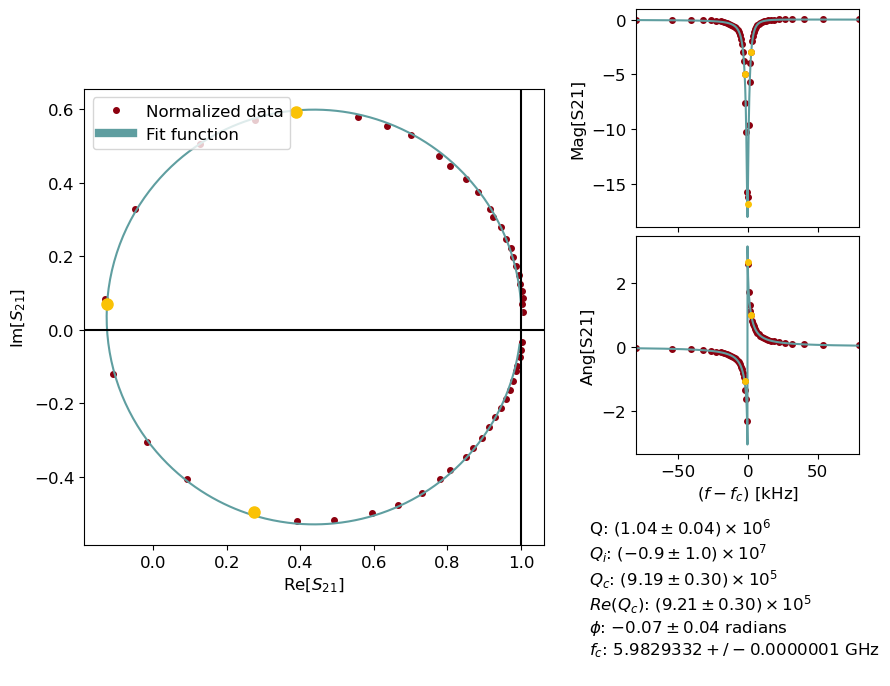

16.00736315107411
0.5601278098286859
Qi is less than zero. Please make sure data is of correct format: decibals (log10*20 version), and radians. Otherwise, it is quite likely that the resonator being fit is not a Notch type resonator. Other types of resonators will not work with this code.


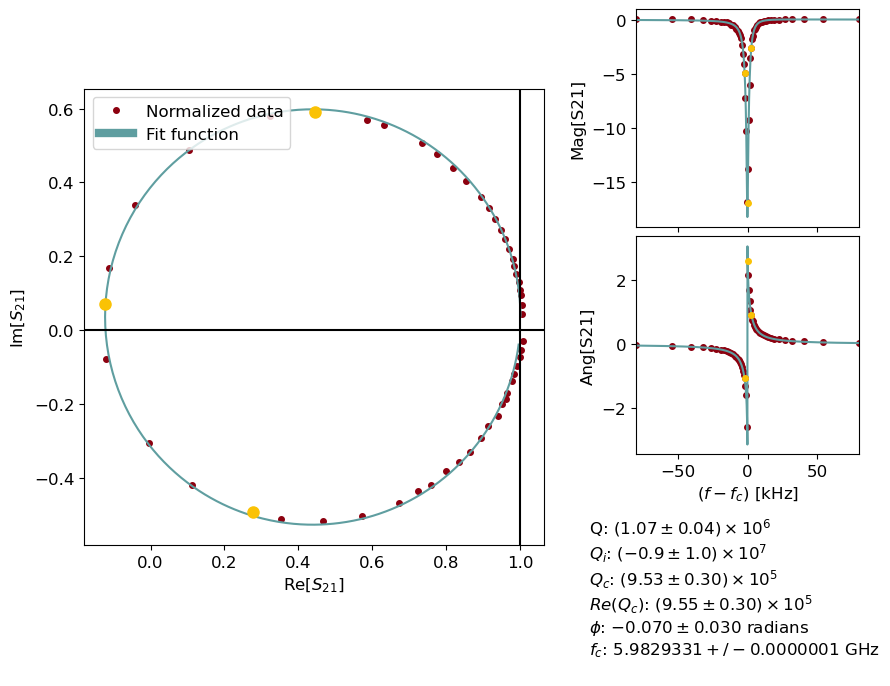

Time elapsed:  120.49470210075378
['res_6321_30', 'res_6321_27', 'res_6321_24', 'res_6321_21', 'res_6321_18', 'res_6321_15', 'res_6321_12', 'res_6321_9', 'res_6321_6', 'res_6321_3', 'res_6321_0']
7.022128358214614
0.17627687704799067


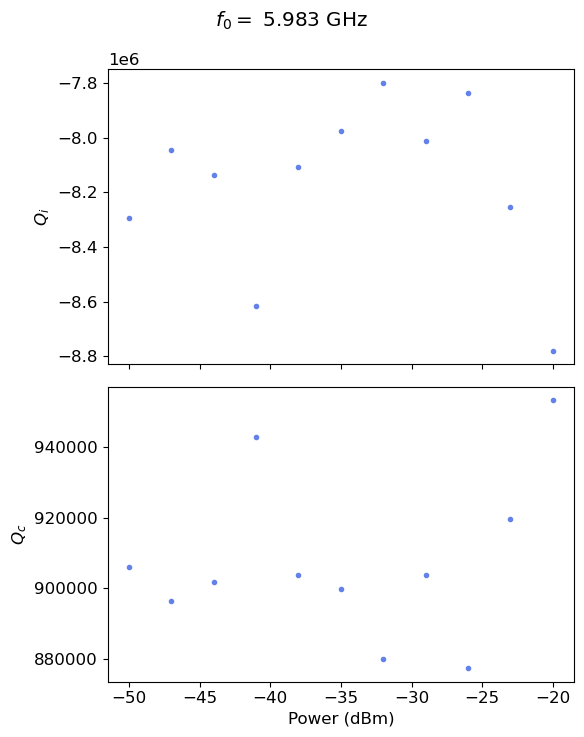

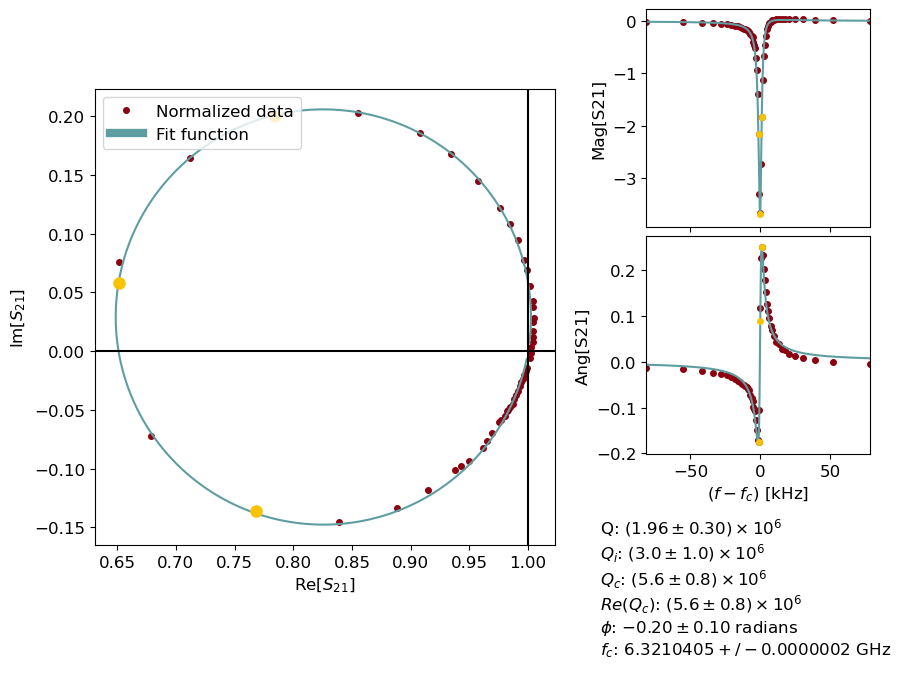

7.05493486979889
0.17665022281730683


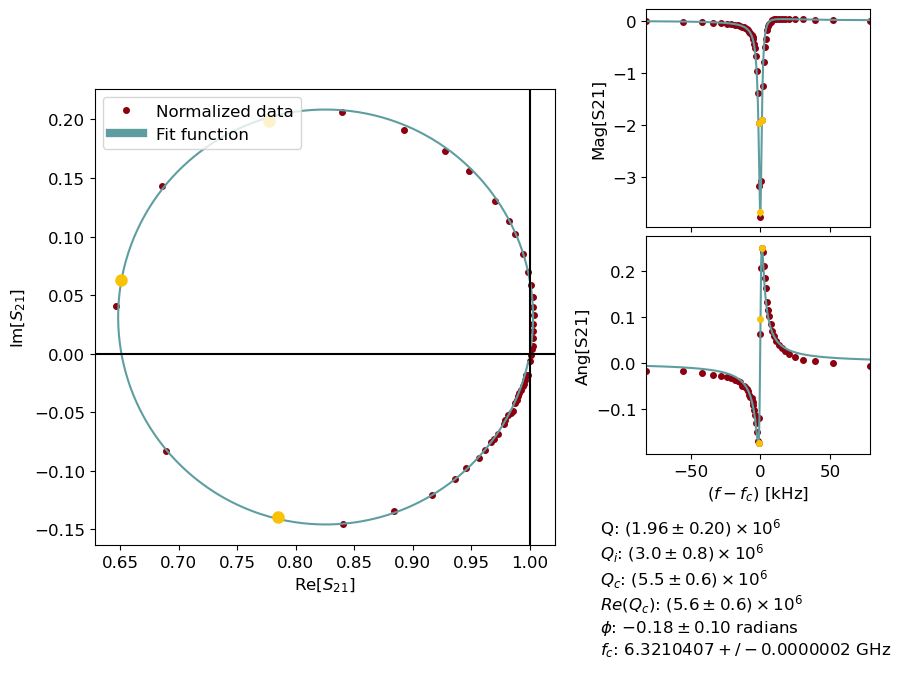

7.068710850735475
0.17704650573457836


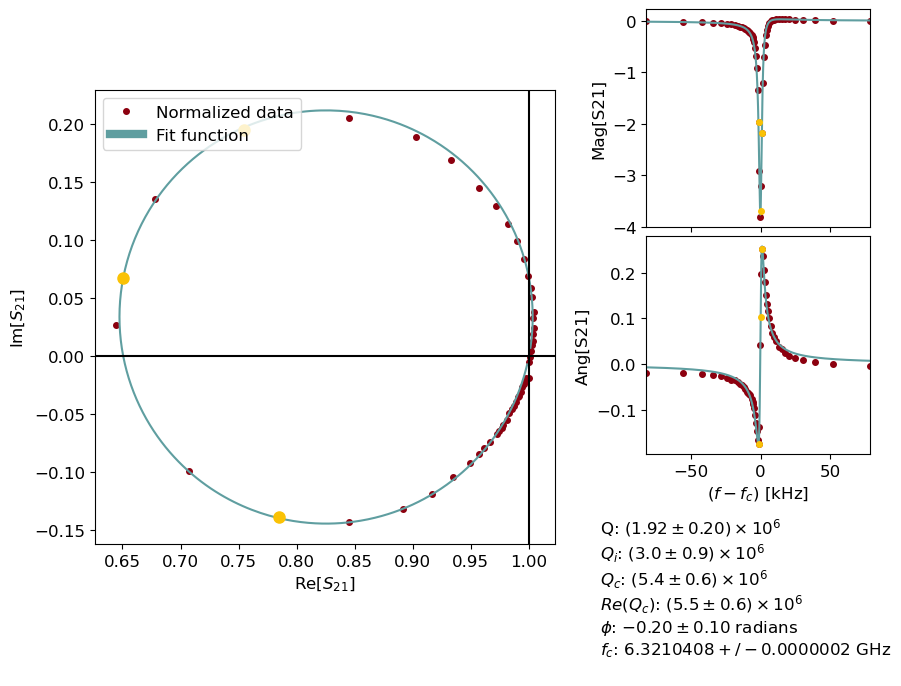

7.049024883162462
0.17634950354243245


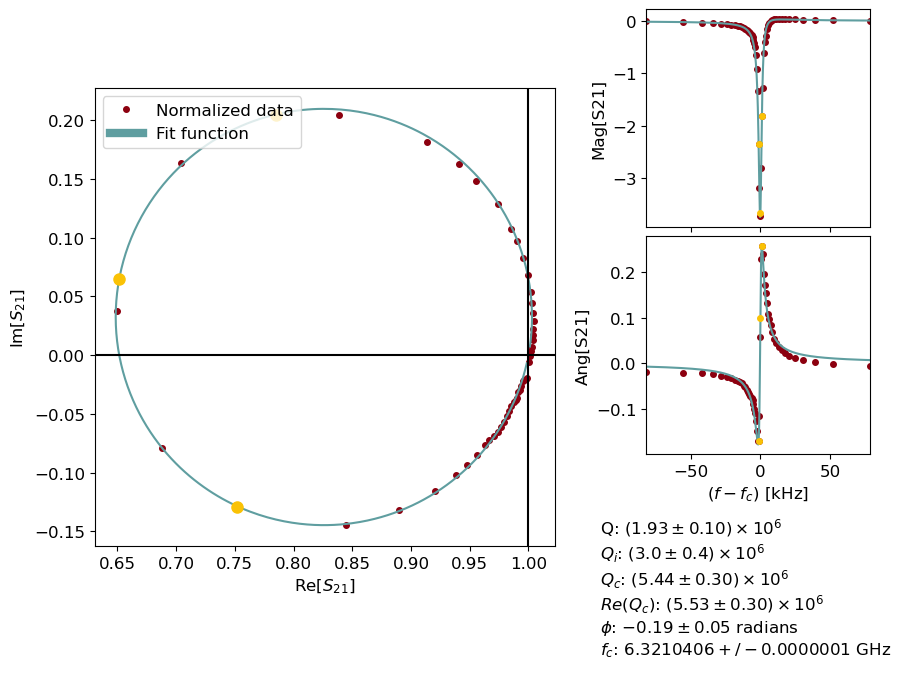

7.036653988057864
0.1760355872626373


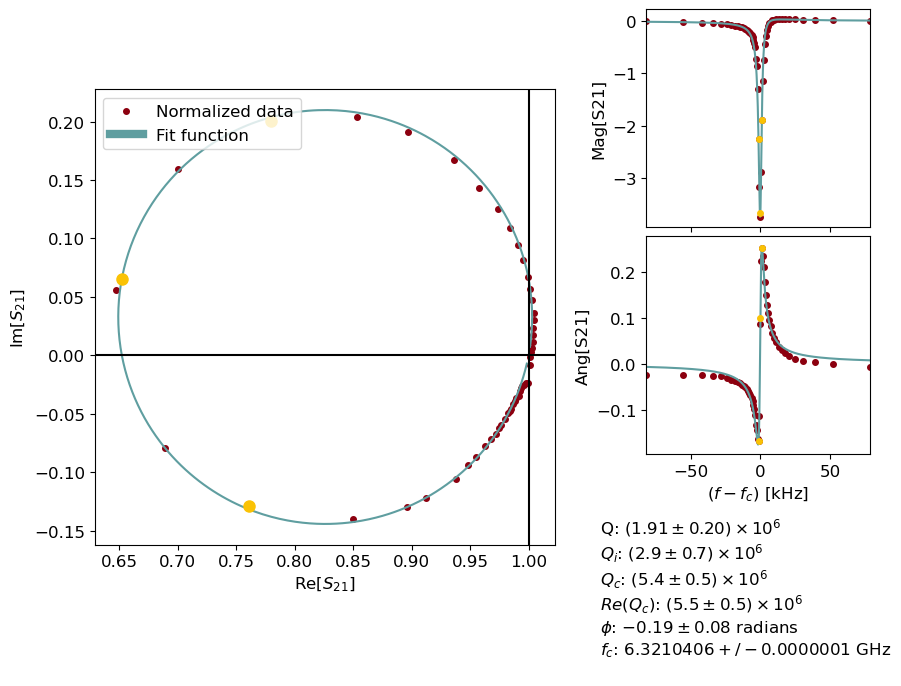

7.055126282471474
0.17692443633339666


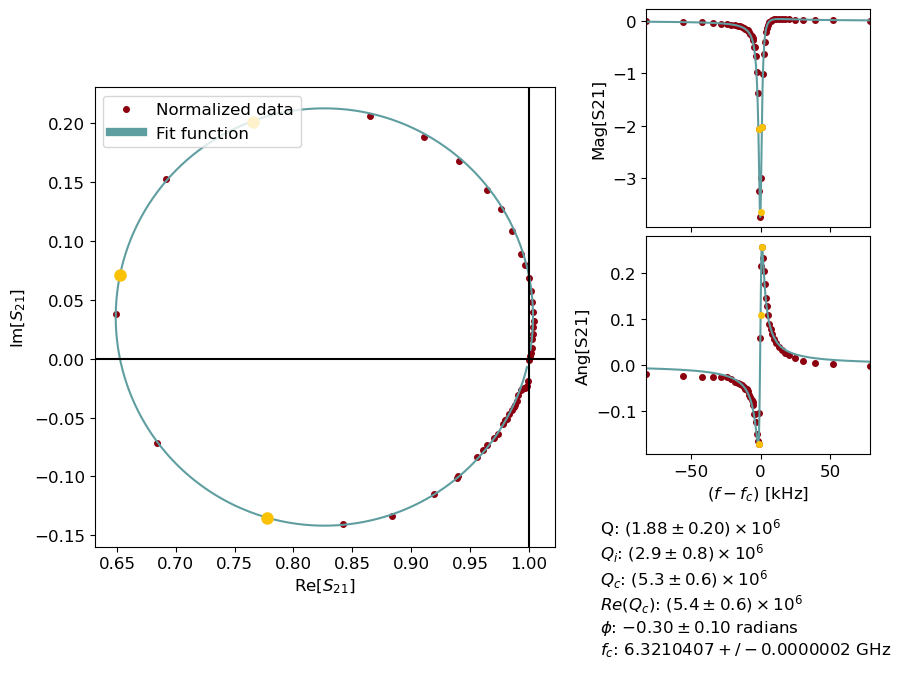

7.125447424484427
0.17826038087521245


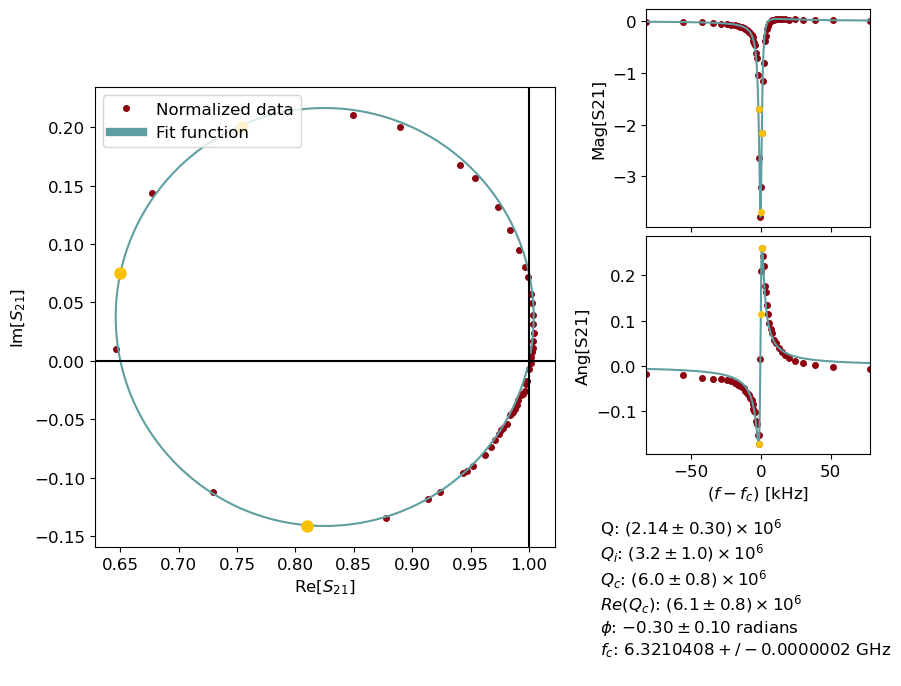

7.247278755363155
0.18103037405020303


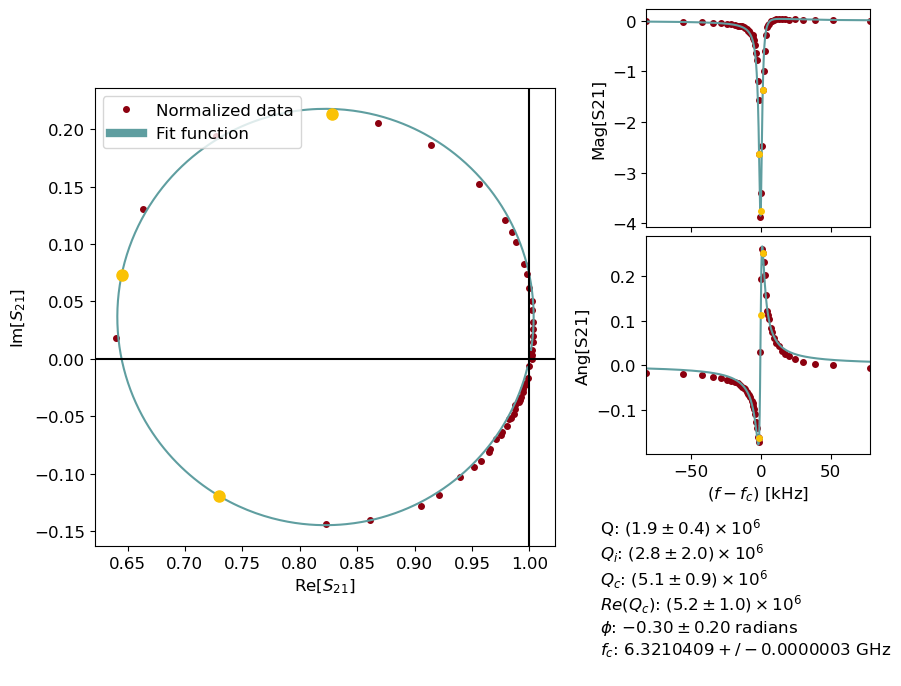

7.245855911673596
0.18164523062386106


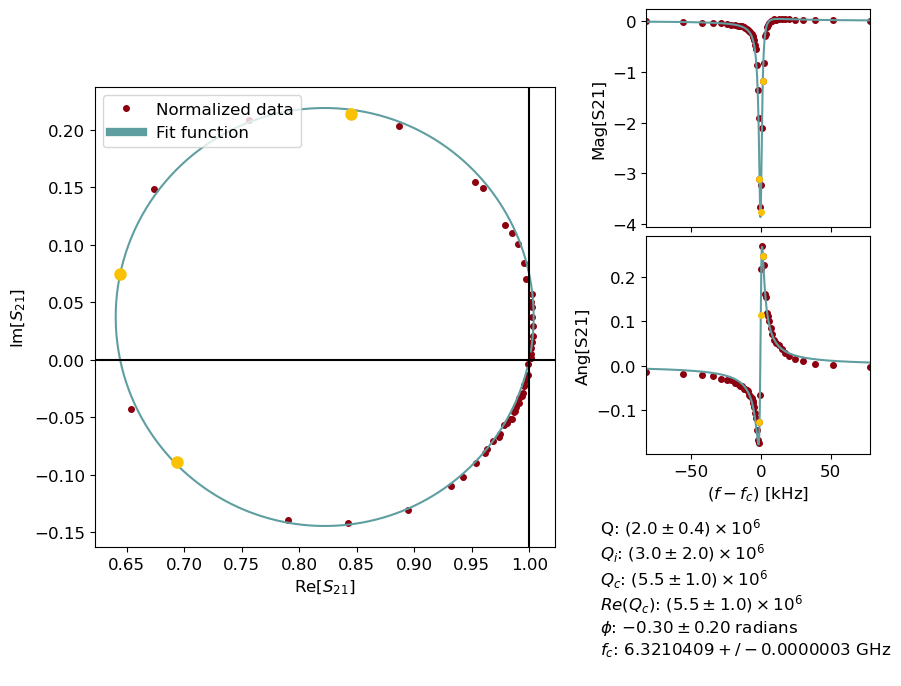

7.253367899756851
0.18225646388157182


/opt/anaconda3/lib/python3.11/site-packages/lmfit/confidence.py:317: UserWarning: Bound reached with prob(Qc=8386154.6957176) = 0.8764561063726223 < max(sigmas)
  warn(errmsg)


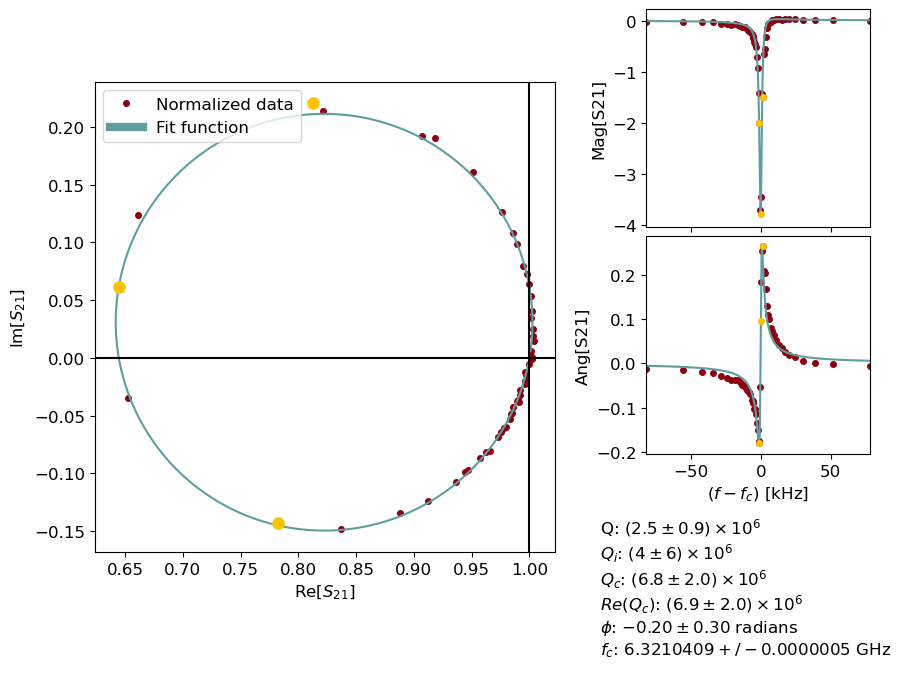

7.2724982018868145
0.1824014656435503


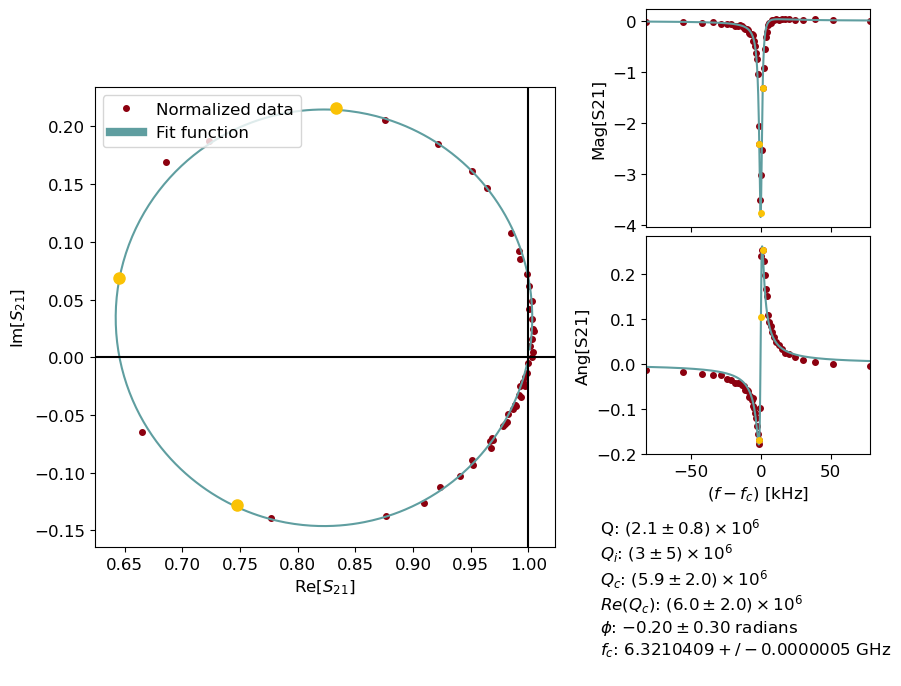

Time elapsed:  293.5517439842224
['res_6680_30', 'res_6680_27', 'res_6680_24', 'res_6680_21', 'res_6680_18', 'res_6680_15', 'res_6680_12', 'res_6680_9', 'res_6680_6', 'res_6680_3', 'res_6680_0']
4.731604291387915
0.1686421271362828


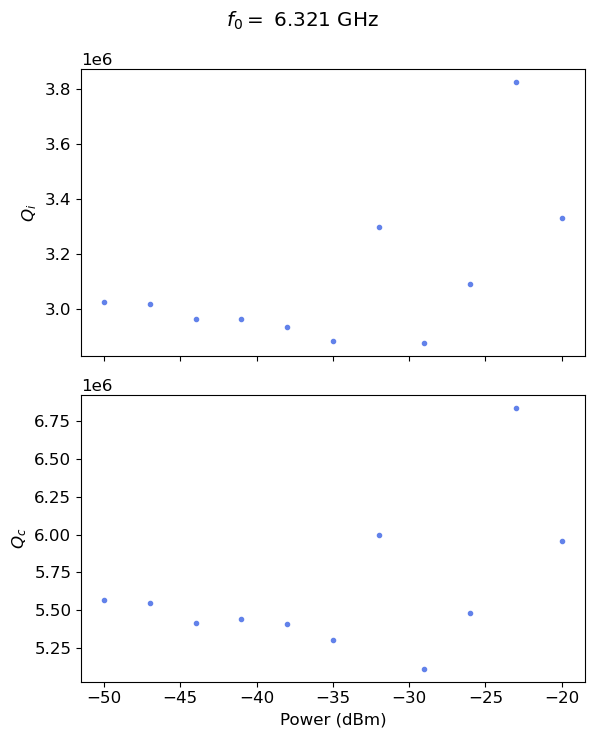

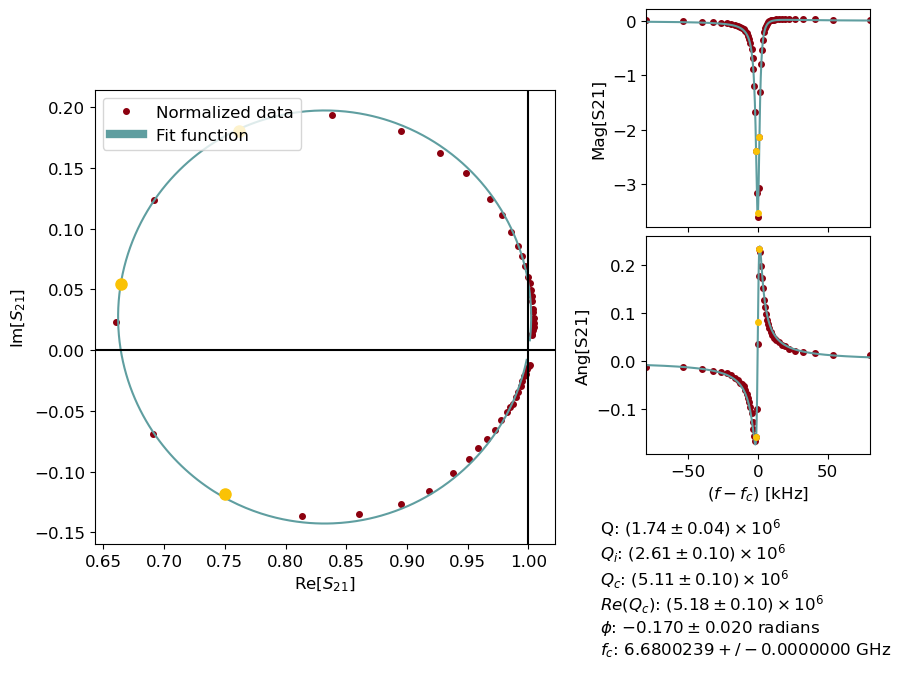

4.757261363885413
0.16961025664259166


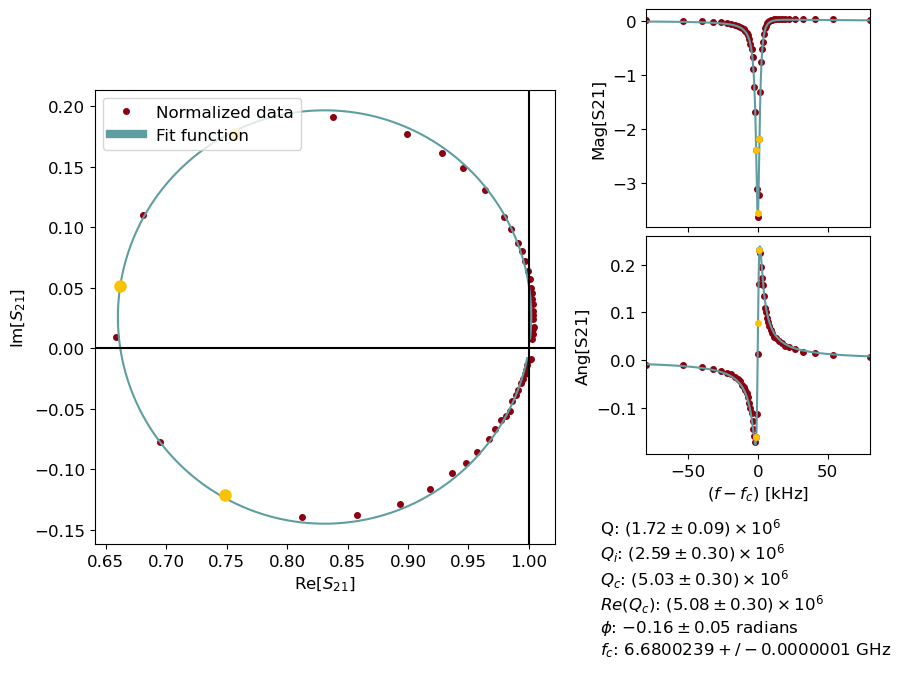

4.7647715563603095
0.16956527099762475


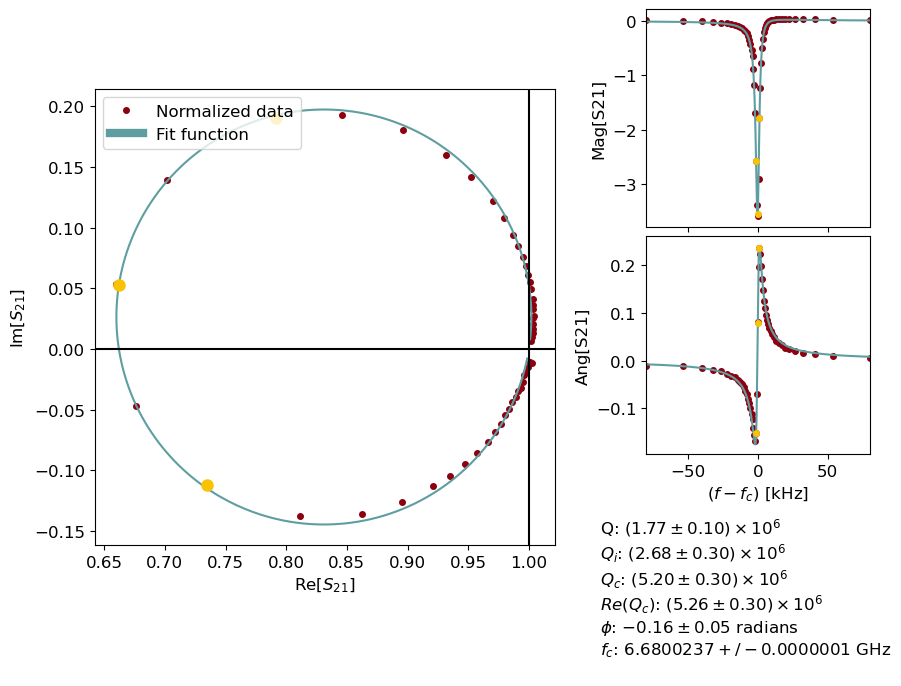

4.7328649027699745
0.16852047989269553


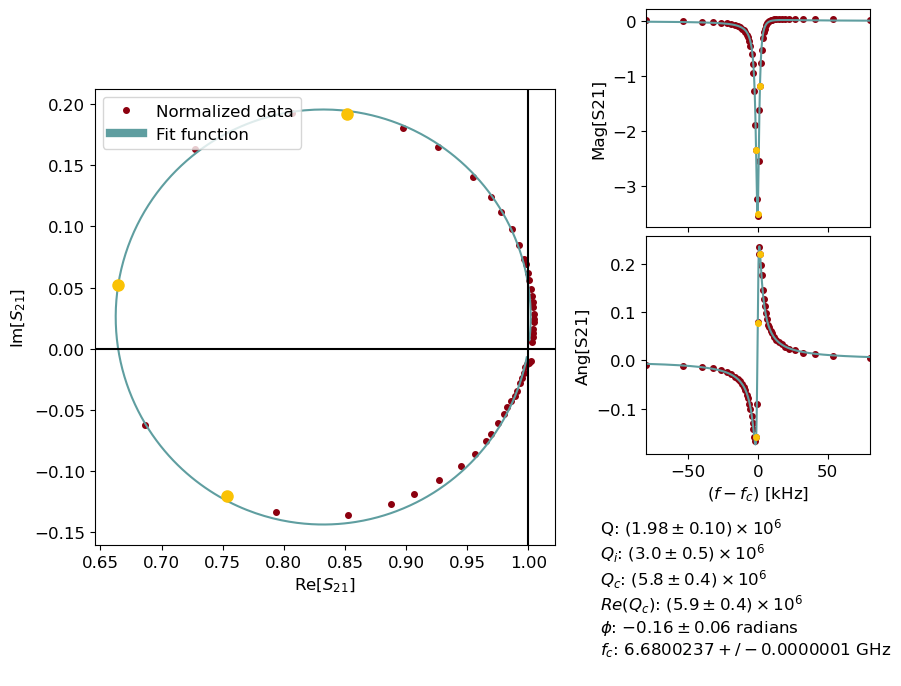

4.747535242924955
0.16920221705876792


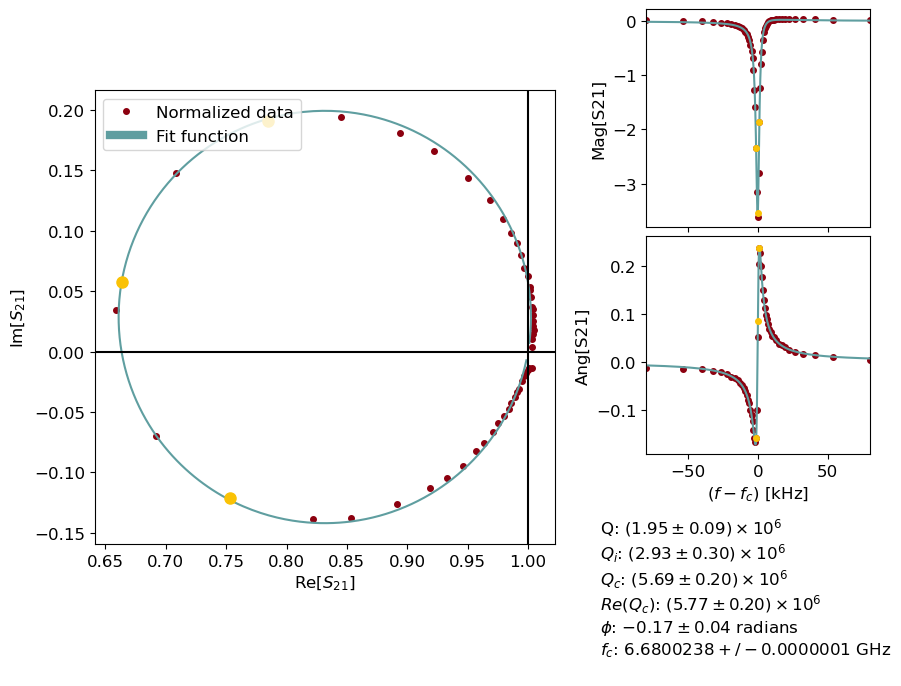

4.769205097321341
0.1700091437350746


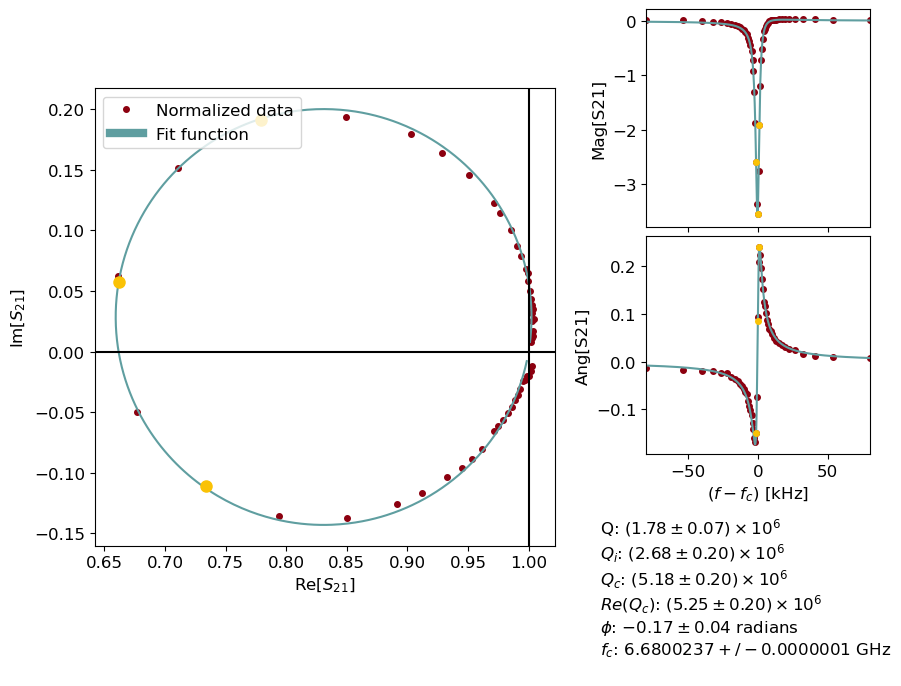

4.806209334275658
0.17122133037825402


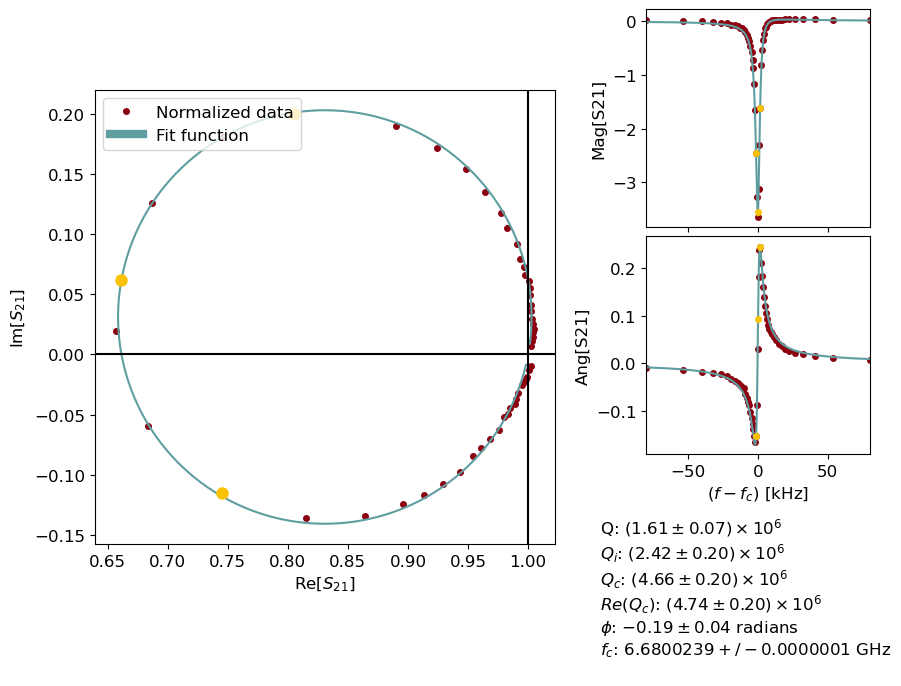

4.798916686149114
0.17095234789982533


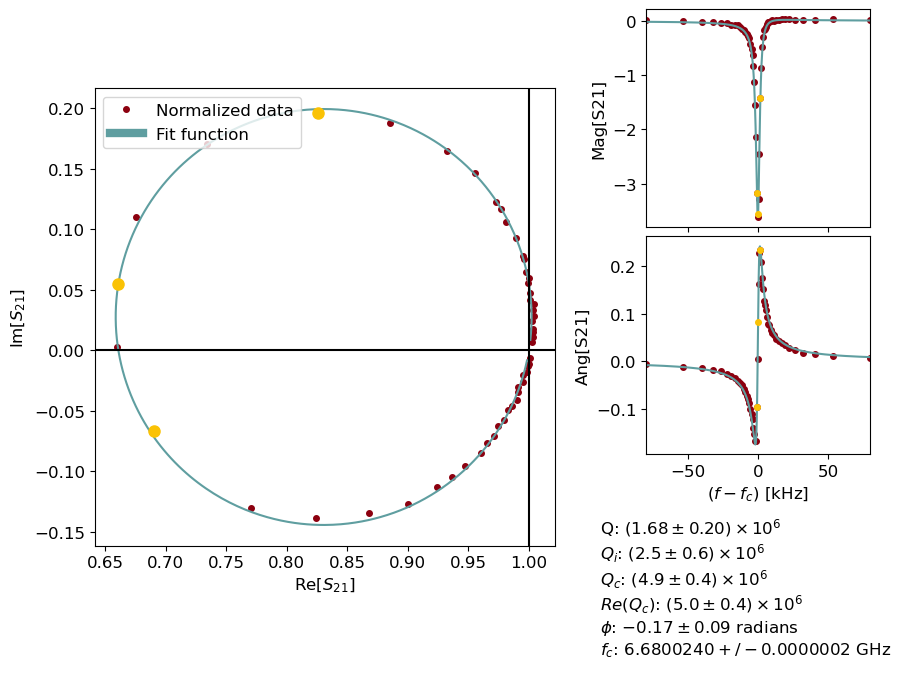

4.797820712718927
0.17099766126156893


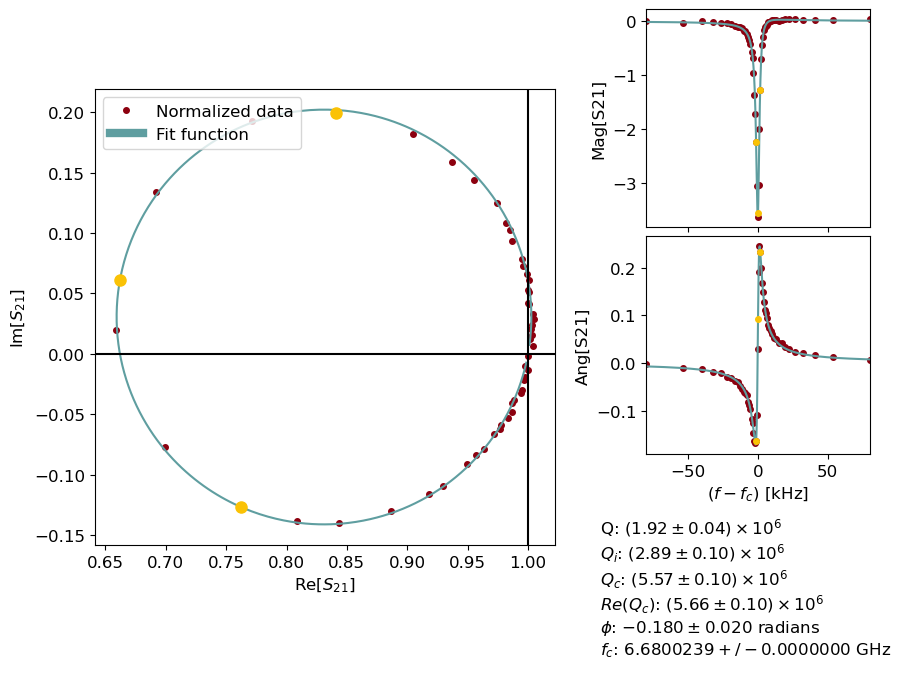

4.7684633903288365
0.16980539938998618


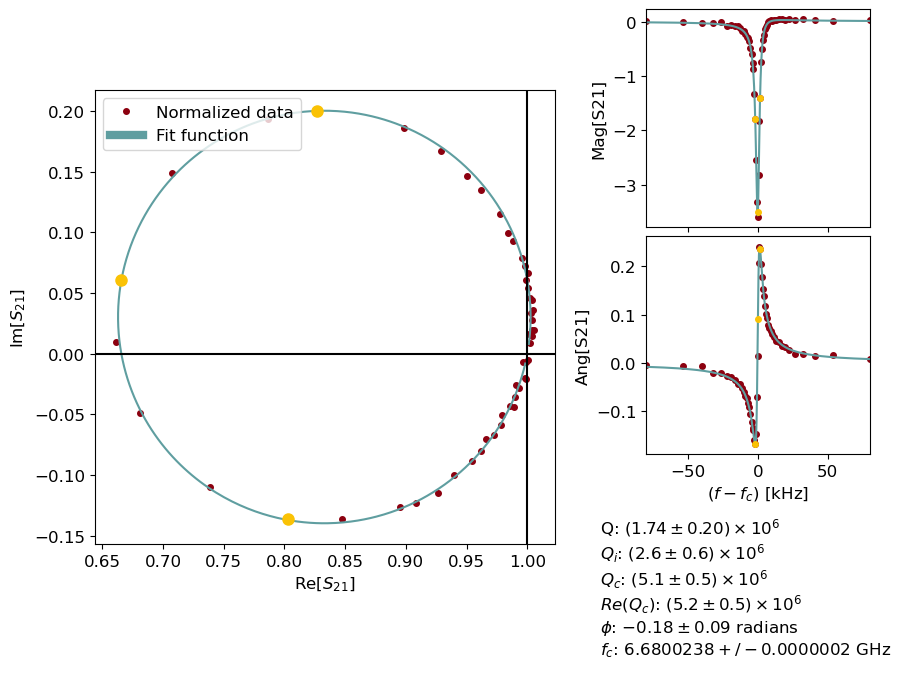

4.775879006038336
0.16991882228863633


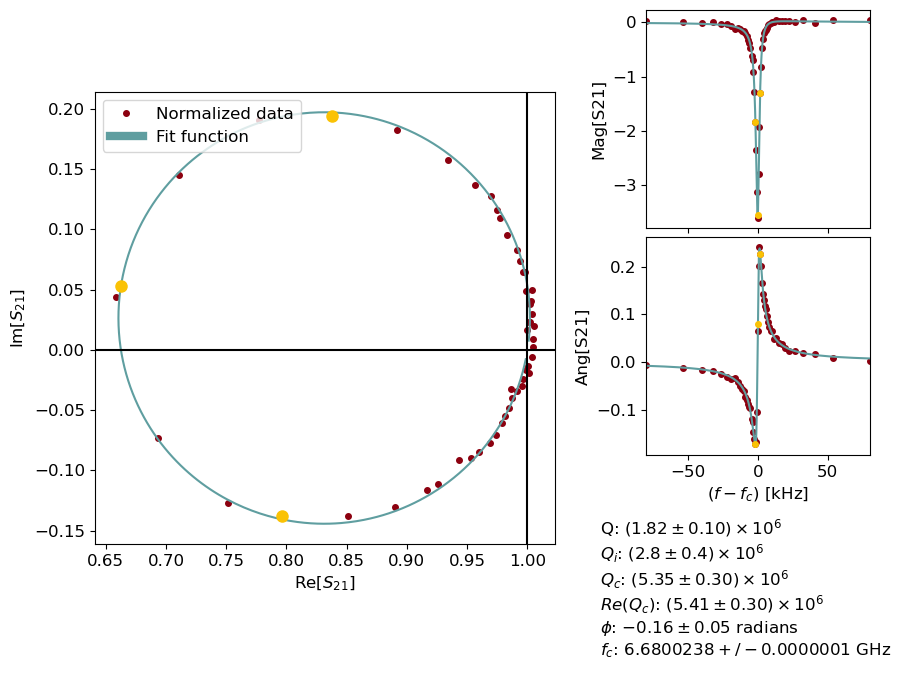

Time elapsed:  486.52458095550537
['res_6692_30', 'res_6692_27', 'res_6692_24', 'res_6692_21', 'res_6692_18', 'res_6692_15', 'res_6692_12', 'res_6692_9', 'res_6692_6', 'res_6692_3', 'res_6692_0']
1.3374551712079337
0.02960792445960524


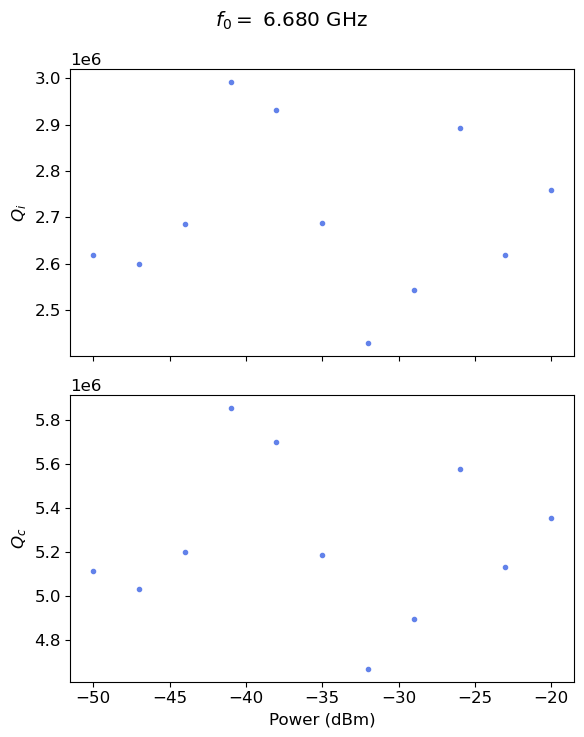

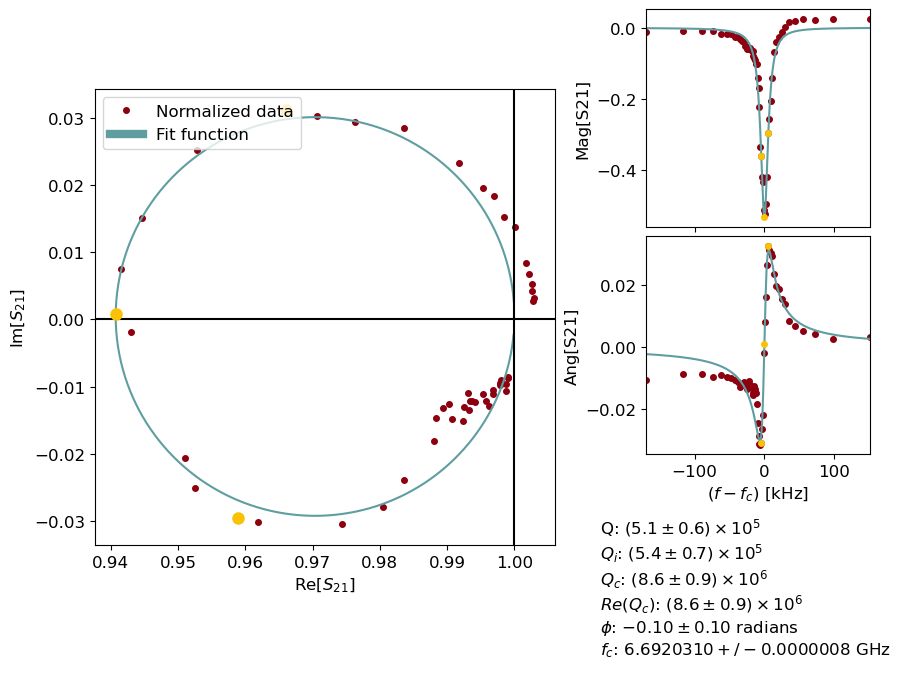

1.3571531616165542
0.030018181360154716


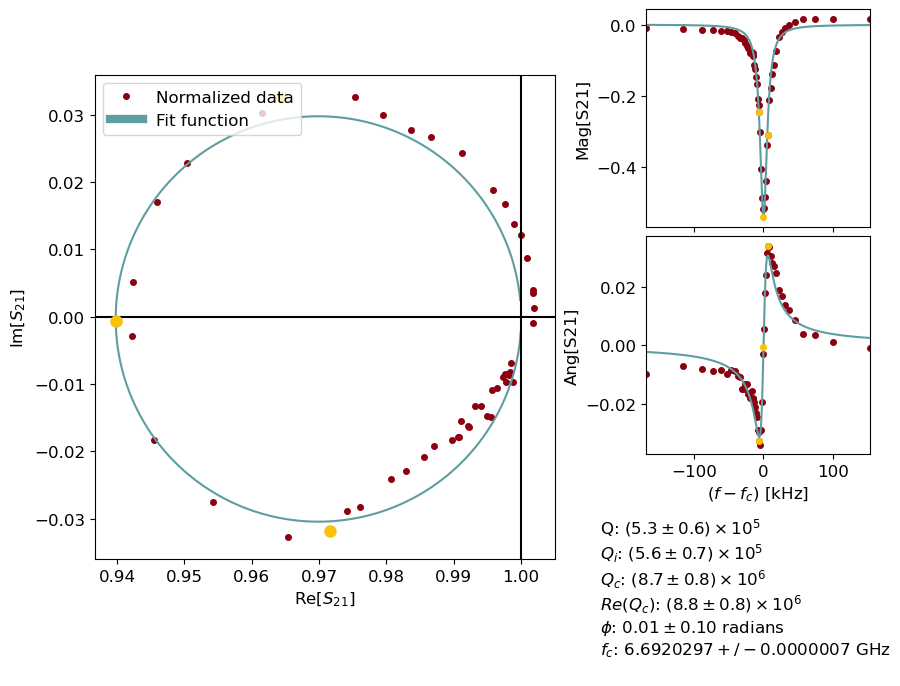

1.3434121016055152
0.029644760422683738


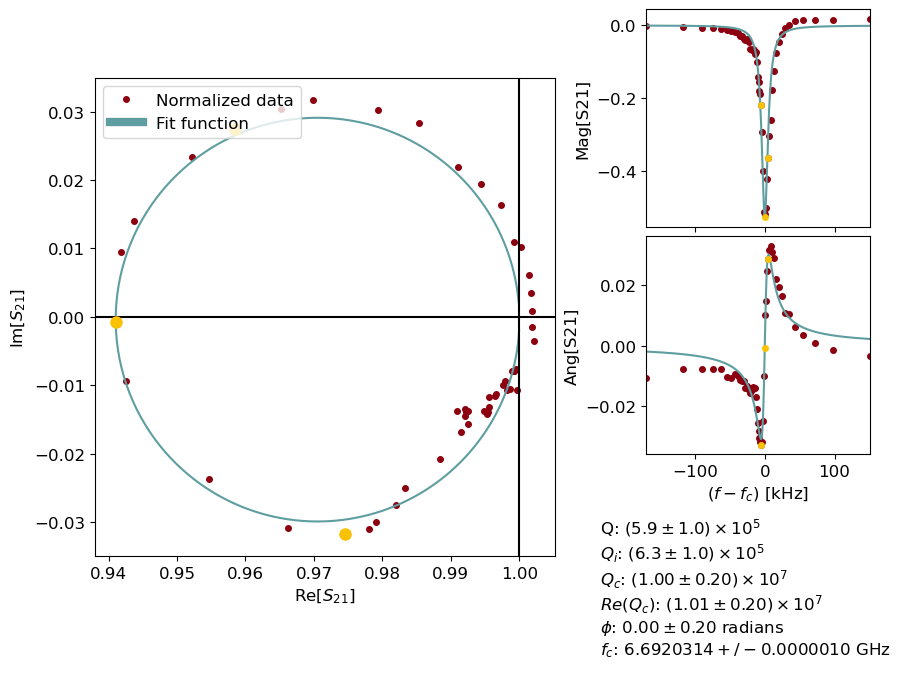

1.3679863222961475
0.030240754876876663


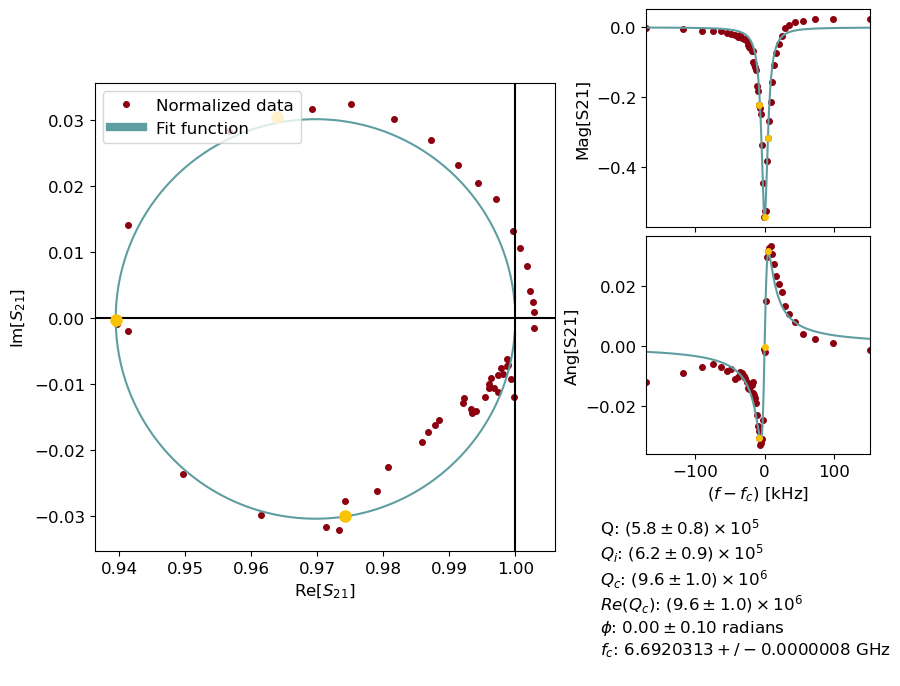

1.3477977472257237
0.029838129625913055


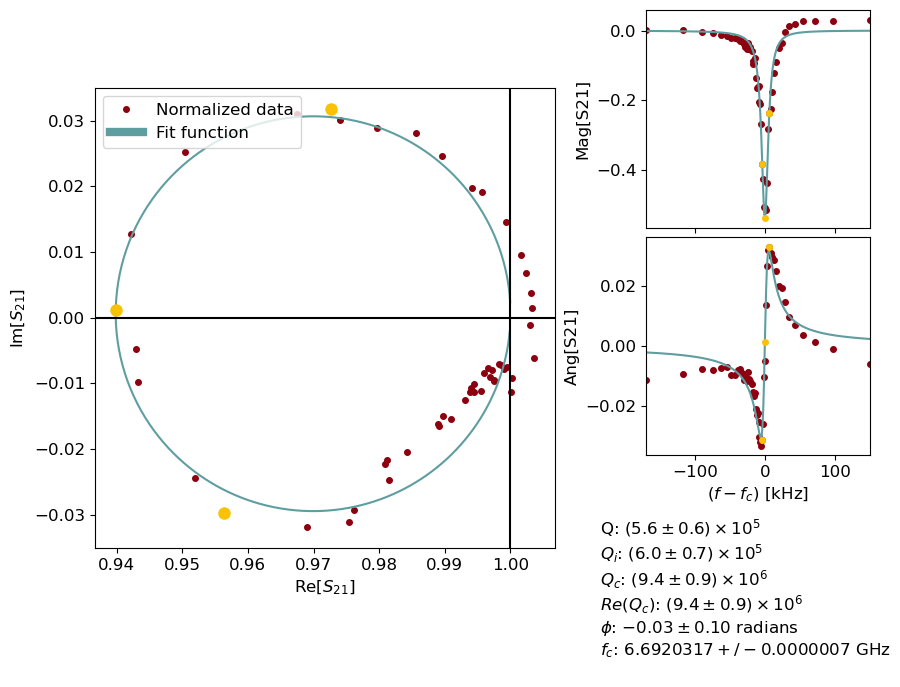

1.3323032178809537
0.029473602343743247


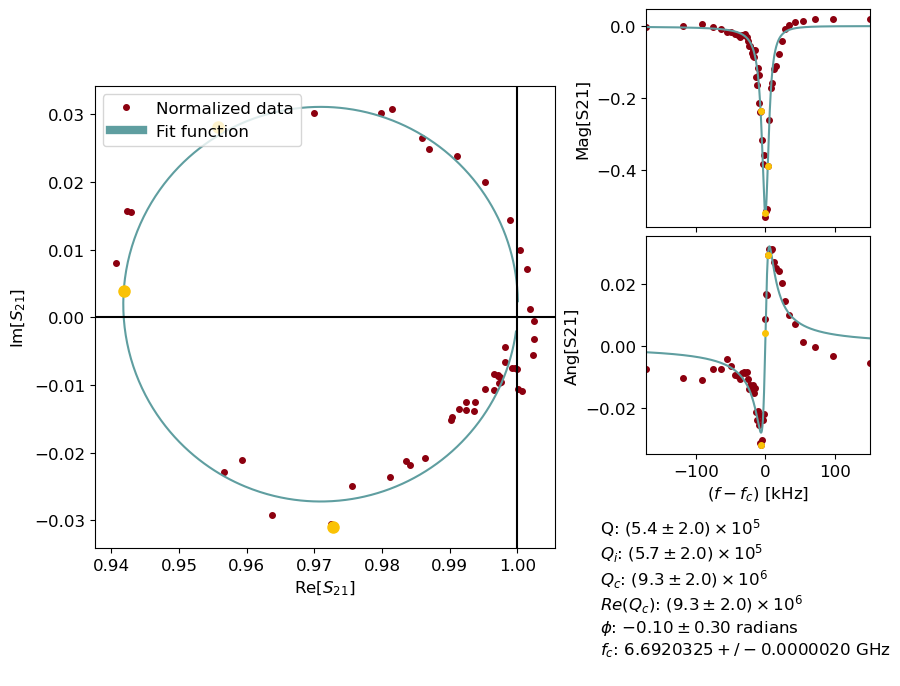

1.3330701636849218
0.02944216226761533


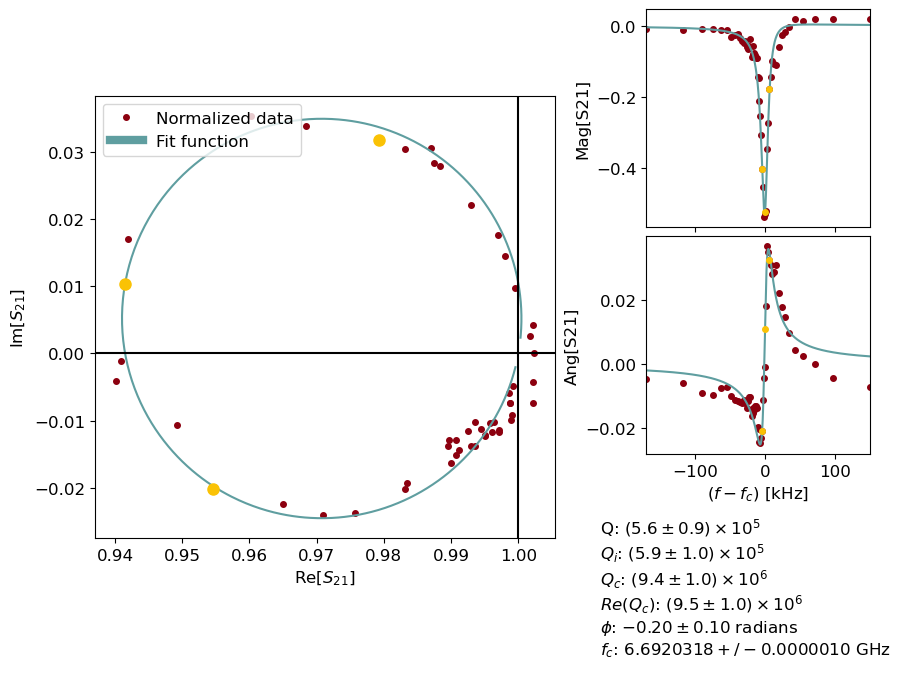

1.3920453818278413
0.030660895377659425


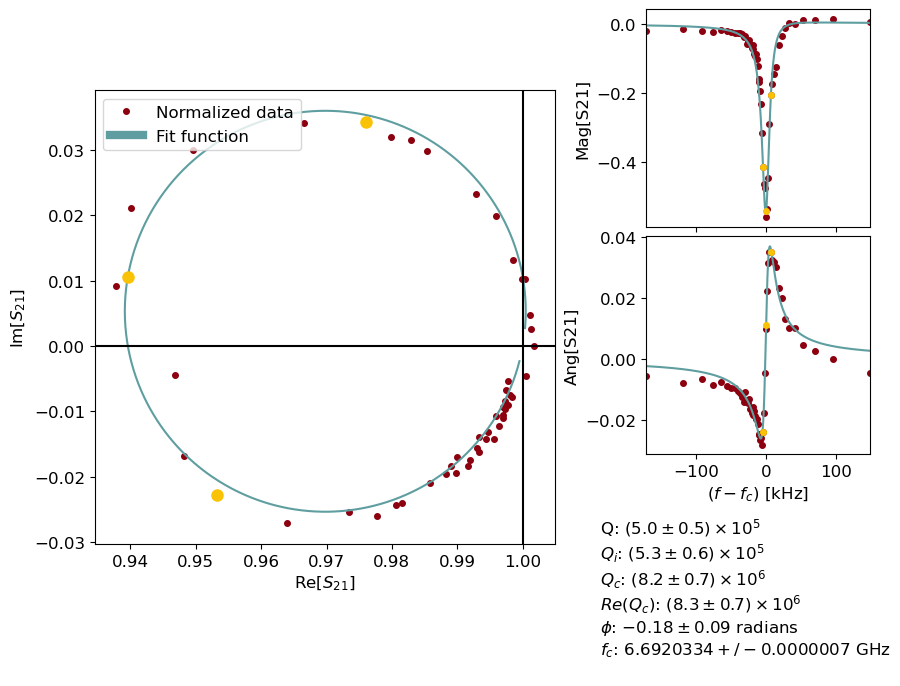

1.3962336388138499
0.03056275005671519


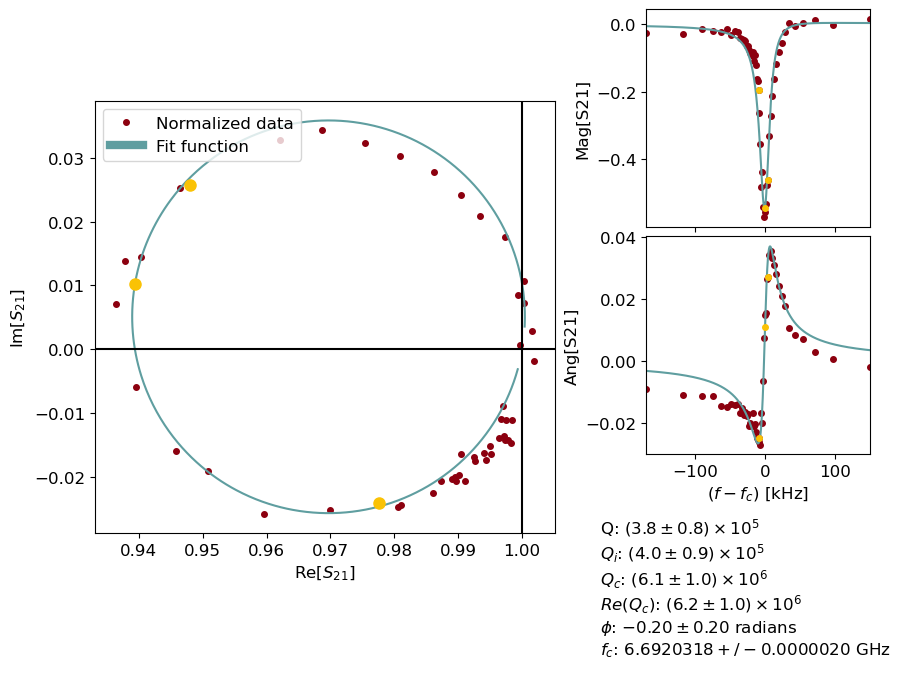

1.4090074944840516
0.031163621650141714


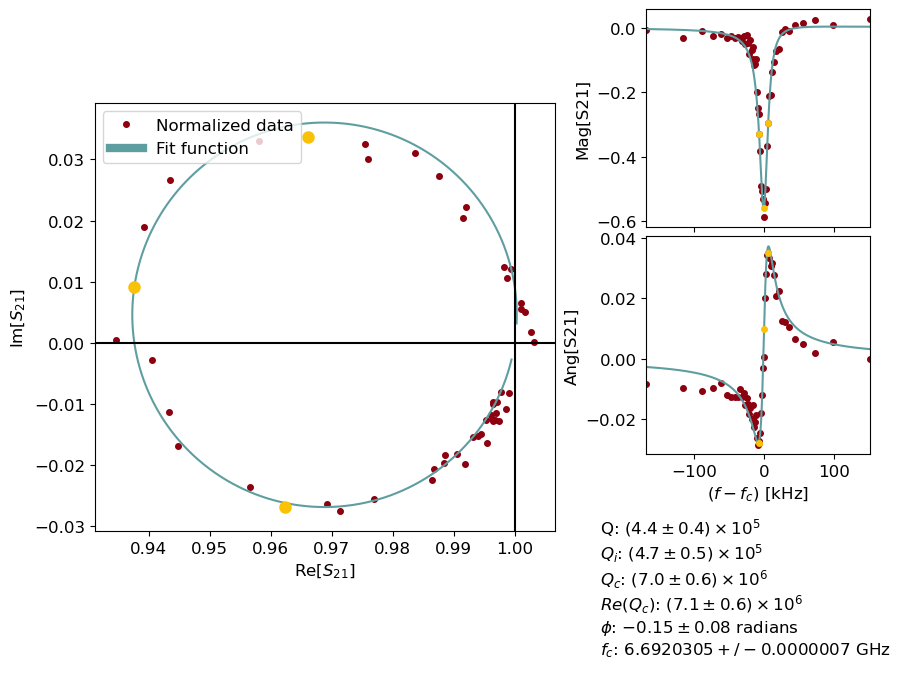

1.4279323871941456
0.031367940218540356


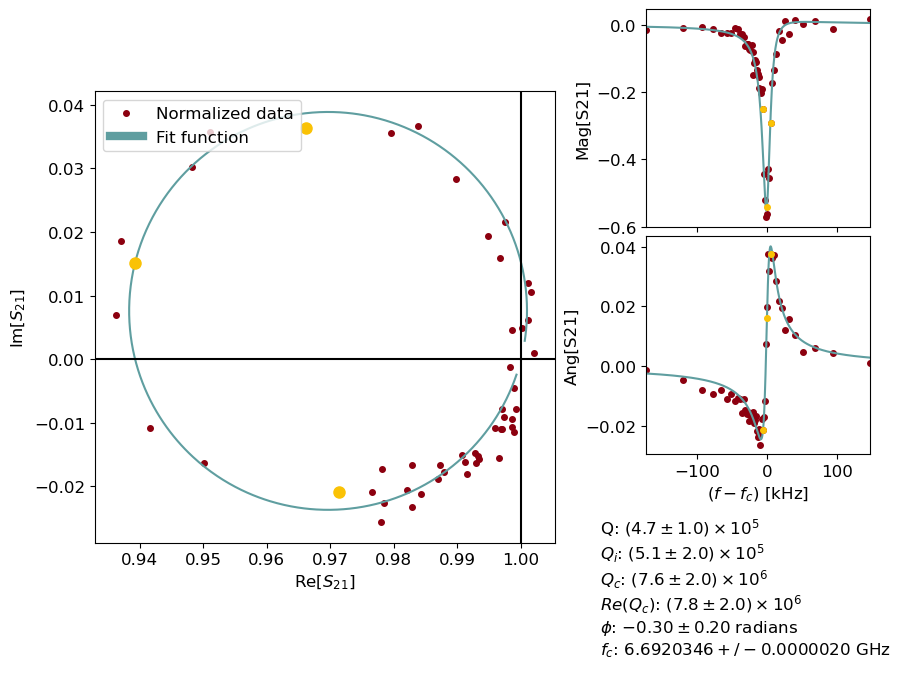

Time elapsed:  664.9842731952667
['res_6992_30', 'res_6992_27', 'res_6992_24', 'res_6992_21', 'res_6992_18', 'res_6992_15', 'res_6992_12', 'res_6992_9', 'res_6992_6', 'res_6992_3', 'res_6992_0']
2.5134418355565695
0.16848773998849775


/opt/anaconda3/lib/python3.11/site-packages/lmfit/confidence.py:317: UserWarning: Bound reached with prob(Qc=4051911.729406847) = 0.8853498261682115 < max(sigmas)
  warn(errmsg)


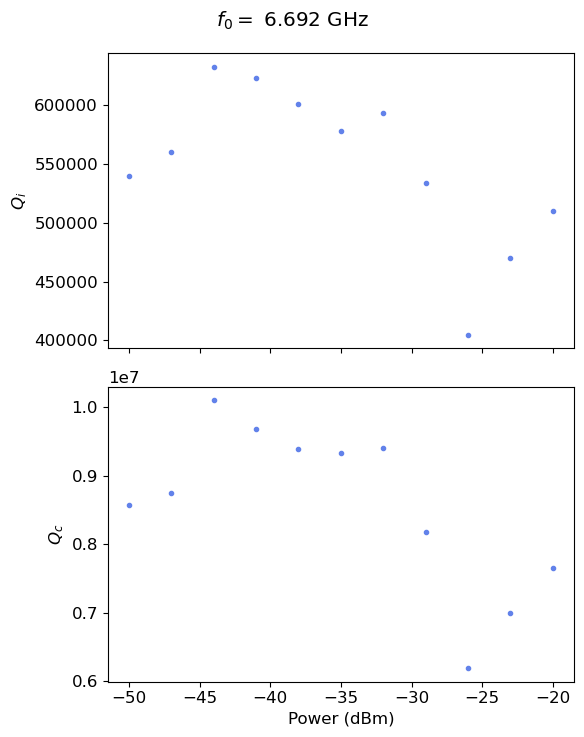

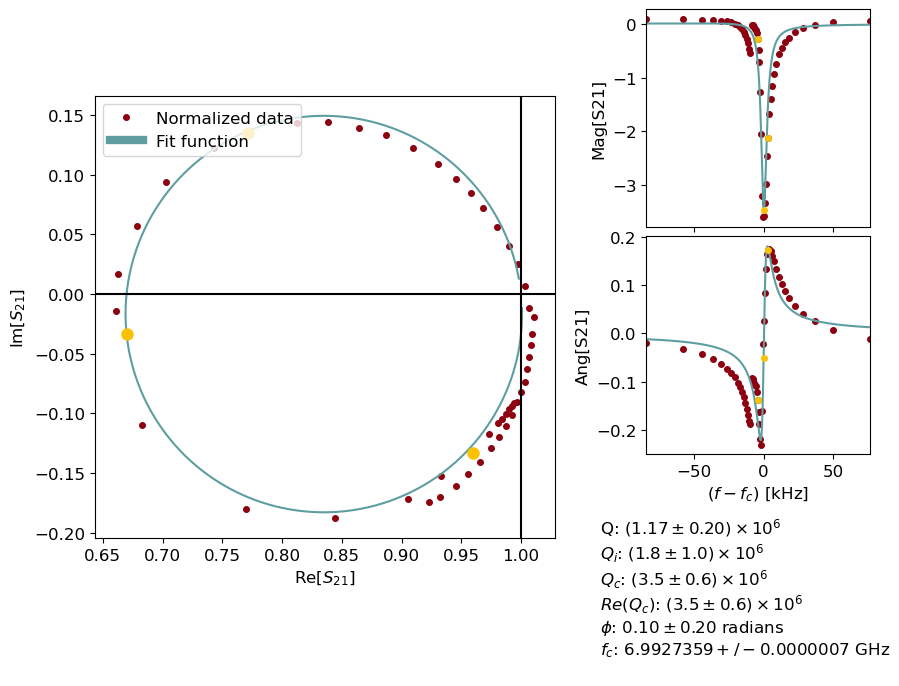

2.6211699375617137
0.17432346852898098


/opt/anaconda3/lib/python3.11/site-packages/lmfit/confidence.py:330: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(phi=-0.0019356442380253688) = 0.0 < max(sigmas)
  warn(errmsg)


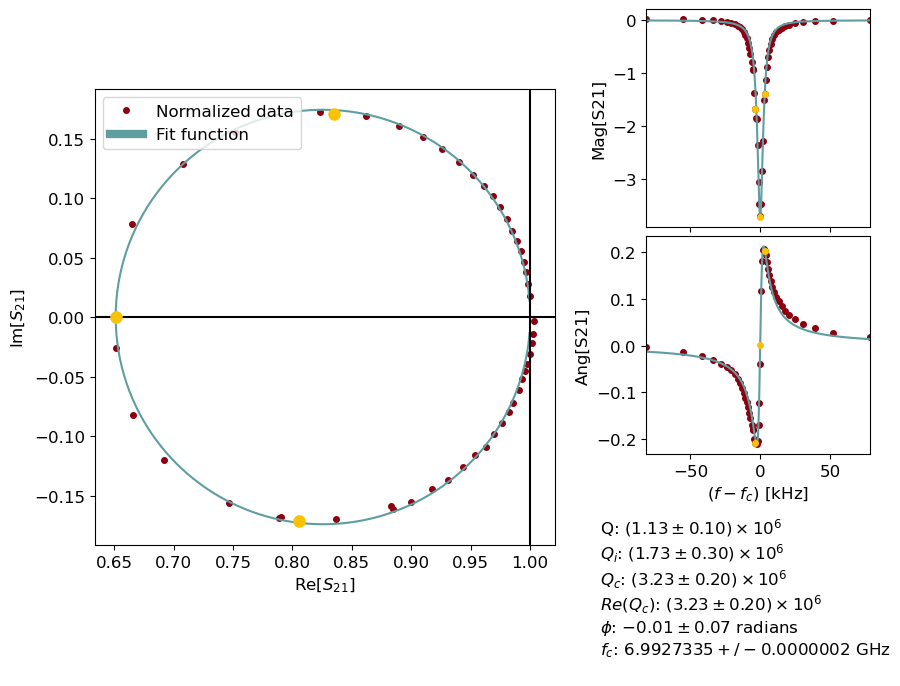

2.6459787388747213
0.17561606635836158


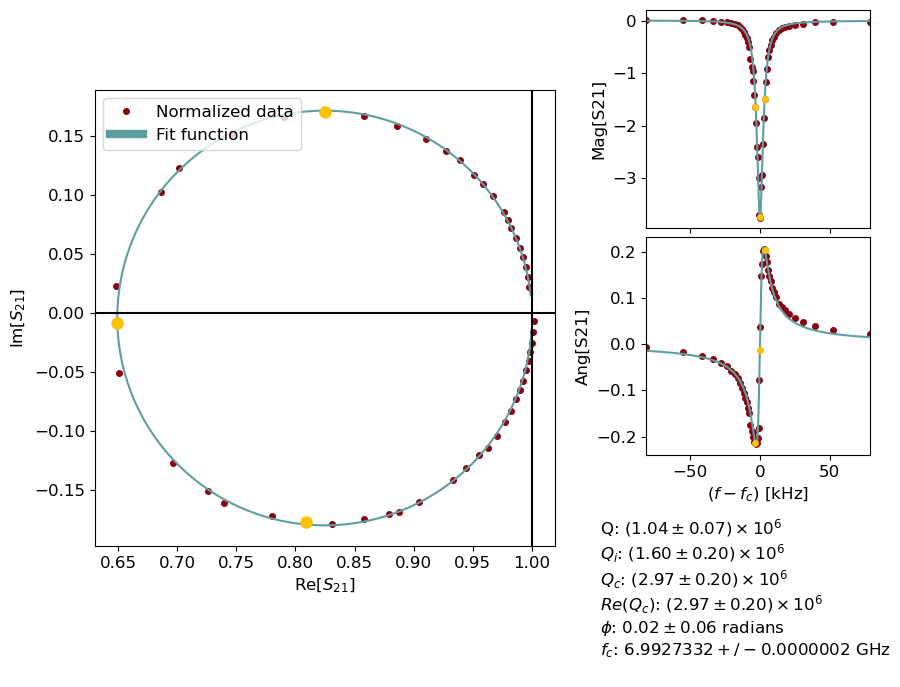

2.666338352274588
0.17683590793956996


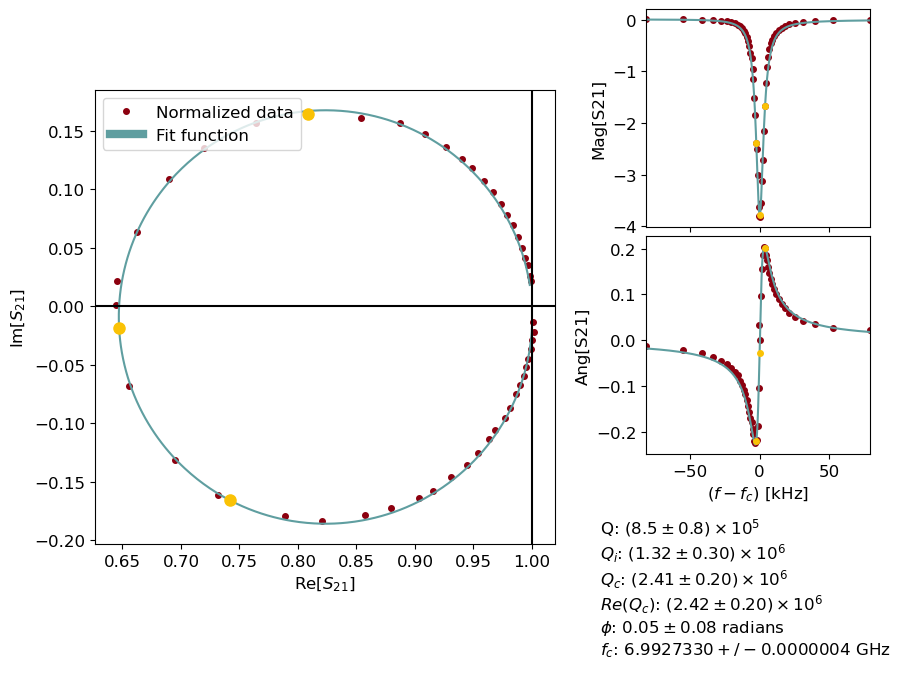

2.6521548394564585
0.17629253221602637


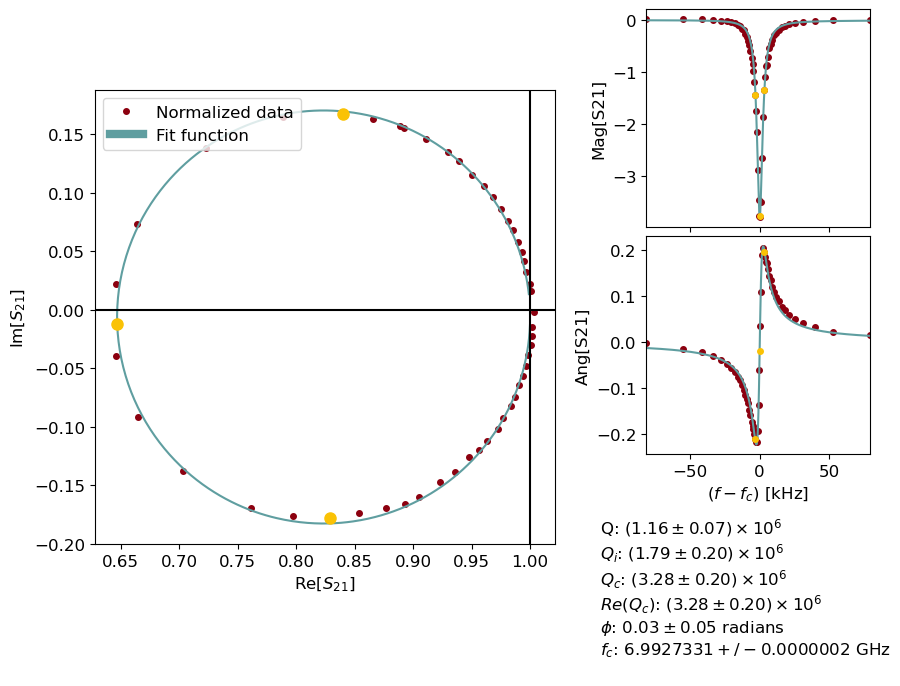

2.6433202387576706
0.17566765107616508


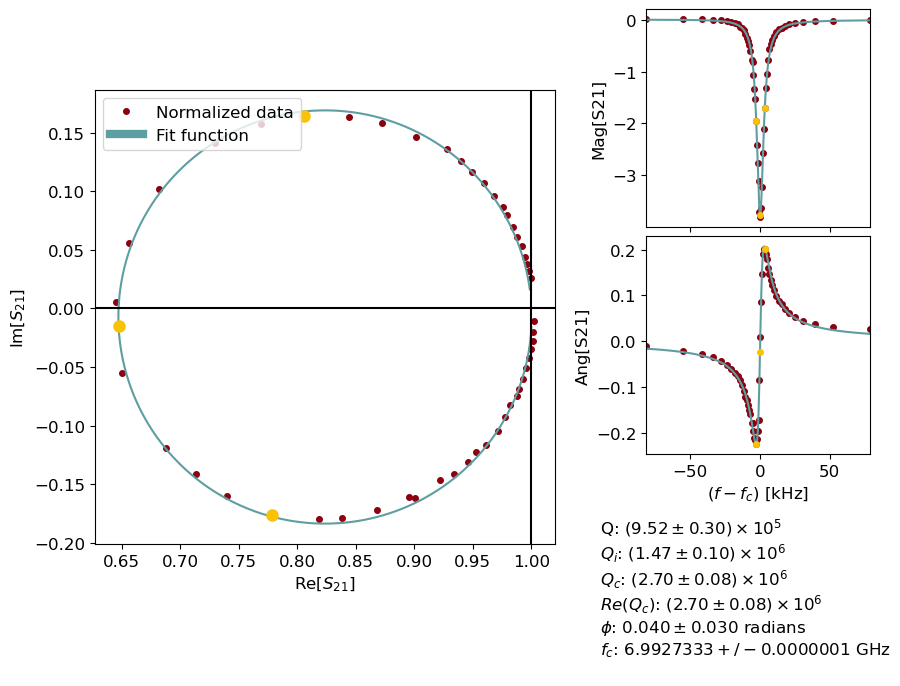

2.654603915470768
0.17635069033449358


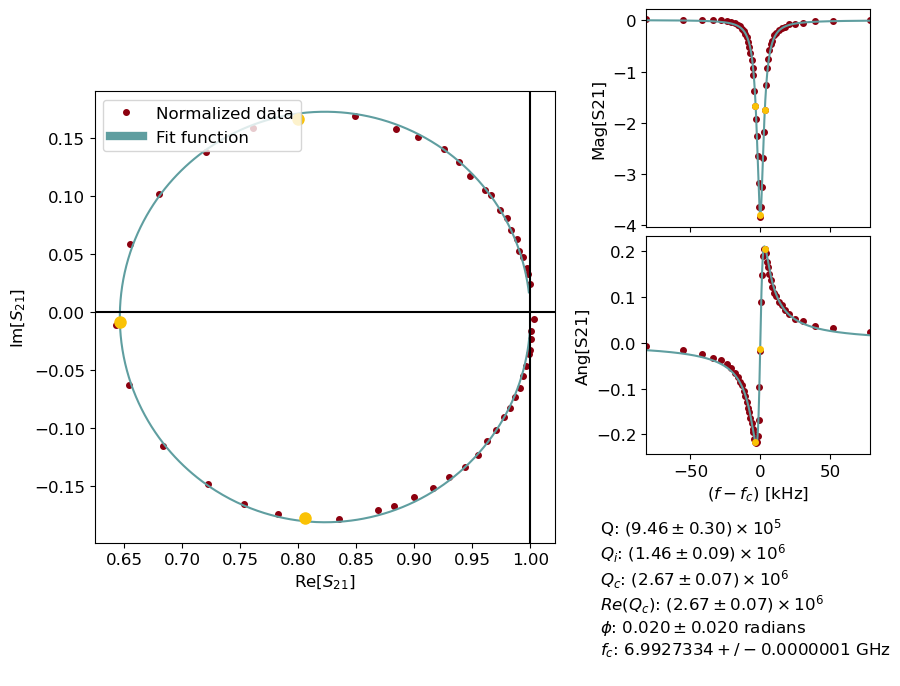

2.6416423098715542
0.17560229083029116


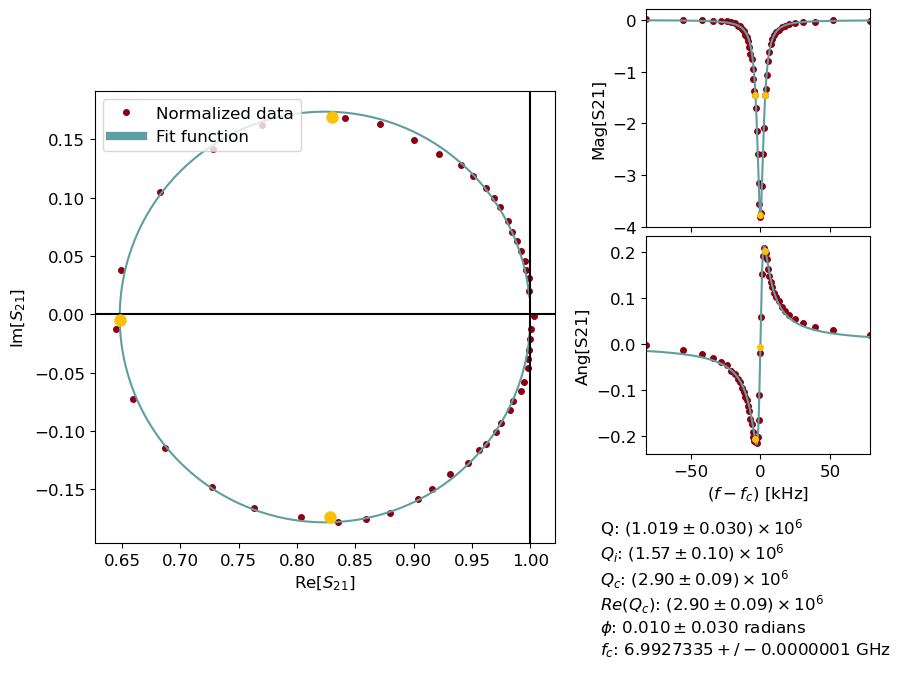

2.628609366023122
0.17503723524271786


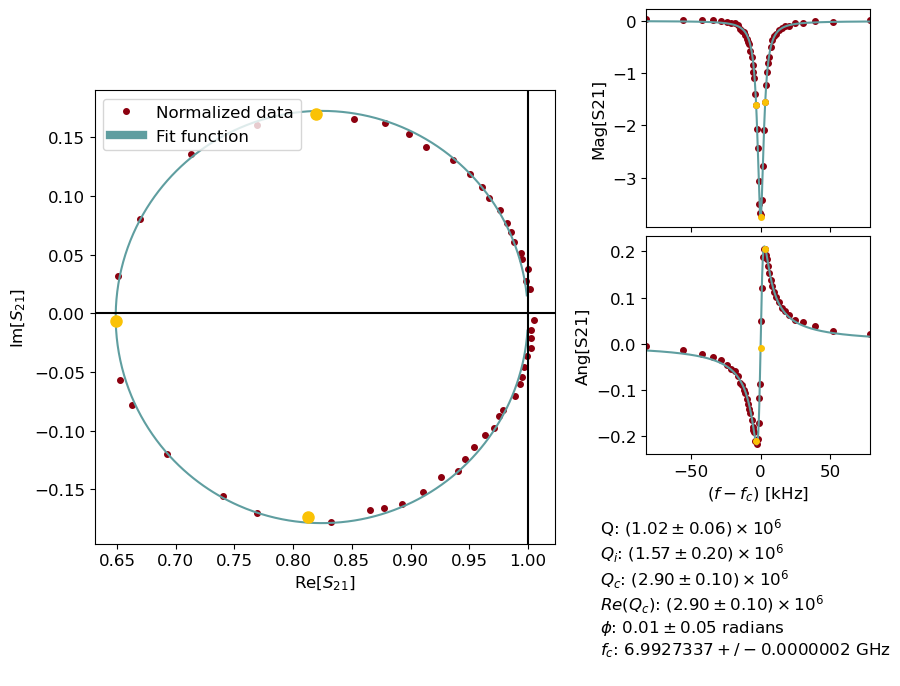

2.621726139327129
0.17463792466467365


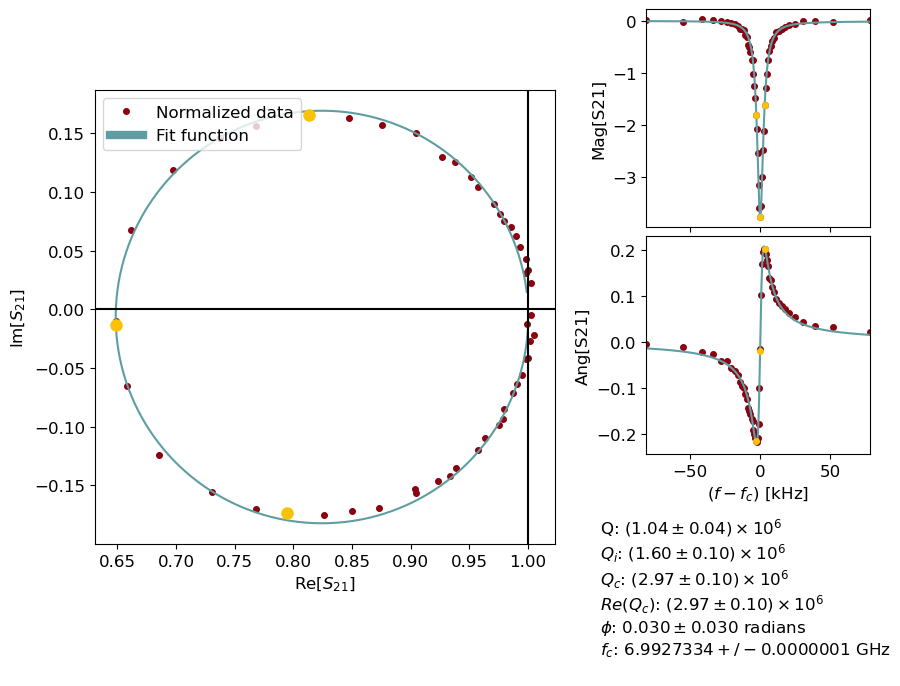

2.6204514407540604
0.17458954764604945


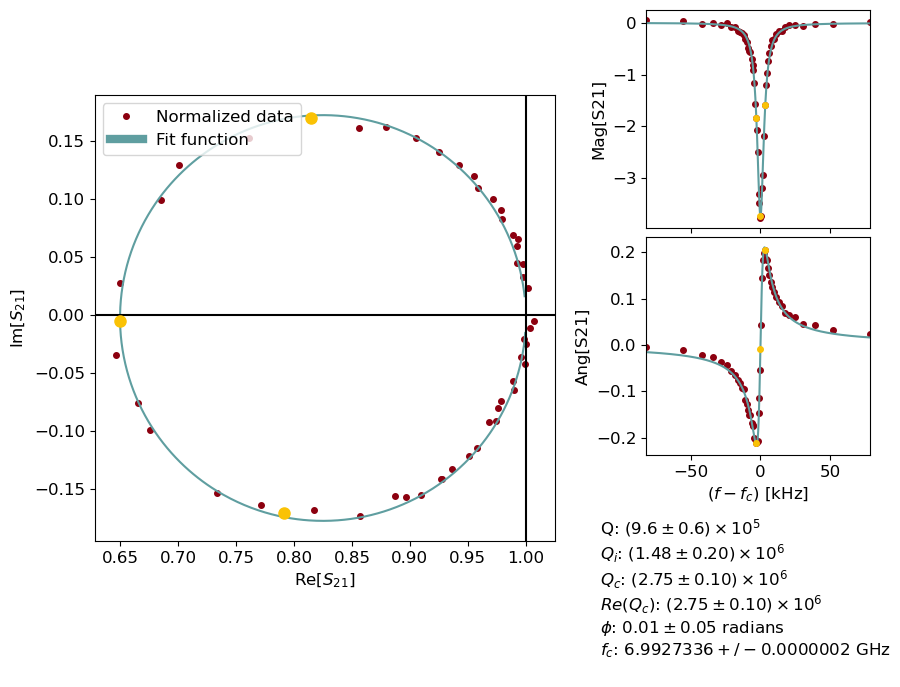

Time elapsed:  788.0287179946899
['res_7067_30', 'res_7067_27', 'res_7067_24', 'res_7067_21', 'res_7067_18', 'res_7067_15', 'res_7067_12', 'res_7067_9', 'res_7067_6', 'res_7067_3', 'res_7067_0']
1.8198533784314668
0.11986349463774401


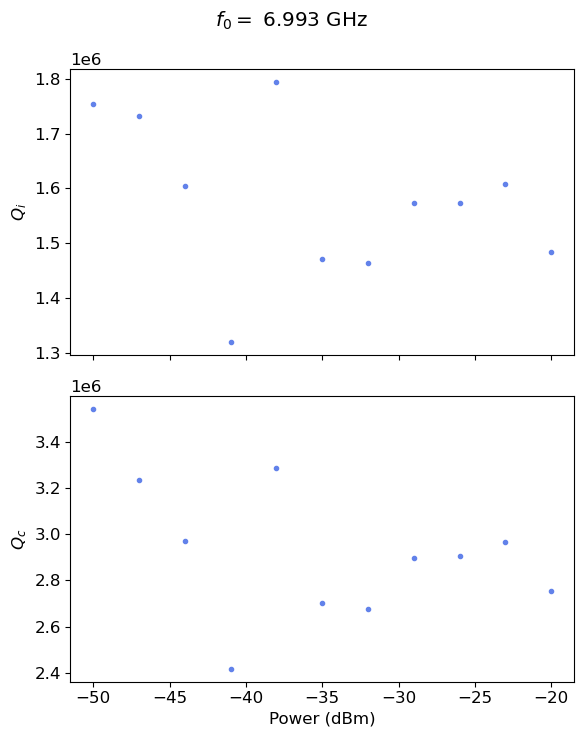

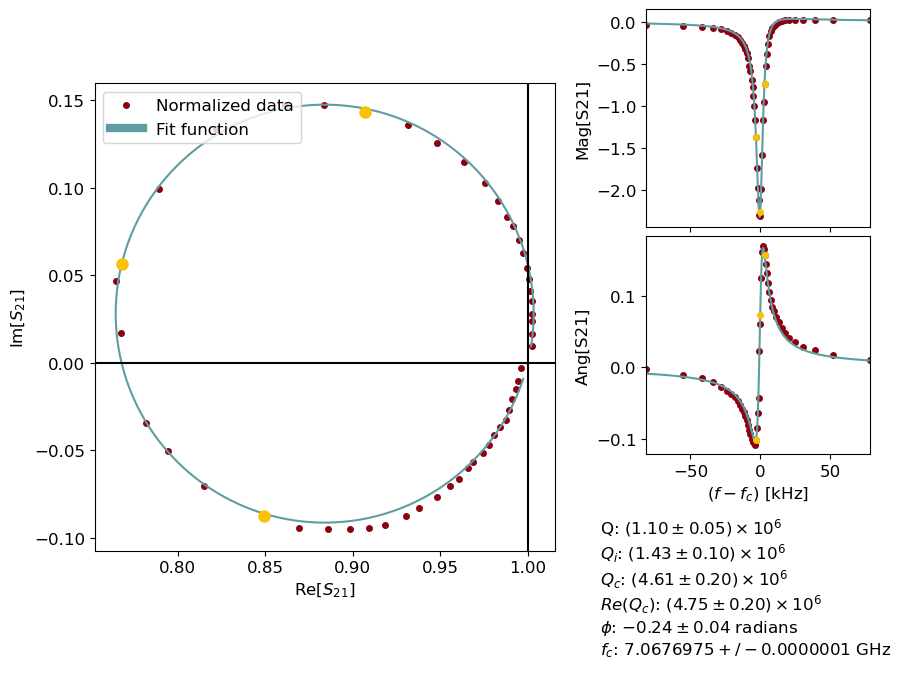

1.7993035048559878
0.11859007603262248


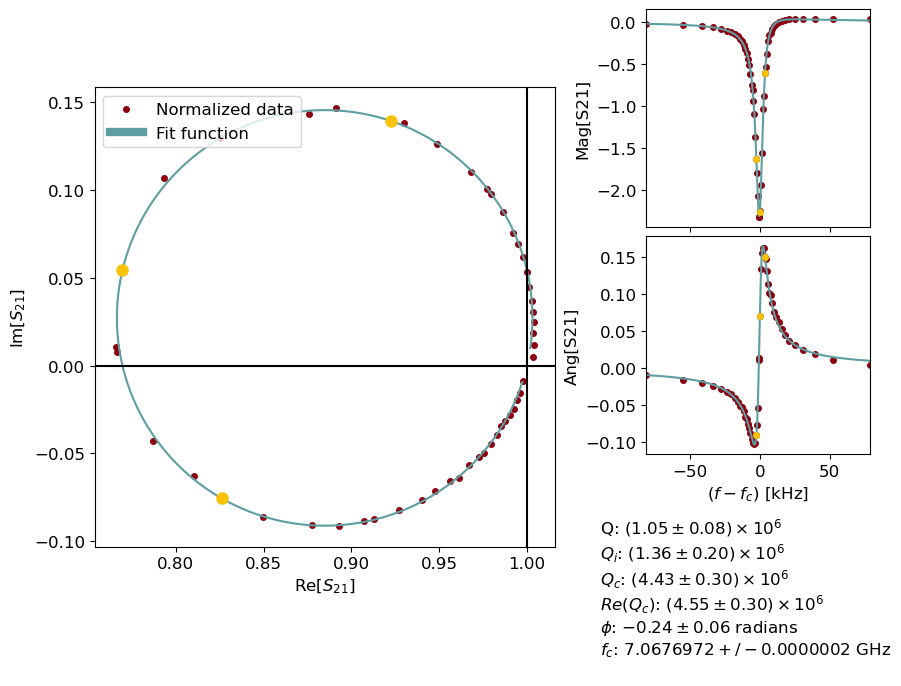

1.827212186726068
0.12023335280751367


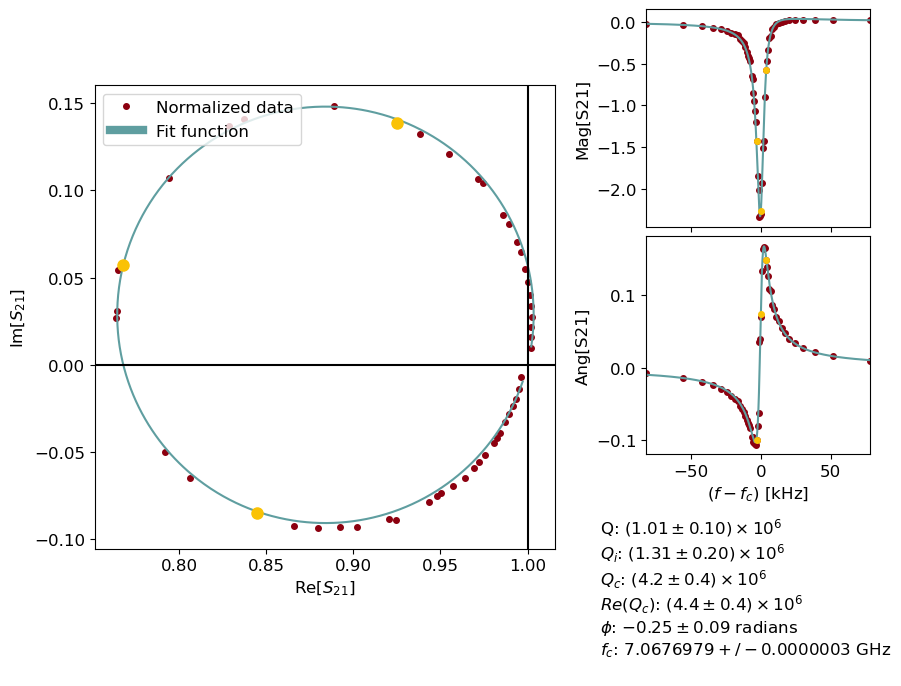

1.8078836541507992
0.11892630052272193


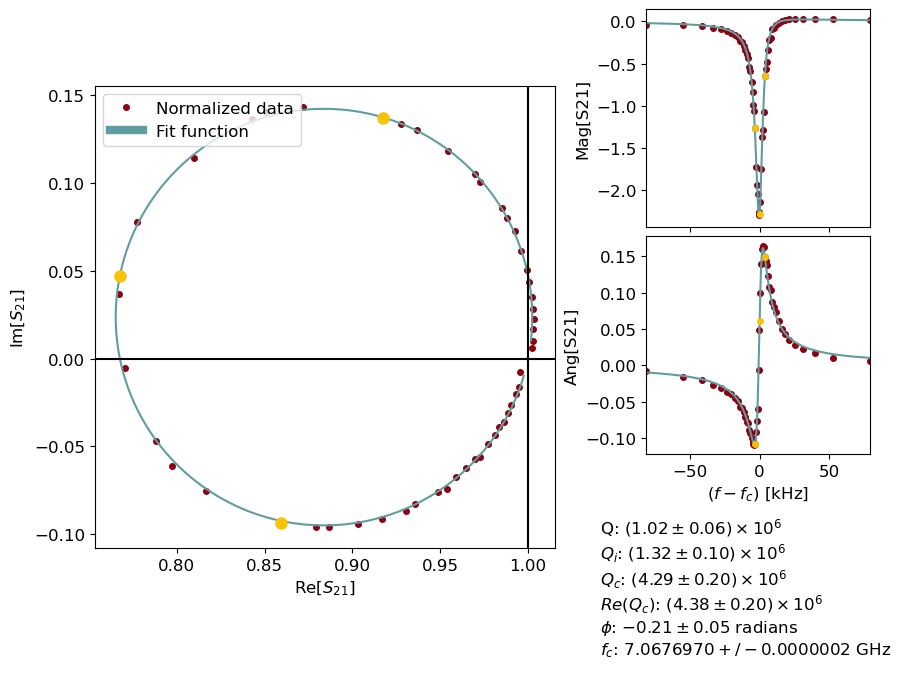

1.8318287121966241
0.12064087339964008


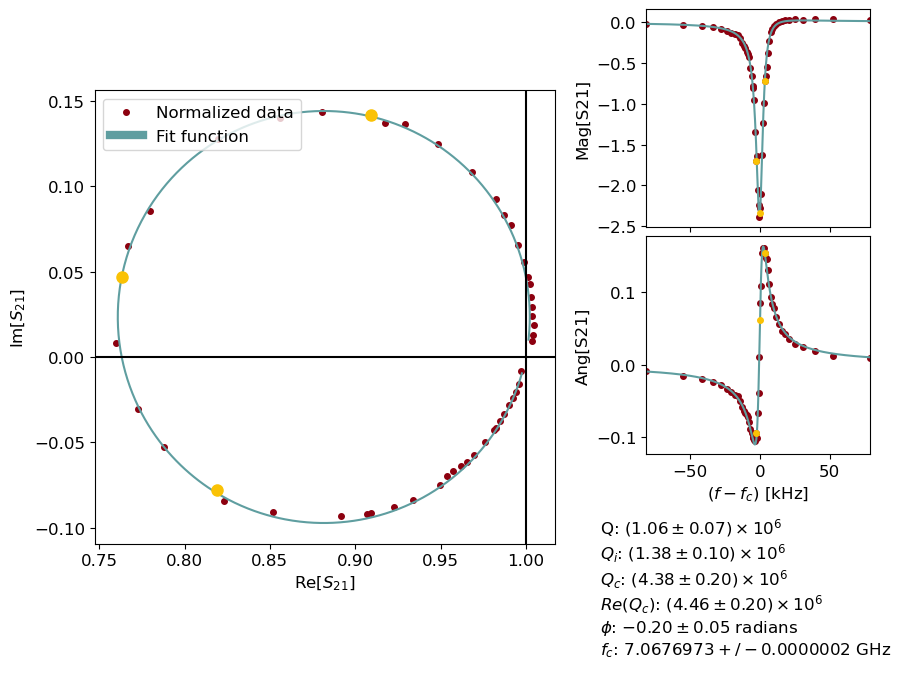

1.8296452047641167
0.12039230584851339


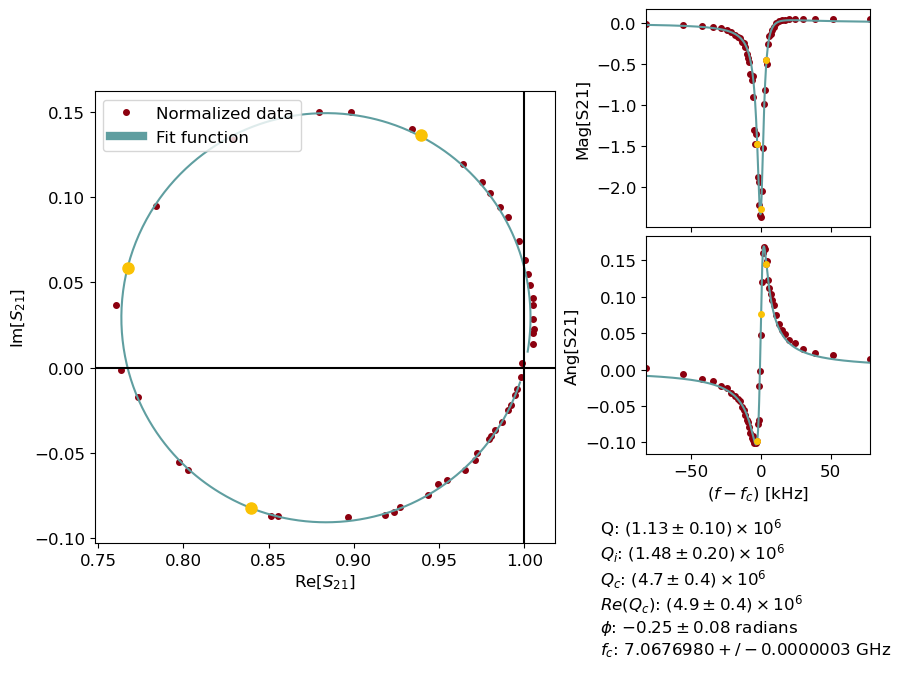

1.8306231879382884
0.12038000488794734


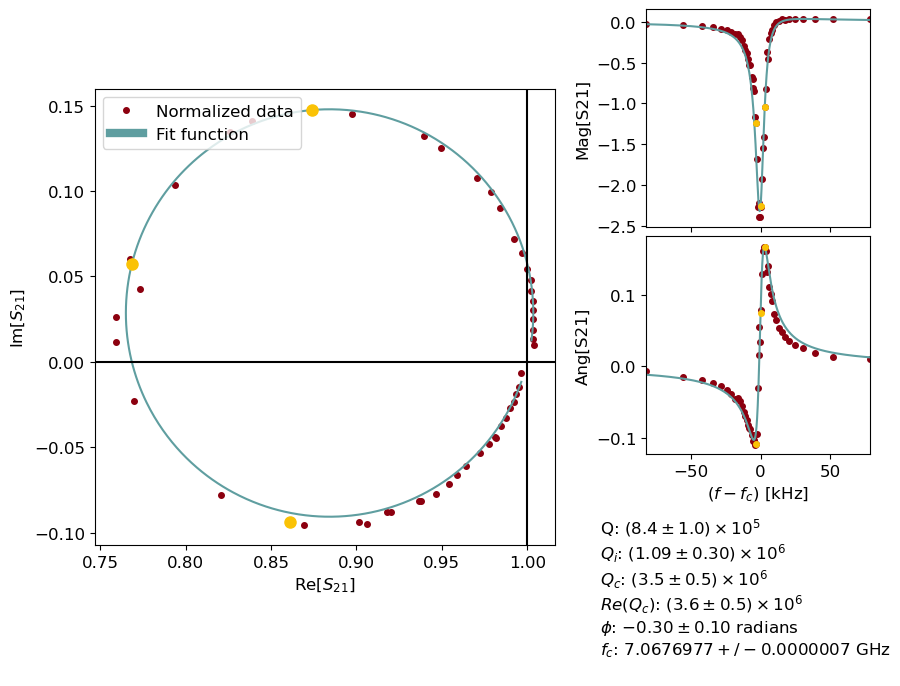

1.8292753583988128
0.12057162412153713


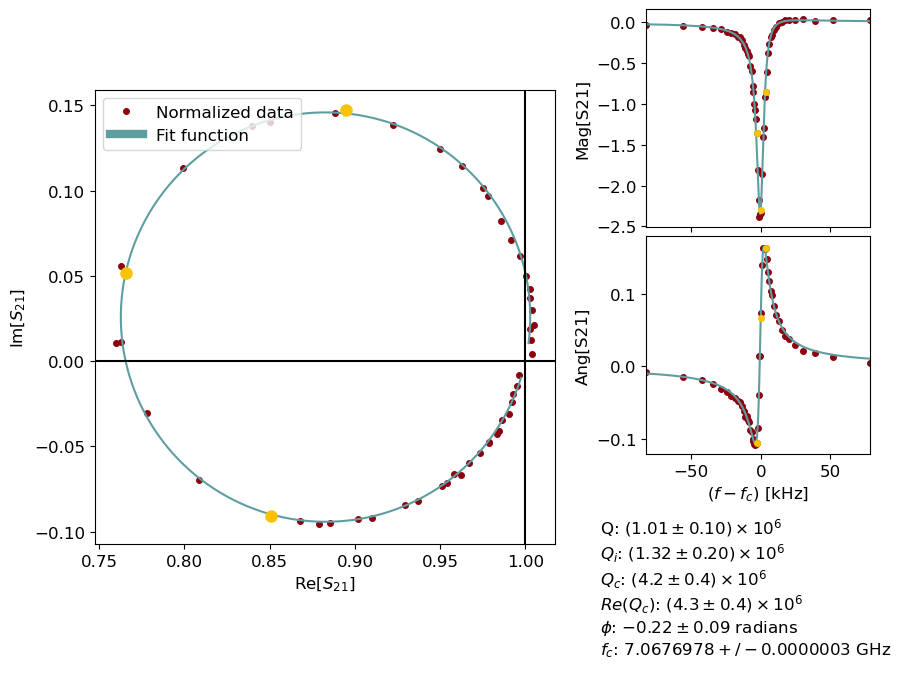

1.8211982685665604
0.12010593743982641


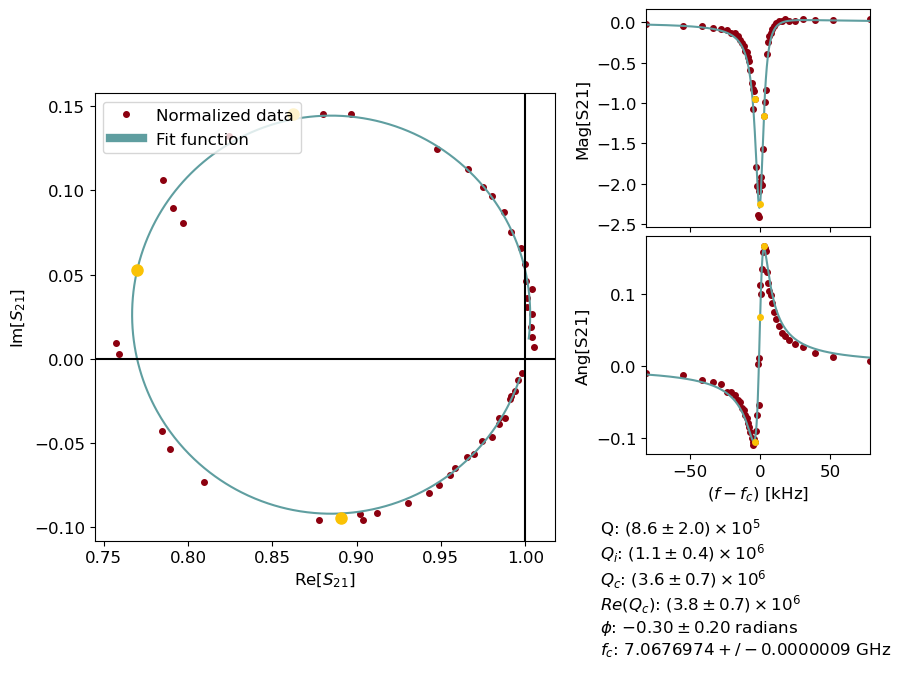

1.8466088590945877
0.12146496845804165


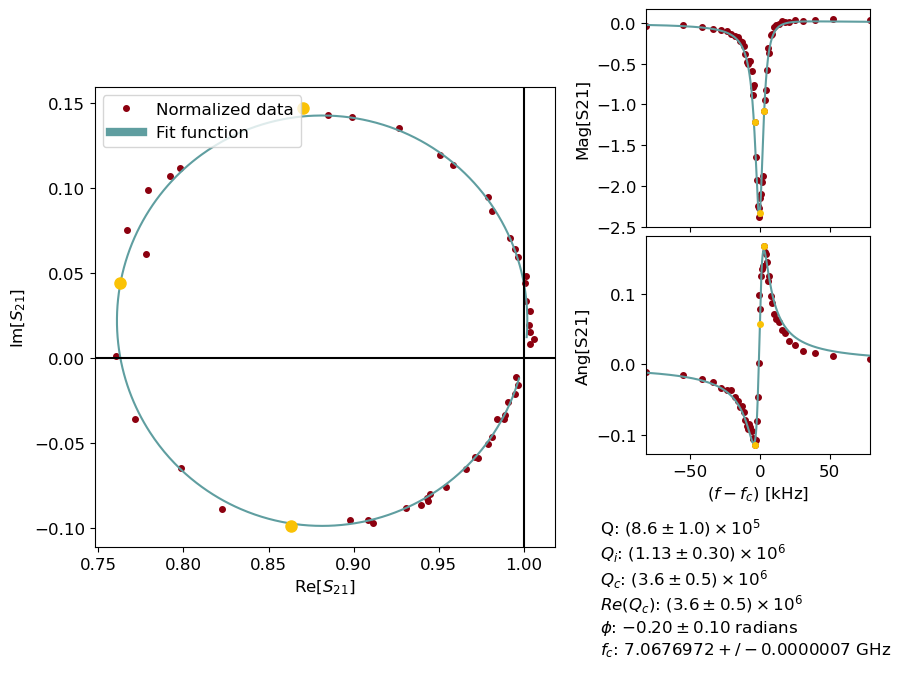

1.8574916629072538
0.12246669176272083


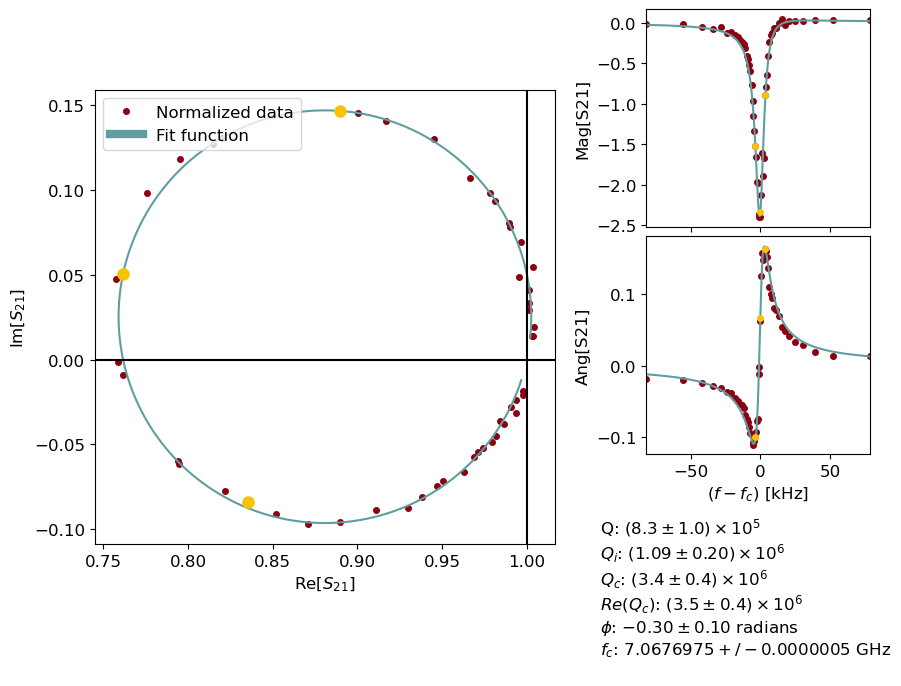

Time elapsed:  921.7039611339569
['res_7475_30', 'res_7475_27', 'res_7475_24', 'res_7475_21', 'res_7475_18', 'res_7475_15', 'res_7475_12', 'res_7475_9', 'res_7475_6', 'res_7475_3', 'res_7475_0']
1.7730056030865446
0.10908429490483529


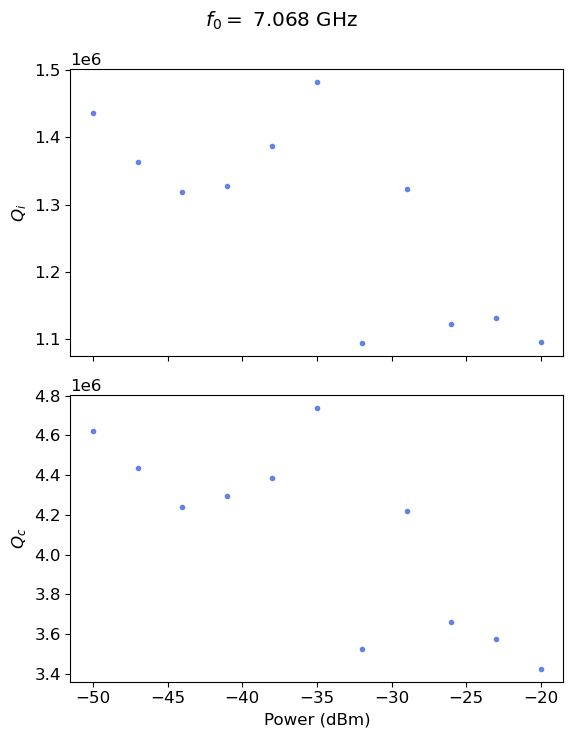

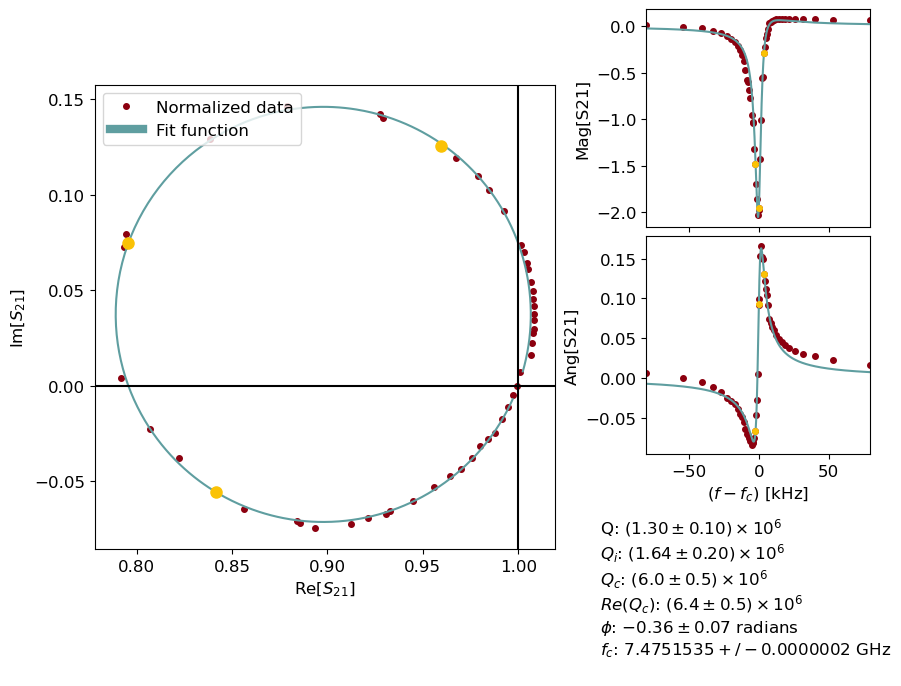

1.8130855489433482
0.11179014514408989


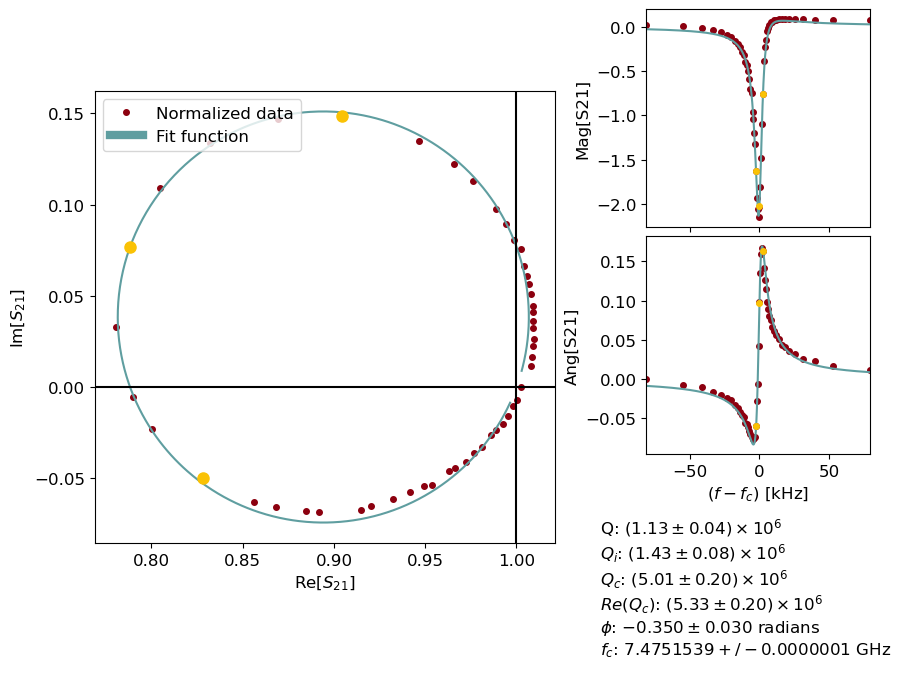

1.8465983718725374
0.11354488462817622


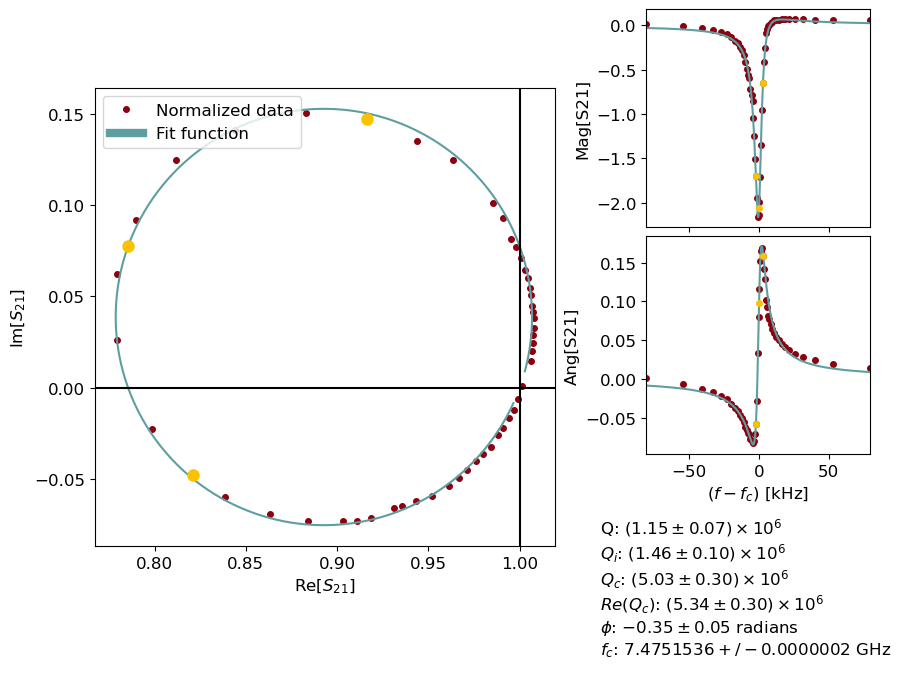

1.8105050504634765
0.11121146695999824


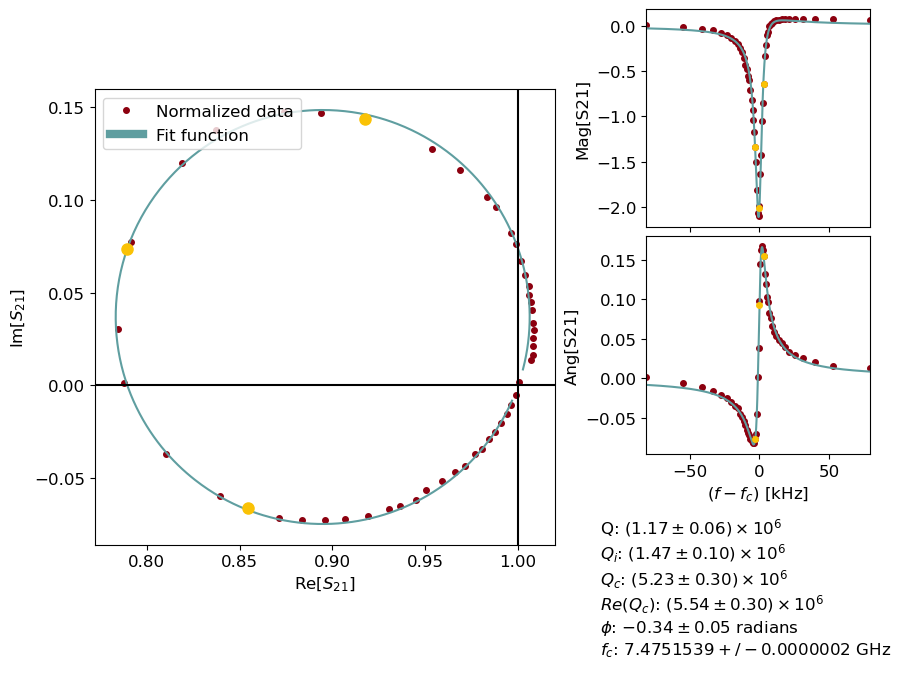

1.7654784439455888
0.1087474929602863


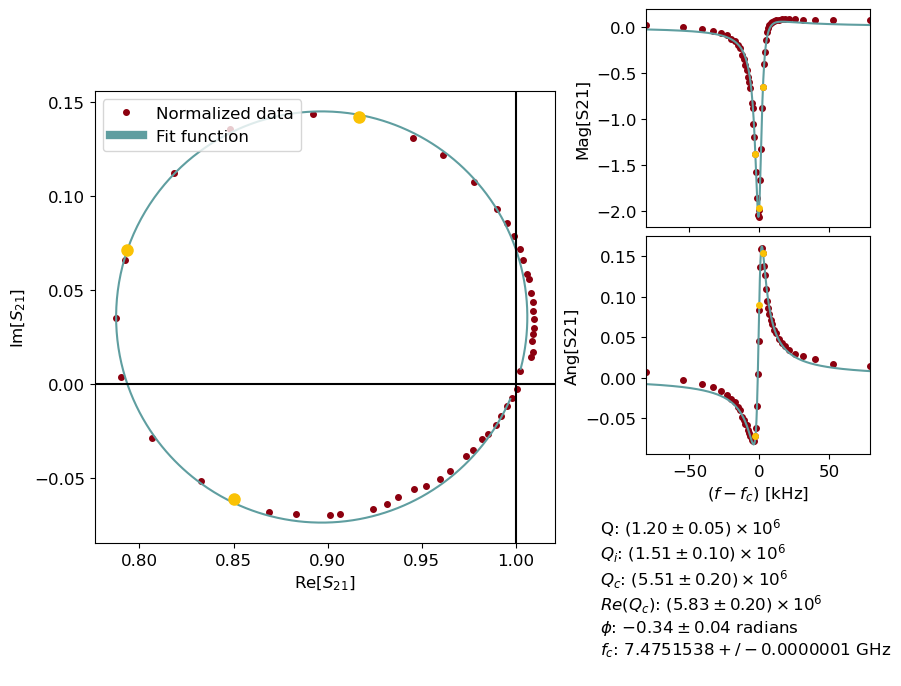

1.796093483195591
0.11057449599036248


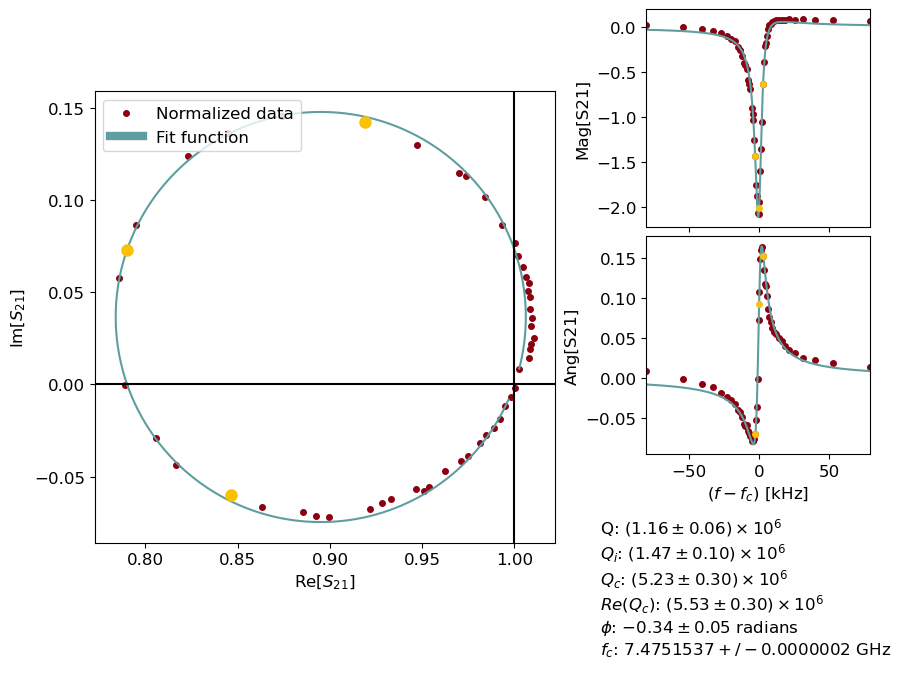

1.7943424132279548
0.11045115366713647


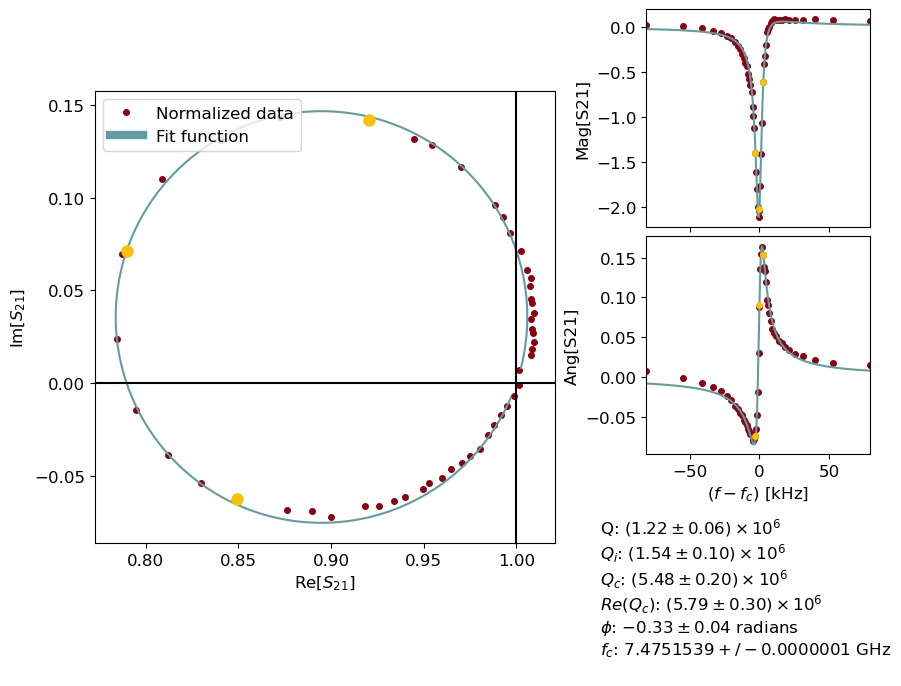

1.819627023186946
0.11200338563304855


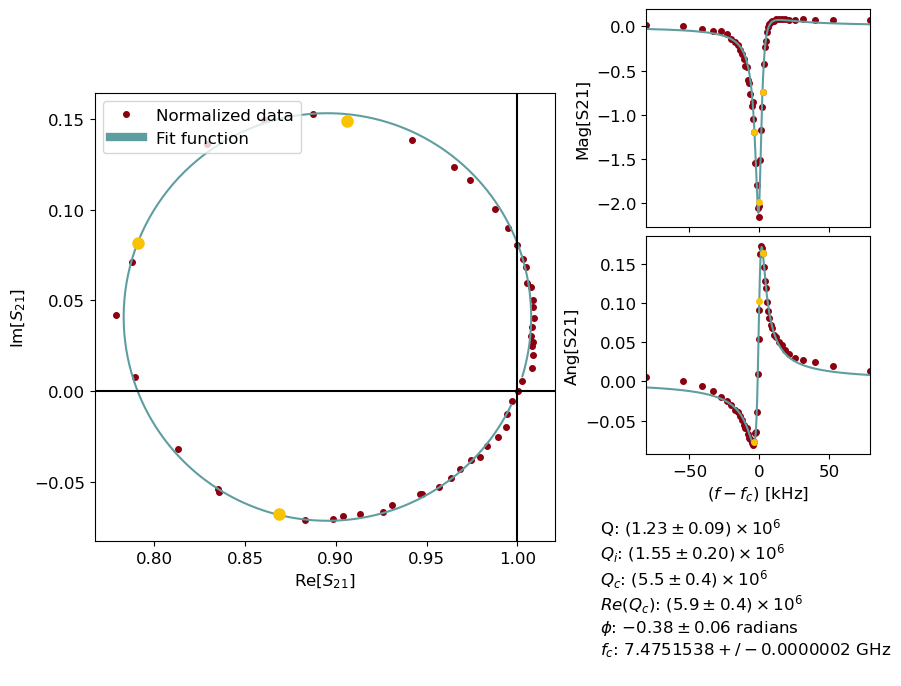

1.8050798048940544
0.1111712860756647


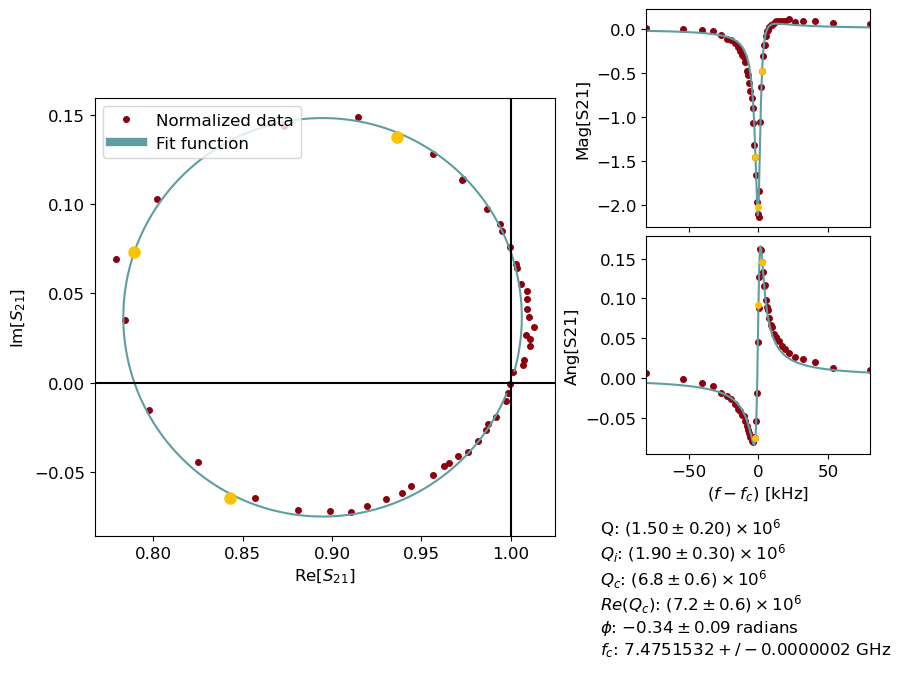

1.7778049089215968
0.10944156873563853


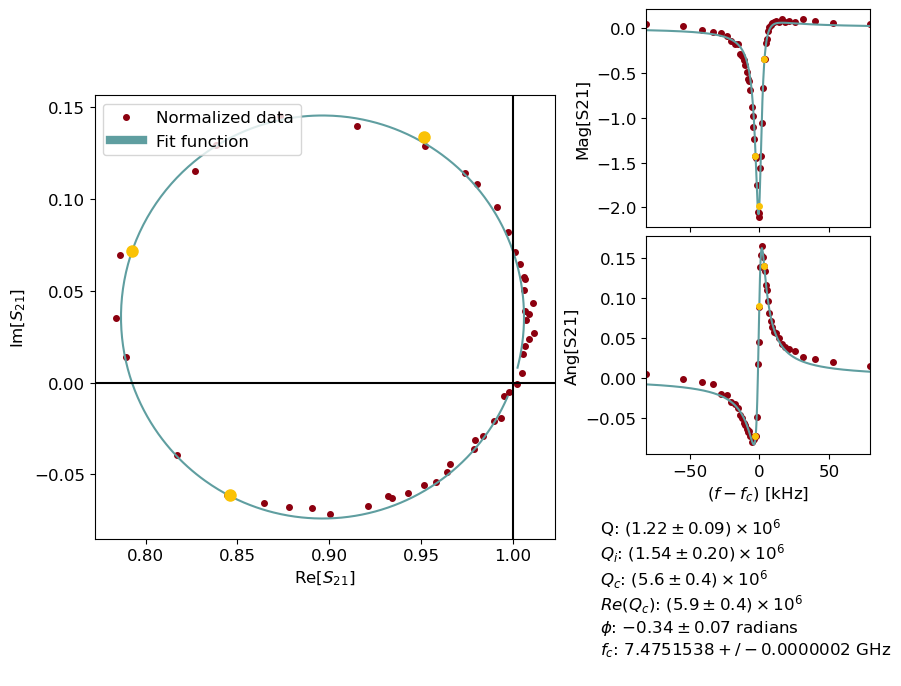

1.778441870376628
0.10939482703423022


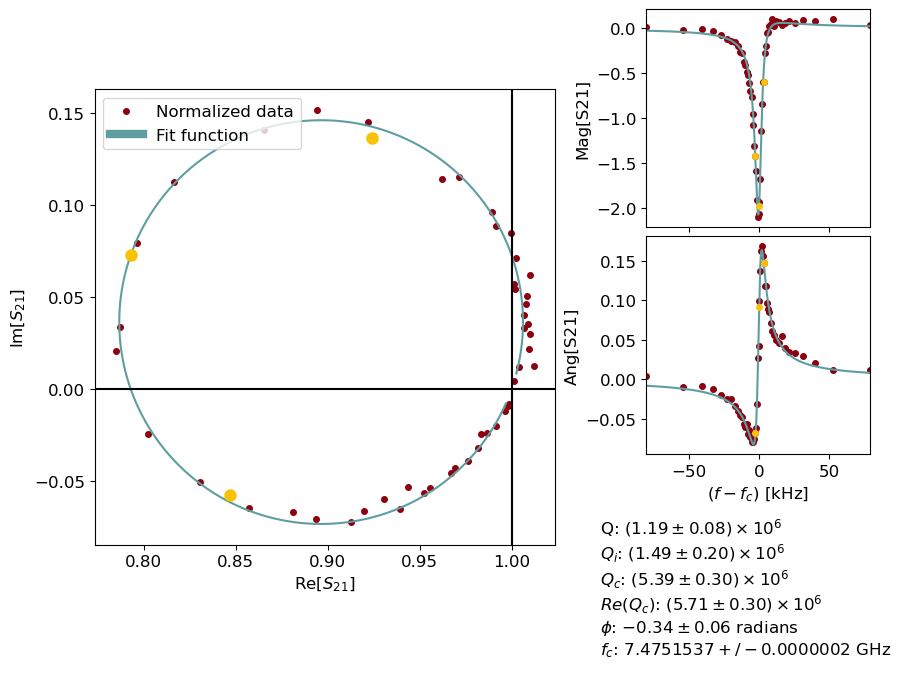

Time elapsed:  1053.7220890522003
['res_7988_30', 'res_7988_27', 'res_7988_24', 'res_7988_21', 'res_7988_18', 'res_7988_15', 'res_7988_12', 'res_7988_9', 'res_7988_6', 'res_7988_3', 'res_7988_0']
1.1929459787883143
0.2581828315100963


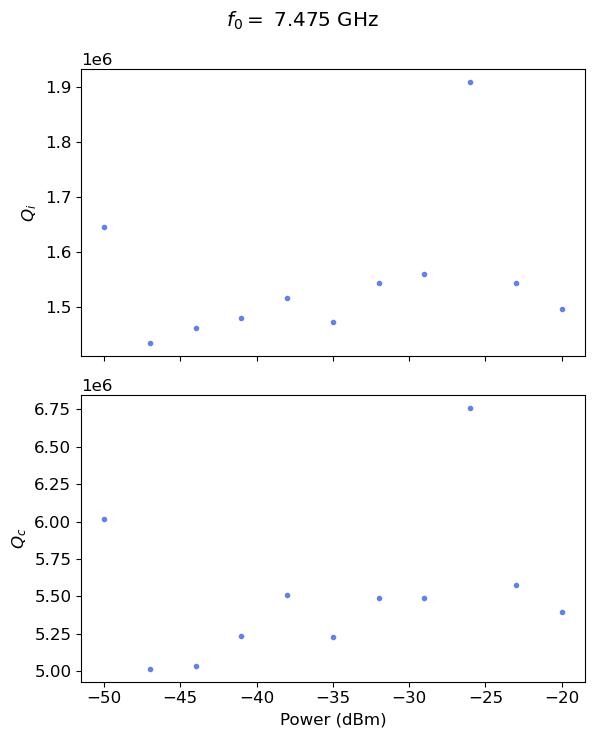

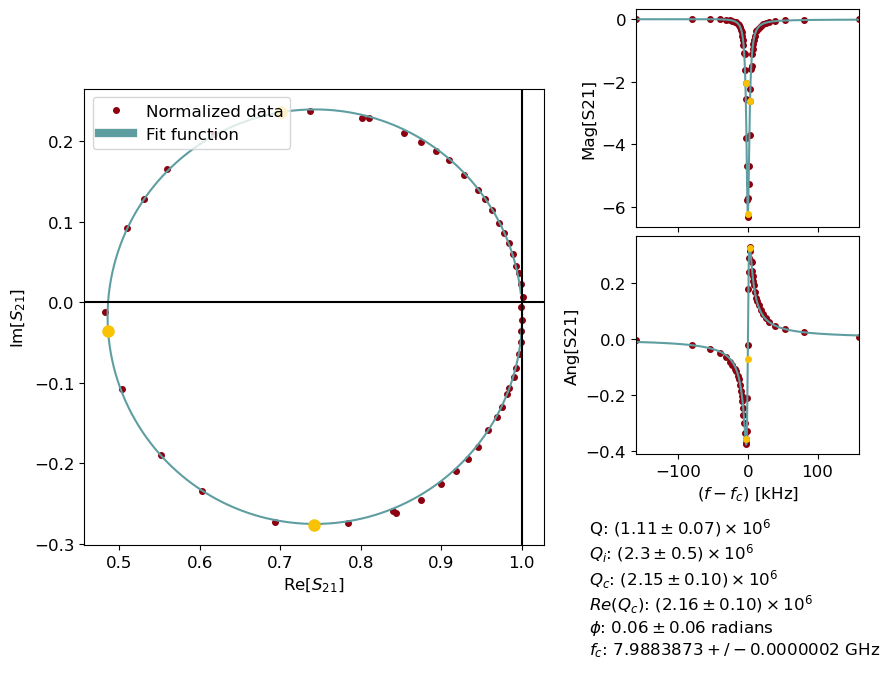

1.1880825381072326
0.25742259629413083


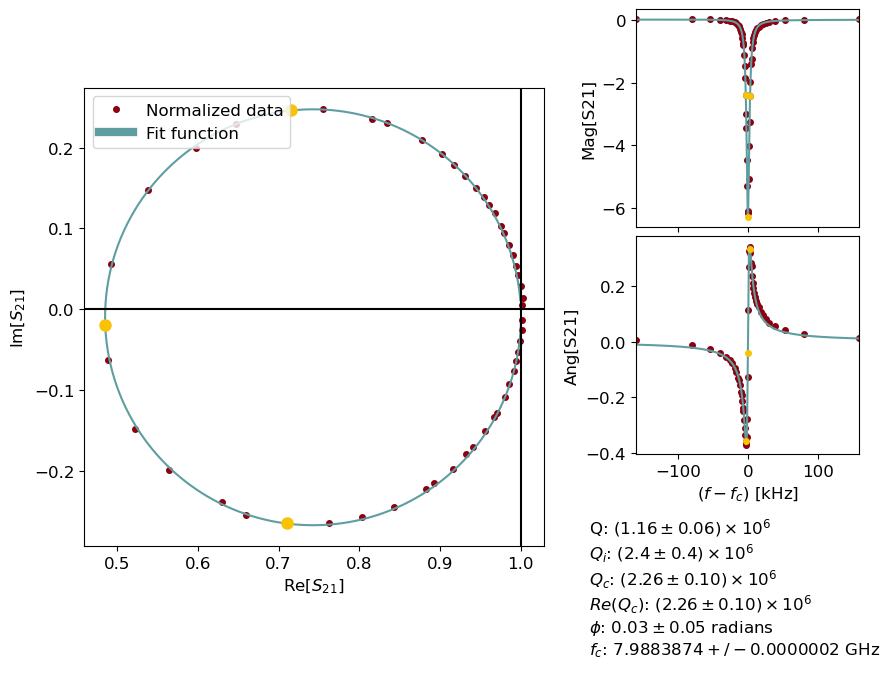

1.1903259410869063
0.25763761114911976


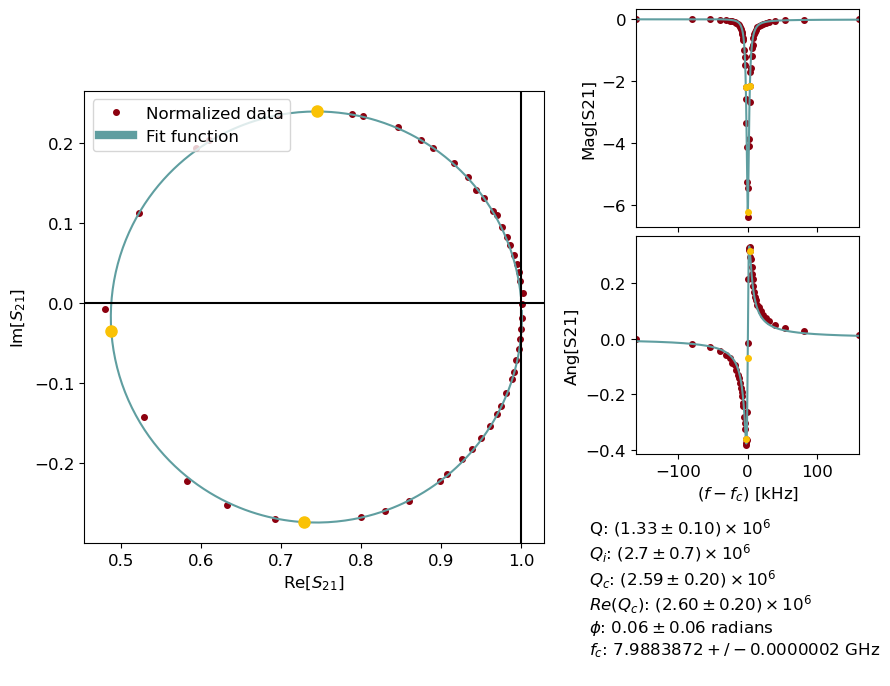

1.1912542863459876
0.2575213957004059


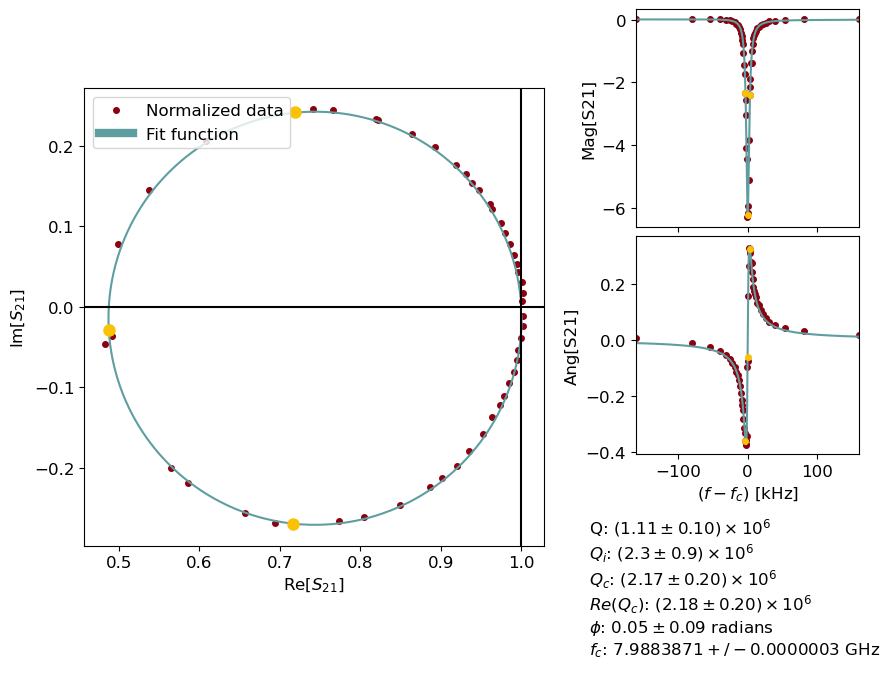

1.187806011845039
0.25733171702397684


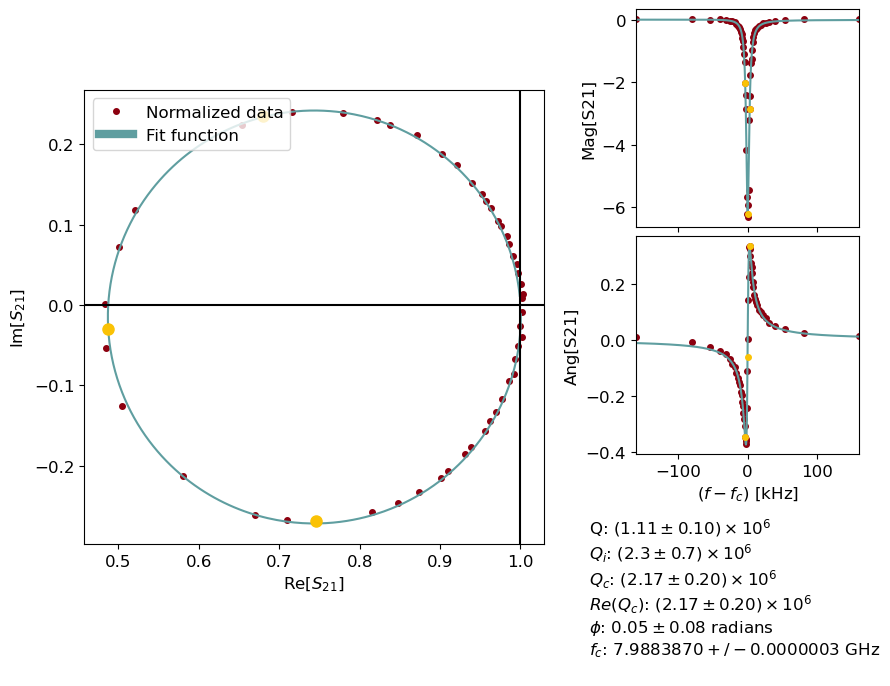

1.1960103578526964
0.25887913675258933


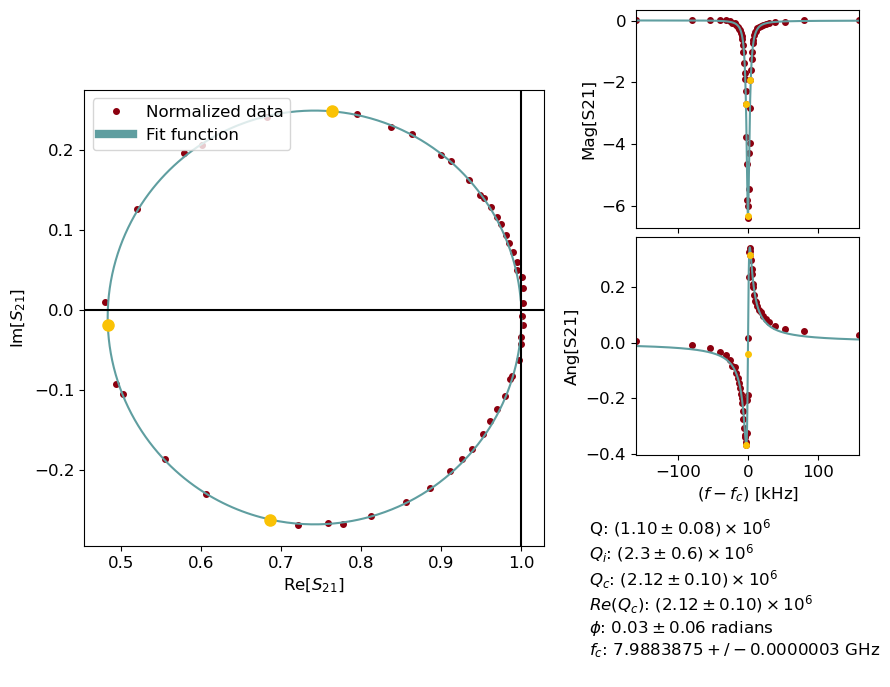

1.1880579988851276
0.2571812706488181


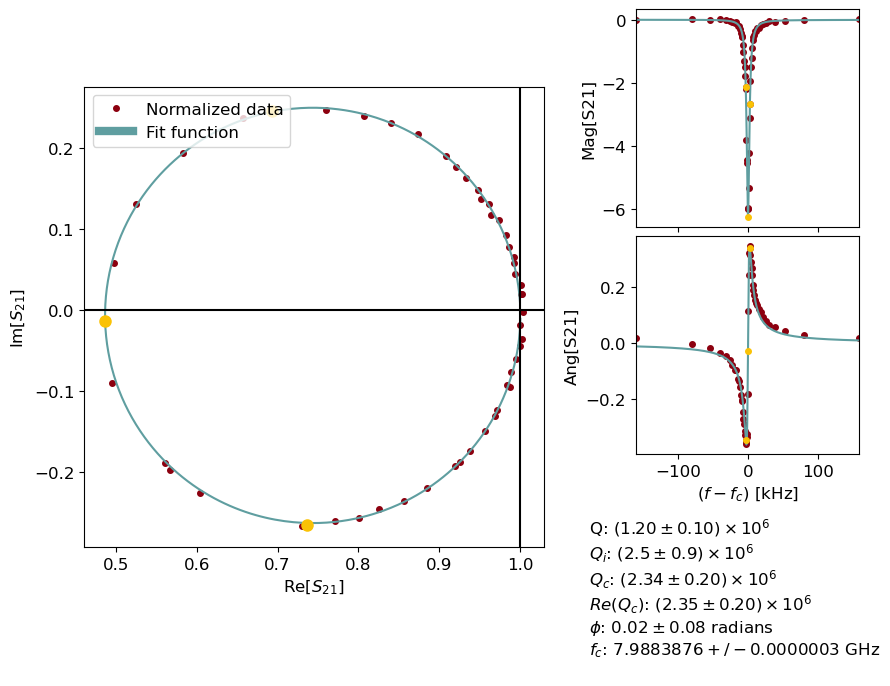

1.1991934344210893
0.2599082210217371


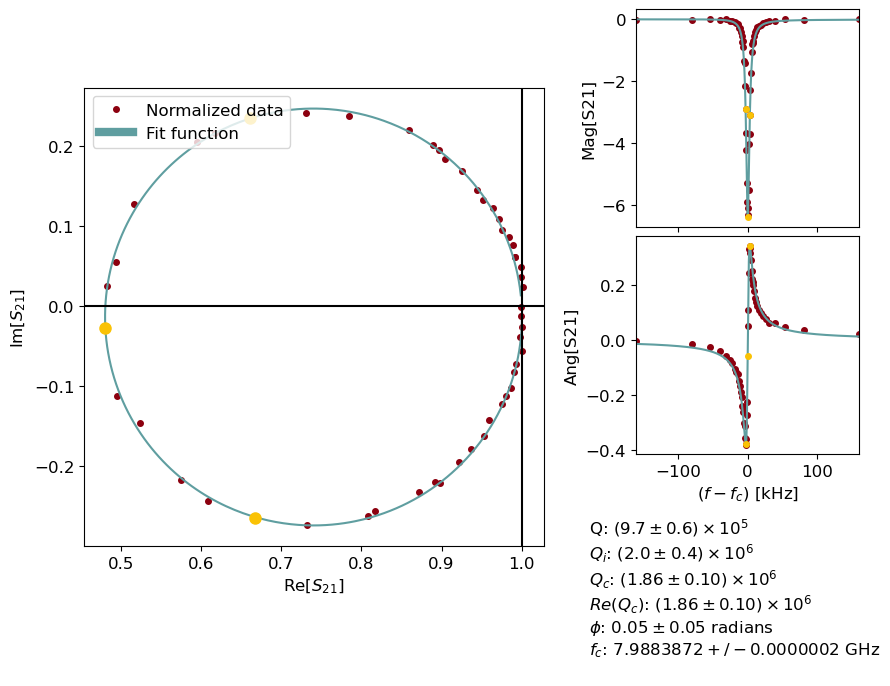

1.1939082652839537
0.2589068989926156


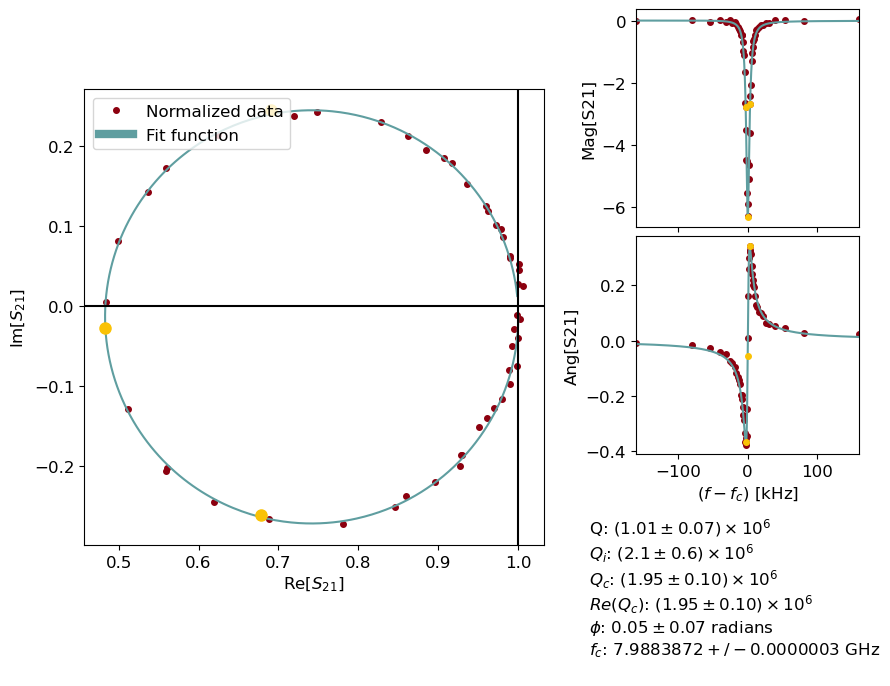

1.1875440115325067
0.25767024111418896


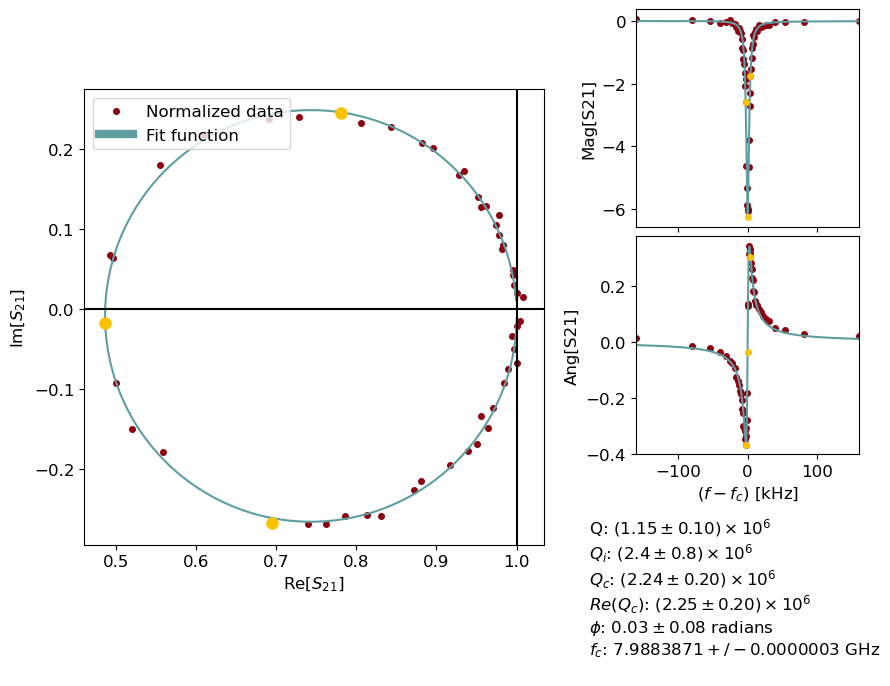

1.182697895514151
0.2562472425076552


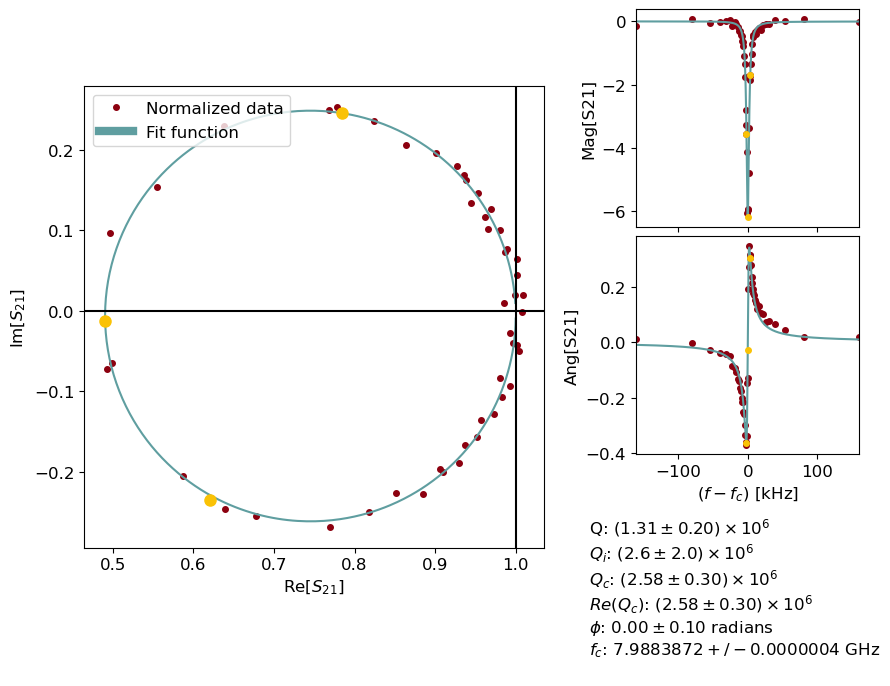

Time elapsed:  1187.2374200820923


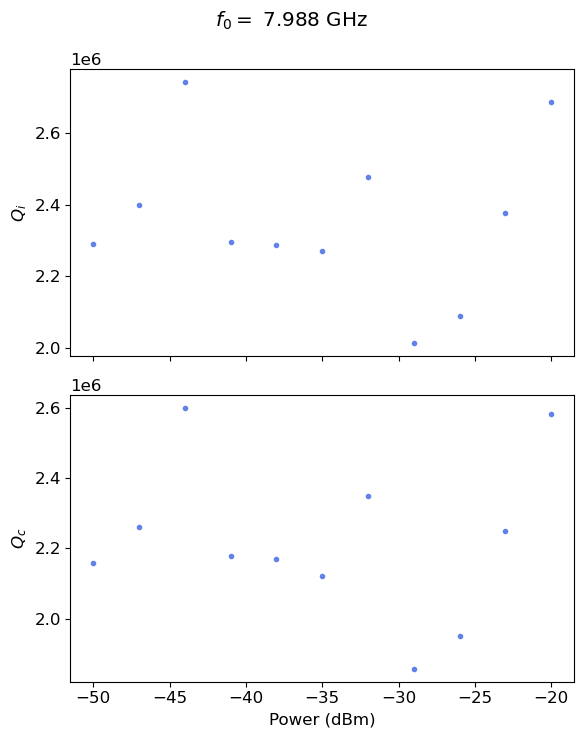

In [172]:
import cProfile

%matplotlib inline
nfiles=1
meas_type='vna'
if params['res_name']=='240725':
    directories = ['power_sweep7']
    res_params = ana_res.analyze_sweep_double(directories, data_pth)
    nfiles = 2
elif params['res_name']=='240719':
    params['min_power']=-85
    directories = ['sample1_power_sweep_2']
    res_param = ana_res.analyze_sweep(directories, data_pth)
    nfiles = 1
elif params['res_name']=='240729':
    directories = ['power_sweep2']
    params['max_power'] = -30
    res_params = ana_res.analyze_sweep_double(directories, data_pth,img_pth=img_pth+'Images/')    
    nfiles = 2
elif params['res_name']=='240729-2':
    directories = ['power_sweep5']
    # there is an issue with power sweep 5 for the 6 um data 
    res_params = ana_res.analyze_sweep_triple(directories, data_pth, img_pth=img_pth+'Images/',name=params['res_name'], plot=False)
elif params['res_name']=='240729-3':
    directories = ['power_sweep4']
    # there is an issue with power sweep 5 for the 6 um data 
    res_params = ana_res.analyze_sweep_triple(directories, data_pth, img_pth=img_pth+'Images/',name=params['res_name'], plot=True)
elif params['res_name']=='240814-2':
    directories = ['powersweep7']
    res_params = ana_res.analyze_sweep_triple(directories, data_pth, img_pth=img_pth+'Images/', name=params['res_name'], plot=False)
    #res_params = ana_res.analyze_sweep(directories, pth, name=params['res_name'], plot=True)
elif params['res_name']=='240729-5':
    meas_type='soc'
    #slope = 23.45293930972242
    slope = 23.9
    directories=['powersweep0']
    res_params = ana_res.analyze_sweep_triple(directories, data_pth, name='rfsoc', img_pth=img_pth+'Images/', plot=True, type=meas_type, slope=slope)
elif params['res_name']=='240729-6':
    meas_type='soc'
    #slope = 23.45293930972242
    slope = 23.9
    directories=['powersweep3']
    res_params = ana_res.analyze_sweep_triple(directories, data_pth, name='rfsoc', img_pth=img_pth+'Images/', plot=True, type=meas_type, slope=slope)
elif params['res_name']=='silicon-scalinq-1':
    directories=['powersweep3']
    nfiles =3
    res_params = ana_res.analyze_sweep_gen(directories, data_pth, name=params['res_name'], img_pth=img_pth, plot=True, nfiles=nfiles)
elif params['res_name']=='241028':
    meas_type='soc'
    directories=['powersweep1']
    nfiles =1
    params['directories']=directories 
    res_params = analyze_sweep_mux(directories, data_pth,img_pth, name=params['res_name'], plot=True, slope=28.425) # slope=28.45)
else:
    print('Sample not found')

In [173]:
# get average frequency
np.set_printoptions(precision=10)
freq_list = np.zeros(8)
for i in range(8):
    freq_list[i] = np.average(res_params[i]['freqs'][0])
print(freq_list)

[             nan 5.9829331755e+09 6.3210407520e+09 6.6800238254e+09
 6.6920317921e+09 6.9927336072e+09 7.0676975217e+09 7.4751537179e+09]


In [174]:
import scresonators.fit_resonator.fit as scfit
def plot_all(directories, pth_base,  output_path, name='res',min_power=-120, max_power =-25, norm=False,nfiles=3, meas_type='vna', slope=0):
    if nfiles==3:
        if meas_type=='vna': 
            pattern_end = 'dbm_'
            ends = ['wide1', 'narrow', 'wide2']
        else:
            pattern_end = '_'
            ends = ['wideleft', 'narrow','wideright']
        pattern0 = r'res_(\d+)_\d{2,5}' + pattern_end + ends[0]
    elif nfiles==2:
        pattern0 = r'res_(\d+)_\d{2,3}dbm_wide'
    else:
        pattern0 = r'res_(\d+)'

    # Initialize dict by getting list of resonators, creating dict with len = n resonators
    resonators, file_list = ana_res.get_resonators(directories[0],pth_base, pattern0)
    nres = len(resonators)
    
    sns.set_palette('coolwarm', n_colors=int(np.ceil(len(file_list)/nres)))
    fig, ax = plt.subplots(2,4, figsize=(10, 7))
    fig2, ax2 = plt.subplots(2,4, figsize=(10, 7))
    ax=ax.flatten(); ax2=ax2.flatten()

    # Each directory is a temperature 
    for i in range(len(directories)):         
        
        resonators, file_list0 = ana_res.get_resonators(directories[i], pth_base, pattern0)
        pth = pth_base + directories[i]
        for j in range(len(resonators)): 
            # Grab all the files for a given resonator, then sort by power. 
            if nfiles ==3:                
                pattern = 'res_{:d}_'.format(resonators[j]) + '(\d{2,5})'+pattern_end+ends[0]
            elif nfiles==2: 
                pattern = 'res_{:d}_'.format(resonators[j]) + '(\d{2,3})dbm_wide'
            else:
                pattern = 'res_{:d}_'.format(resonators[j]) + r'(\d+)'
            file_list = ana_res.get_resonator_power_list(pattern, file_list0)
 
            for k in range(len(file_list)):                
                # try: 
                if nfiles==3:
                    data1, attrs = ana_res.grab_data(pth, file_list[k], meas_type, slope)
                    file2 = file_list[k].replace(ends[0], ends[1])
                    data2, _ = ana_res.grab_data(pth, file2, meas_type, slope)
                    data = ana_res.combine_data(data1, data2)
                    file3 = file_list[k].replace(ends[0], ends[2])                
                    data3, _ = ana_res.grab_data(pth, file3, meas_type, slope)
                    data = ana_res.combine_data(data, data3) 
                    #print('checked')
                elif nfiles==2: 
                    data1 = ana_res.grab_data(pth, file_list[k])
                    file2 = file_list[k].replace('wide', 'narrow')
                    data2 = ana_res.grab_data(pth, file2)
                    data = ana_res.combine_data(data1, data2)
                    #print('checked')
                else:
                    data, attrs = ana_res.grab_data(pth, file_list[k],  meas_type='soc', slope=slope)
                    #print('checked')
                # except:
                #     continue
                if meas_type=='vna' :
                    if data1['vna_power'][0]>max_power or data1['vna_power'][0]<min_power: 
                        continue
                #print(np.max(data1['freqs'])-np.min(data2['freqs']))
                #print(np.max(data2['freqs'])-np.min(data3['freqs']))
                
                if norm: 
                    x = 10**(data['amps']/20)*np.cos(data['phases'])
                    y = 10**(data['amps']/20)*np.sin(data['phases'])
                    #z = scfit.preprocess_linear(x, y, normalize=5, output_path='hi', plot_extra=False)
                    z = scfit.preprocess_circle(data['freqs'], x+1j*y, output_path='hi', plot_extra=False)
                    ax[j].plot((data['freqs']-np.mean(data['freqs']))/1e3, np.log10(np.abs(z)) * 20, linewidth=1)
                    ax2[j].plot((data['freqs']-np.mean(data['freqs']))/1e3, np.angle(z), linewidth=1)
                else:
                    ax[j].plot((data['freqs']-np.mean(data['freqs']))/1e3, data['amps'], linewidth=1)
                    ax2[j].plot((data['freqs']-np.mean(data['freqs']))/1e3, data['phases'], linewidth=1)

            #print(np.max(data1['freqs'])-np.min(data1['freqs']))
            #print(np.min(data2['freqs'])-np.min(data1['freqs']), np.max(data1['freqs'])-np.min(data2['freqs']))
            #print(np.min(data3['freqs'])-np.min(data2['freqs']), np.max(data2['freqs'])-np.min(data3['freqs']))
            fig.tight_layout()
            fig2.tight_layout()
            fig2.savefig(output_path +name+'_' + directories[i] + '_all_data_phase.png', dpi=300)                 
            fig.savefig(output_path +name+'_' + directories[i] + '_all_data_amp.png', dpi=300)    

Counter({7988: 11, 7475: 11, 6992: 11, 6321: 11, 6680: 11, 5982: 11, 7067: 11, 6692: 11, 3000: 2})
Counter({7988: 11, 7475: 11, 6992: 11, 6321: 11, 6680: 11, 5982: 11, 7067: 11, 6692: 11, 3000: 2})
['res_3000_3', 'res_3000_0']
14.185877486624085
1.953894215651365
4.695400829026456
0.4013793083766555
['res_5982_30', 'res_5982_27', 'res_5982_24', 'res_5982_21', 'res_5982_18', 'res_5982_15', 'res_5982_12', 'res_5982_9', 'res_5982_6', 'res_5982_3', 'res_5982_0']
15.949554992978078
0.5594295555412847
16.001205170017787
0.560679563851388
16.008661209212427
0.5601828812731207
15.972734605761348
0.5593293764506124
15.98021521423963
0.5606470721031263
16.022572657093527
0.5617171639406784
16.073629930968636
0.5628892508500011
16.09574235775822
0.5630354594153878
16.06338998515363
0.5625836825673927
16.065676931051406
0.5622859405197098
16.006917553495985
0.5601477093149845
['res_6321_30', 'res_6321_27', 'res_6321_24', 'res_6321_21', 'res_6321_18', 'res_6321_15', 'res_6321_12', 'res_6321_9', 're

IndexError: index 8 is out of bounds for axis 0 with size 8

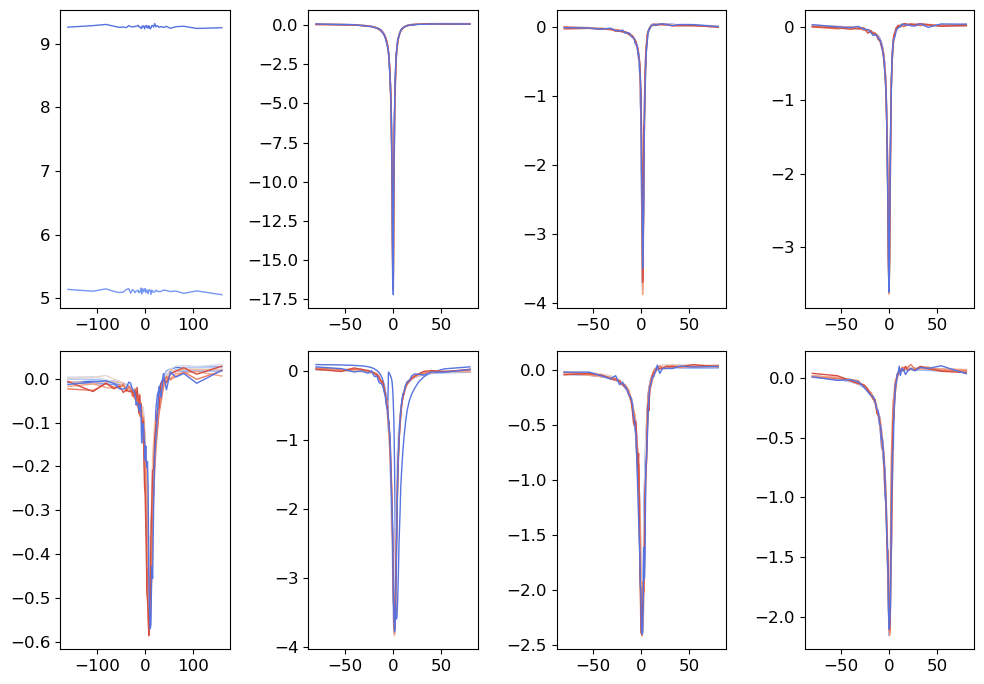

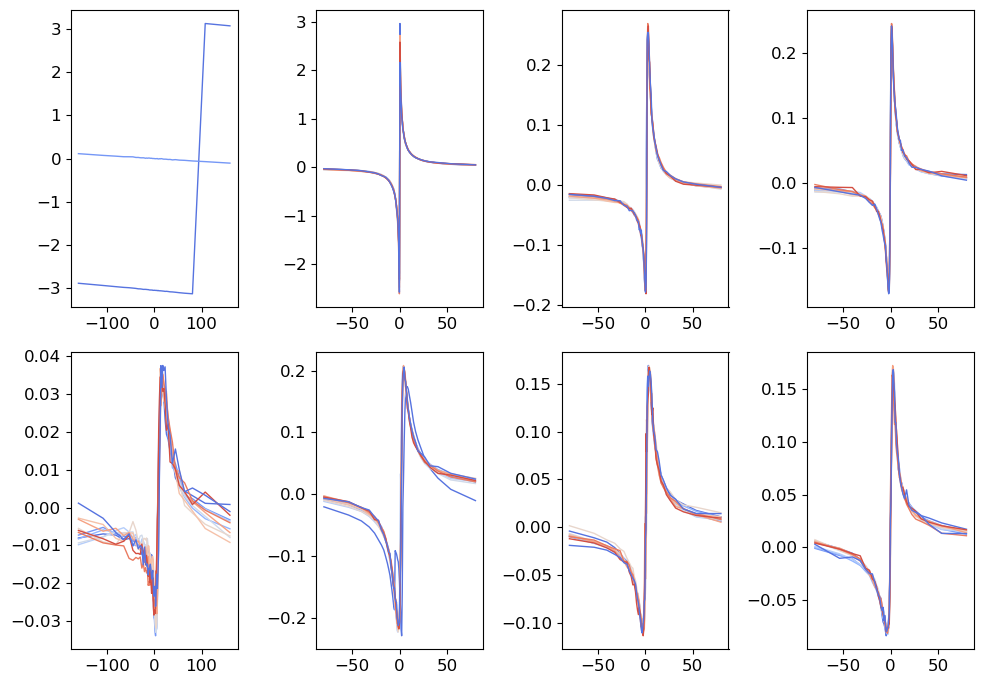

In [175]:
#slope = 0
#%matplotlib widget
plot_all(directories, data_pth, output_path=img_pth, max_power=-15, norm=True, nfiles=1, meas_type=meas_type, slope=28.4)

#### Reorder the data based on pitch (only run once)

In [163]:

# if meas_type=='soc':
#     res_params = ana_res.convert_power(res_params) 

params, res_params=ana_res.reorder(params, res_params) # only run once!
params['qc'] = np.array([np.nanmedian(res_params[i]['qc']) for i in range(len(res_params))])
params['qc_err'] = np.array([np.nanmedian(res_params[i]['qc_err']) for i in range(len(res_params))])
params['freqs'] = np.array([np.nanmedian(res_params[i]['freqs']) for i in range(len(res_params))])
params['phs'] = np.array([np.nanmedian(res_params[i]['phs']) for i in range(len(res_params))])

### Power sweep and TLS fits

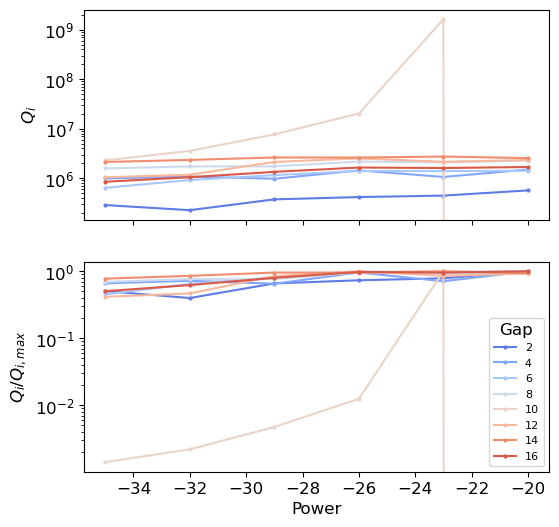

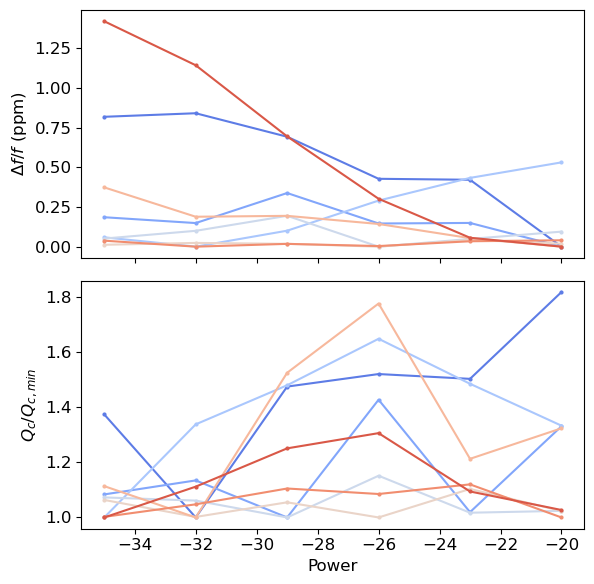

Failed!


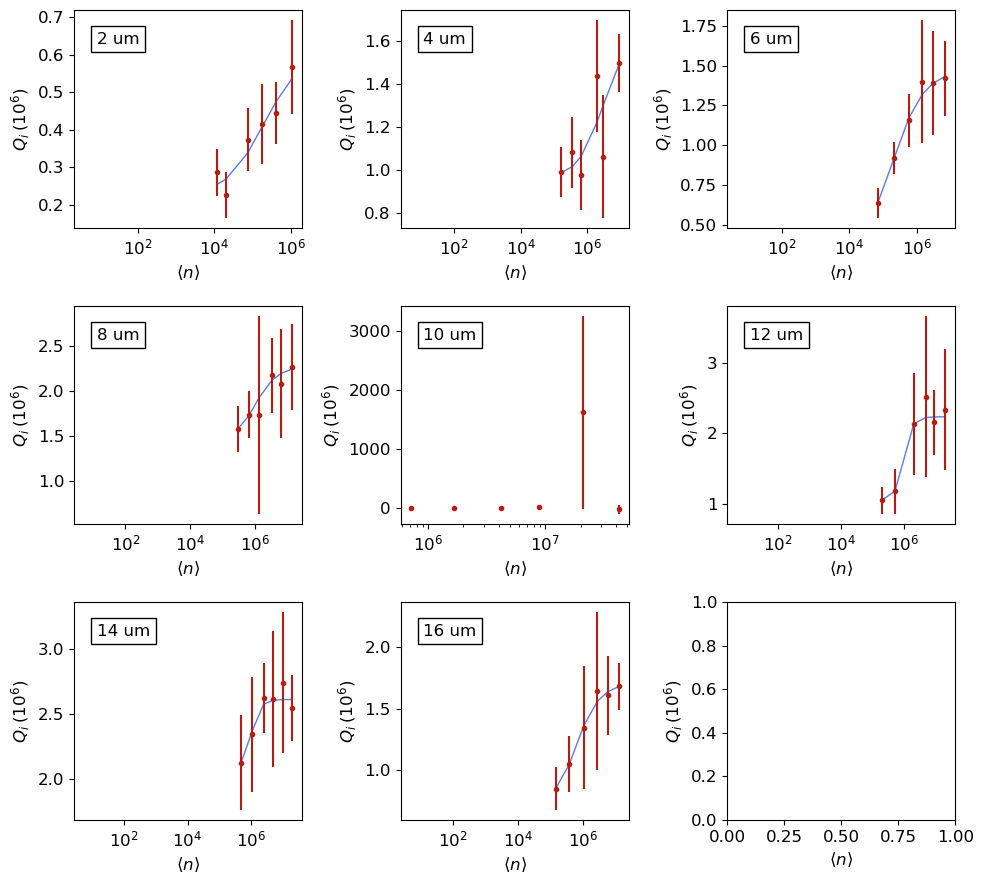

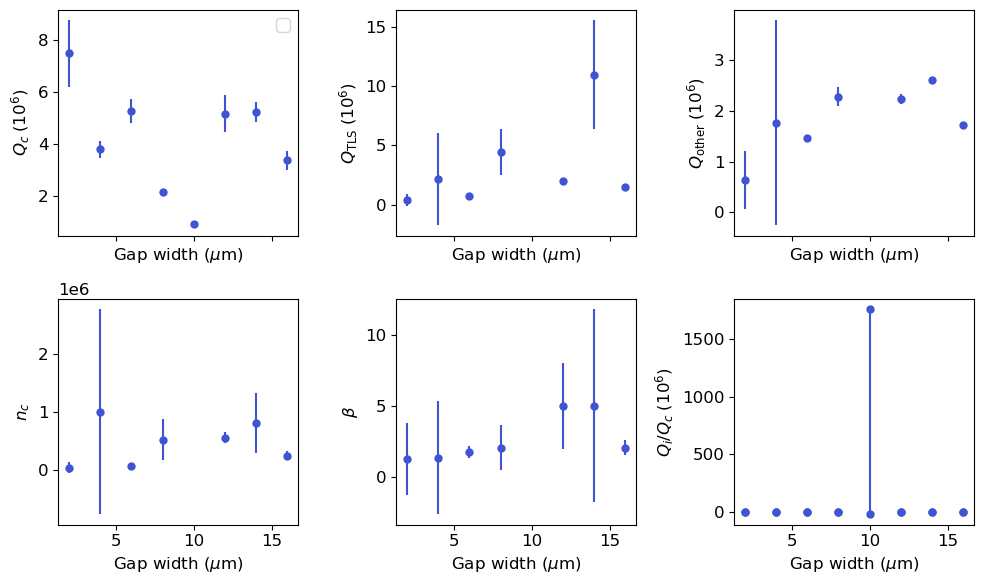

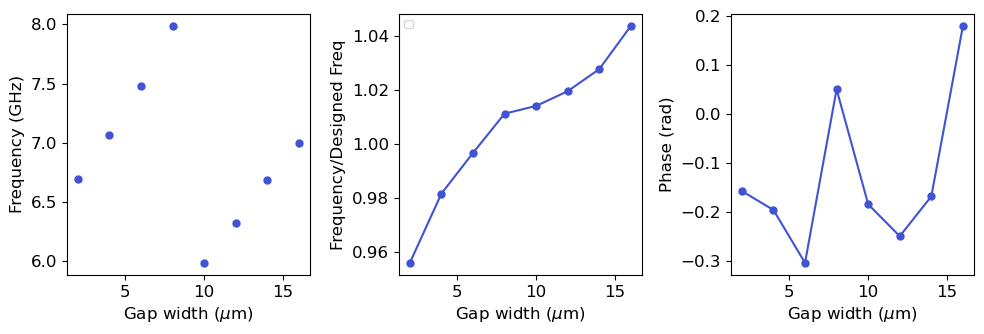

In [164]:

#%matplotlib widget
ana_res.plot_power(res_params, params, img_pth, use_pitch=True);
cfg = ana_tls.fit_qi(res_params, params, img_pth);
ana_tls.plot_res_pars([params], [''],img_pth);
ana_res.plot_res_pars([params], [''], img_pth);
hy.save_np(params, img_pth+'Text/' + params['res_name'] +cfg["directories"][0]+'.yml');


In [165]:

# soc_res_params = np.load(img_pth + 'other_files/soc_power_sweep.npy', allow_pickle=True)
# soc_res_params = np.load(img_pth + 'other_files/soc_power_sweep.npy', allow_pickle=True)
# np.save(img_pth + 'other_files/soc_power_sweep' , np.array(res_params))
#np.save(img_pth + 'other_files/vna_power_sweep' , np.array(res_params))
#print(np.array(res_params)[0]['qi'])

Failed!


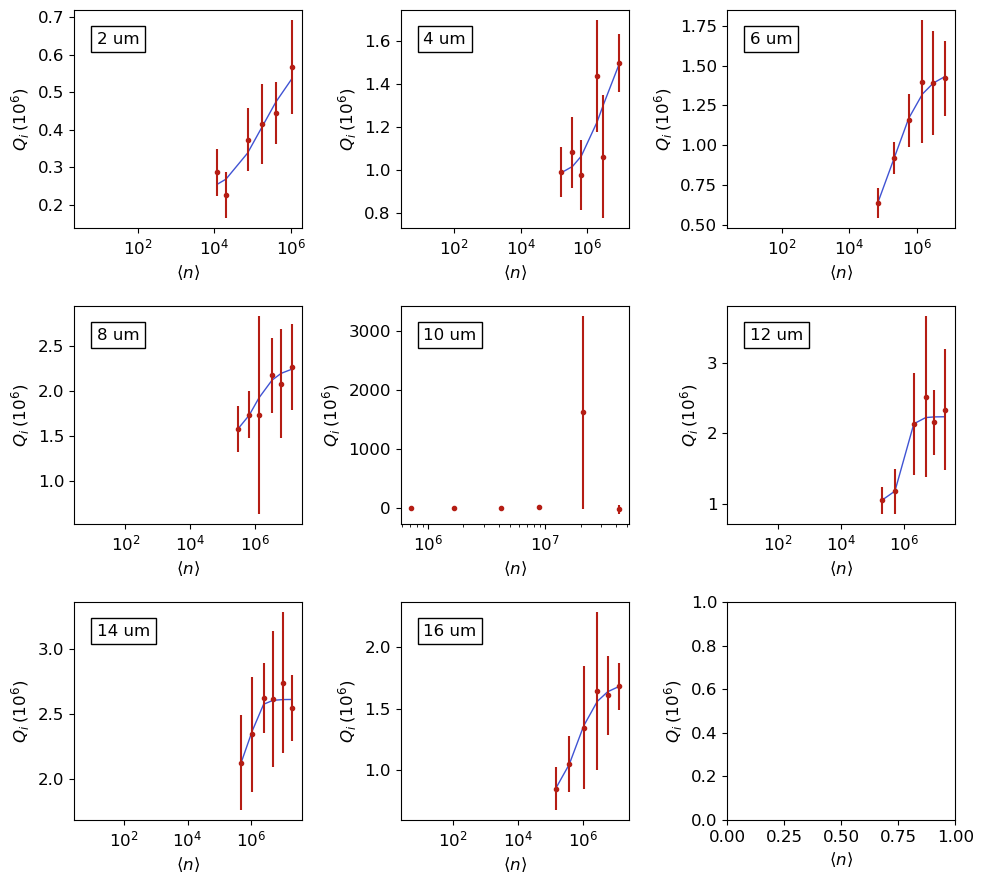

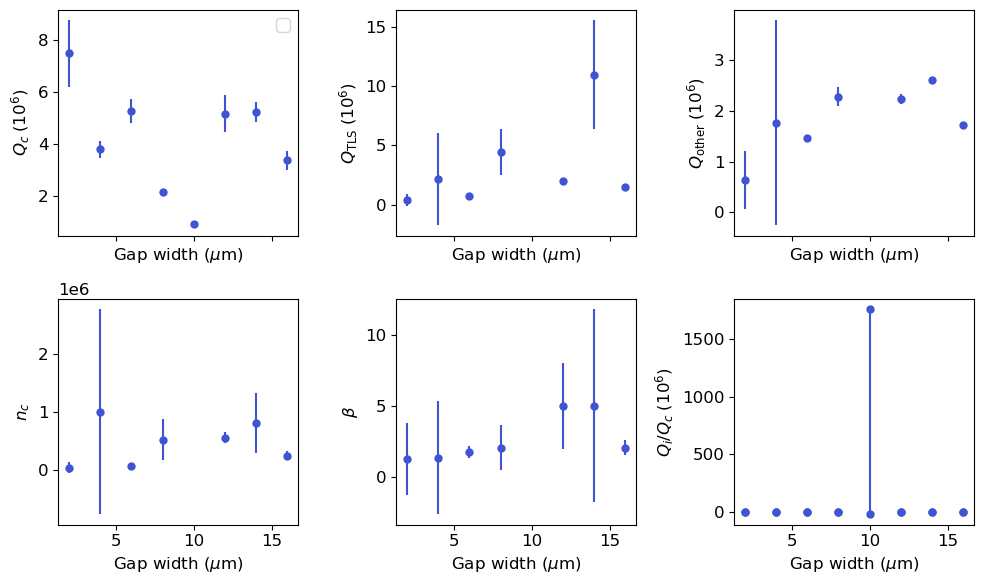

In [166]:
%matplotlib inline
max_power = np.ones(8)*5
min_power = [-45, -45, -55, -45, -55, -45, -55, -55]
    
cfg = ana_tls.fit_qi(res_params, params, img_pth, max_power_vec = max_power, min_power_vec = min_power) 
ana_tls.plot_res_pars([params], [''],img_pth)
params_no_hf = copy.deepcopy(params)
hy.save_np(params, img_pth+'Text/' + params['res_name'] +cfg["directories"][0]+'skip_bad.yml');


In [167]:
res_params[0]

{'freqs': array([[6.6920397131e+09, 6.6920398631e+09, 6.6920388716e+09,
         6.6920370968e+09, 6.6920370558e+09, 6.6920342332e+09]]),
 'phs': array([[-0.0859576049, -0.1514590779, -0.0890680456, -0.1629822021,
         -0.2614782558, -0.1747572976]]),
 'q': array([[275602.3782390452, 216646.4839826084, 356055.0771541354,
         395302.5596144744, 421770.8569666864, 535169.5047085178]]),
 'qi': array([[286994.5149995566, 226275.4090074491, 373910.2558105949,
         416523.504289524 , 445768.8338472542, 567855.5005456881]]),
 'qc': array([[6917432.8172381   , 5032812.03278049  , 7426692.1738089565,
         7656152.627896038 , 7568202.827381301 , 9155914.741072757 ]]),
 'qi_phi': array([[287038.4833291451, 226391.9336658614, 373984.8925631621,
         416824.0222763165, 446663.0908146905, 568392.4327637204]]),
 'pow': array([[-35., -32., -29., -26., -23., -20.]]),
 'qi_err': array([[ 63190.98367752  ,  60842.3893080395,  84382.1649583016,
         107220.8918363381,  82546.98231

### Print out info for running scans

In [54]:
lw=[]
freq =[]
print('linewidth')
for i in range(len(params['freqs'])):
    q = 1/(1/params['qi0'][i]+1/params['qc'][i])
    lw.append(params['freqs'][i]/q)
    freq.append(params['freqs'][i]/1e6)

print(lw)
print(freq)

linewidth
[-8145.945507546873, 42233.98946574231, 22891.537723843838, 51991.917096785124, 22571.177759138904, 11764.523152839645, 15351.229342905825, 14542.56264719878]
[6692.01336451355, 7067.6771662131805, 7475.14180008946, 7988.404864956734, 5982.929797032715, 6321.036177429096, 6680.018581599546, 6992.729830532029]


In [5]:
import numpy as np
np.array([6692.023378117968, 7067.673789817566, 7475.142110953416, 7988.392456643053, 5982.9289391823595, 6321.0363892364885, 6680.01917300263, 6992.729365534796])/1e3


array([6.69202338, 7.06767379, 7.47514211, 7.98839246, 5.98292894,
       6.32103639, 6.68001917, 6.99272937])

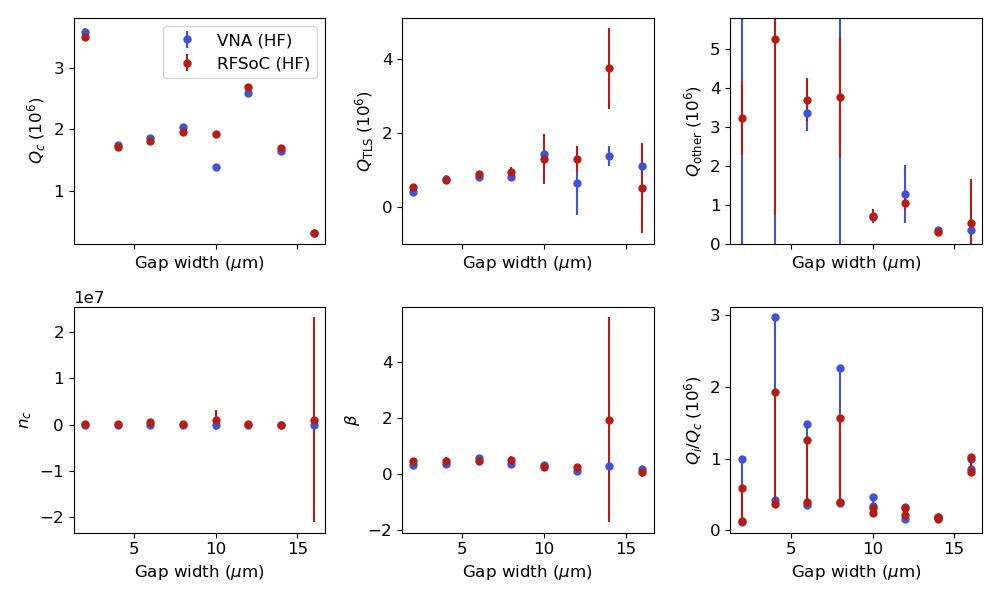

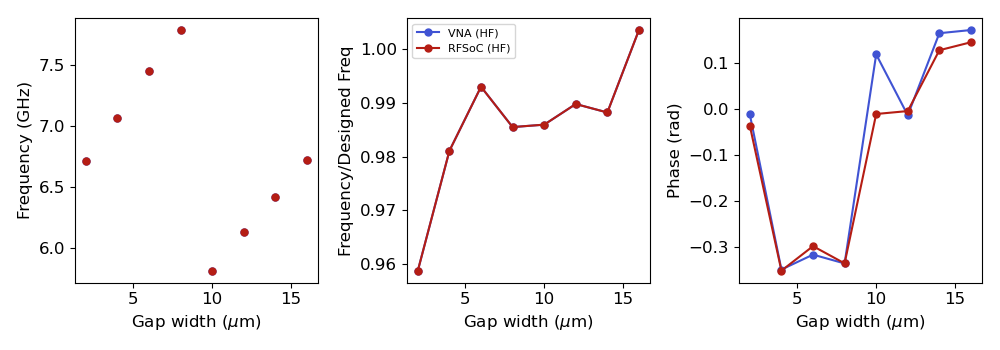

In [ ]:
%matplotlib widget
#pnames = ['240814-2','240725','240729-2', '240729-4']
#labs = ['ScalinQ (No HF)', 'SLab (No HF)', 'SLab (HF)', 'RFSoC (HF)'] 

#pnames = ['240729-2', '240729-3']
pnames = ['240729-3', '240820_soc']
labs = ['VNA (HF)', 'RFSoC (HF)'] 
plist =[]
for p in pnames:
    plist.append(hy.load(img_pth +'Text/'+ p + '.yml'))

ana_tls.plot_res_pars(plist, labs,img_pth)
ana_res.plot_res_pars(plist, labs,img_pth)


## Single resonators

In [ ]:
# Grab list of resonators following corect format in directory. 

pattern0 = r'res_(\d+)_\d{2,3}dbm'
resonators, file_list0 = ana_res.get_resonators(directories[0],pth, pattern0)

pattern = 'res_{:d}_'.format(resonators[0]) + '(\d{2,3})dbm'
file_list = ana_res.get_resonator_power_list(pattern, file_list0)

### Fit slope for RFSoC phase correction

In [ ]:
pth = r'/Users/sph/Library/CloudStorage/GoogleDrive-circuitqed@gmail.com/My Drive/Projects/Materials/Data/240816-Resonator'

plt.figure()
data, attrs = hy.prev_data(pth, 'test2')
plt.plot(data['xpts'][0], data['phases'][0])
slope, ofs = np.polyfit(data['xpts'][0], np.unwrap(data['phases'][0]), 1)
data['phases'] = np.unwrap(data['phases'][0]) - slope * data['xpts'][0]-ofs

print(slope)

data['phases']

In [ ]:
# Grab list of resonators following corect format in directory. 

pth = r'/Users/sph/Library/CloudStorage/GoogleDrive-circuitqed@gmail.com/My Drive/Projects/Materials/Data/240818-Resonator/'

#directories = ['240816-Resonator/powersweep3']
directories = ['powersweep2']
pattern0 = r'res_(\d+)_\d'
resonators, file_list = ana_res.get_resonators(directories[0],pth, pattern0)

In [ ]:
file_list

In [ ]:
fname =  'res_6423_4096_wideright'
data, attrs = hy.prev_data(pth+directories[0], fname)

data.keys()

In [ ]:
data = ana_res.grab_data(pth+directories[0], file_list[4], 'soc', slope=slope)
#ana_res.plot_raw_data(data)
output = ana_res.fit_resonator(data, fname, img_pth, plot=True)   

In [ ]:
sorted_file_list = sorted(file_list)
print(sorted_file_list)

In [ ]:
file_list[12]

In [ ]:
%matplotlib widget

for i in range(len(file_list)):
    #try:
    data = ana_res.grab_data(pth+directories[0], file_list[i])       
    ana_res.plot_raw_data(data)
    #output = ana_res.fit_resonator(data, file_list[i], output_path, 'png')    
    #except: 
    #    print('fit failed')  
7.714986

In [ ]:

pth = '../../../../JJ_fab/Coherence Sample/Resonators Measurement/240725/data/power_sweep5'
fname = 'res_7083855_60dbm_wide'
data = ana_res.grab_data(pth, fname)
output = ana_res.fit_resonator(data, fname, img_pth, plot=True)   
ana_res.plot_raw_data(data)

### Temp sweep

In [ ]:
# Initialize the directories list for a temperature sweep 
temps, directories = ana_res.get_temp_list(pth_base, max_temp=1500)
res_params = ana_res.analyze_sweep(directories)

ana_res.plot_power_temp(res_params,i,params,img_pth)